In [1]:
from statsmodels.formula.api import ols
from statsmodels.graphics.api import interaction_plot, abline_plot
from statsmodels.stats.anova import anova_lm

import statsmodels.api as sm

import dataframe_image as dfi

In [2]:
import os

try:
    os.mkdir("../PLOTS/NF_SUB_EXP")
except:
    print("NF_SUB_EXP dir exists.")

#For testing, leave commented
swivel = 0
#swivel_order = [2, 1, 7, 3, 16, 6, 12, 9, 10, 4, 5, 15, 8, 14, 20, 0, 22, 13, 19, 11, 18, 21, 17]

desired_file_prefix = "NF_E" 

normalize_data=True

by_year = 1
lnconvert=False
 

NF_SUB_EXP dir exists.


# FUNCTIONS

In [3]:
def color_corr_green(val):
  color = 'green' if val > 0.8 else 'black'
  return 'color: %s' % color


In [4]:
def gen_boxplot():

 case_list = []

 # Create list of data cases
 #
 for index in range(0,len(global_y_soc1)):
    name = global_y_soc1[index][0]
    if (name[5:] not in case_list):
        case_list.append(name[5:])

 print(case_list)

 # Handle one case at a time
 #
 for case in case_list:
        
    #print("case = ",case)
    
    pd_df = pd.DataFrame()
    sel_y = []
    
    for index in range(0,len(global_y_soc1)):
        
        name  = global_y_soc1[index][0]
        sel_y = global_y_soc1[index][1]
        
        # Cycle through years
        #
        if (case in name):    
            #print(case,name)
            name = name[0:5] + name[8:]
            #print("8 ",name)
            
            df = pd.DataFrame()
            df[name] = sel_y
            
            #Q1 = df[name].quantile(0.25)
            #Q3 = df[name].quantile(0.75)
            #IQR = Q3 - Q1    #IQR is interquartile range. 

            #filter = (df[name] >= Q1 - 1.5 * IQR) & (df[name] <= Q3 + 1.5 *IQR)
            #print(filter)
            #df = df.loc[filter]
            
            q = df[name].quantile(0.80)
            df = df[df[name] < q]
            
            pd_df = pd.concat([pd_df,df],axis=1)
        
            #print(pd_df)

    # Get occupation
    for code in soc_new_code:
        #print(code[0][0:2])
        if (code[0][0:2].find(case[0:2]) >= 0):
            #print(code[0],code[1])
            ocup = str(code[0]) + " " + str(code[1])
            
    #print(ocup)

    title = desired_file_prefix + " " + ocup + " boxplot " + str(case[3:])
    plt.figure(title,figsize=(10, 10))
    plt.title(title)

    #plt.ylim(0.0, 3e-6)

    pd_df.boxplot()
    plt.xticks(rotation = 90)
    plt.tight_layout()  

    save_title = "../PLOTS/" + desired_file_output + title + ".png"
    save_title = save_title.replace(",","")
    save_title = save_title.replace(" ","_")
    plt.savefig(save_title, dpi=100, bbox_inches='tight')
    
    plt.show()
    
    #print("HERE")
    #print(df[df['YEAR'].str.contains(name)])
    
    ## ########################## correlations ######################
    
    title = title + "_pearson_corr"

    df_corr = pd_df.corr(method='pearson').style.applymap(color_corr_green)

    df = pd_df.corr(method='pearson')
 
    df_styled = df.style.background_gradient(axis=None, vmin=0.45, vmax=1.0)
  
    save_file = "../PLOTS/" + desired_file_output + title + ".png"
    dfi.export(df_styled, save_file, max_cols=-1, max_rows=-1)

    save_file = "../PLOTS/" + desired_file_output + title + ".xlsx"
    df_corr.to_excel(save_file)

    display(df_styled)        

# ALL CORRELATIONS

In [5]:
# Generate all correlations
#
def gen_corr():

  pd_df = pd.DataFrame()
  sel_y = []
    
  case_list = []

  # Create list of data cases
  #
  for index in range(0,len(global_y_soc1)):
    name = global_y_soc1[index][0]
    if (name[5:] not in case_list):
        case_list.append(name[5:])

  print(case_list)

  # Handle one case at a time
  #
  for case in case_list:
    
    for index in range(0,len(global_y_soc1)):
        
        name  = global_y_soc1[index][0]
        sel_y = global_y_soc1[index][1]
        
        # Cycle through years
        #
        if (case in name):    
            #print(case,name)
            
            temp_pd_df = pd.DataFrame()
            temp_pd_df[name] = sel_y
            pd_df = pd.concat([pd_df,temp_pd_df],axis=1)
        
            #print(pd_df)

            # Get occupation
            
            for code in soc_new_code:
                #print(code[0][0:2])
                if (code[0][0:2].find(case[0:2]) >= 0):
                    #print(code[0],code[1])
                    ocup = str(code[0]) + " " + str(code[1])
            
  #print(ocup)

  title = desired_file_prefix + ocup +" ALL boxplot " + str(case[3:])
  plt.figure(title,figsize=(10, 10))
  plt.title(title)

  #plt.ylim(0.0, 3e-6)

  pd_df.boxplot()
  plt.xticks(rotation = 90)
  plt.tight_layout()  

  save_title = "../PLOTS/" + desired_file_output + title + ".png"
  save_title = save_title.replace(",","")
  save_title = save_title.replace(" ","_")
  plt.savefig(save_title, dpi=100, bbox_inches='tight')
    
  plt.show()
    
  #print("HERE")
  #print(df[df['YEAR'].str.contains(name)])
    
  ## ########################## correlations ######################
    
  title = title + "_pearson_corr"

  df_corr = pd_df.corr(method='pearson').style.applymap(color_corr_green)

  df = pd_df.corr(method='pearson')
 
  df_styled = df.style.background_gradient(axis=None, vmin=0.45, vmax=1.0)
  
  save_file = "../PLOTS/" + desired_file_output + title + ".png"
  dfi.export(df_styled, save_file, max_cols=-1, max_rows=-1)

  save_file = "../PLOTS/" + desired_file_output + title + ".xlsx"
  df_corr.to_excel(save_file)

  display(df_styled)        



########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty not found....defining
NF_E7X_Overex_all.csv
NF_E1X_In_UnIn_Animal_all.csv
NF_E2X_Transportion_all.csv
NF_E6X_Contact_all.csv
NF_E4X_Falls_Slip_Trip_all.csv
NF_E3X_Fire_Explosion_all.csv
NF_E5X_Exposure_all.csv
NF_EXX_All_other_all.csv
dict_keys(['NF_E7X_Overex', 'NF_E1X_In_UnIn_Animal', 'NF_E2X_Transportion', 'NF_E6X_Contact', 'NF_E4X_Falls_Slip_Trip', 'NF_E3X_Fire_Explosion', 'NF_E5X_Exposure', 'NF_EXX_All_other'])
############ OCCUPATION ############
11-0000 Management Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
11-0000 Management Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
##########

/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


############ OCCUPATION ############
11-0000 Management Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
11-0000 Management Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
11-0000 Management Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
11-0000 Management Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
11-0000 Management Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
11-0000 Management Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
11-0000 Management Occupati

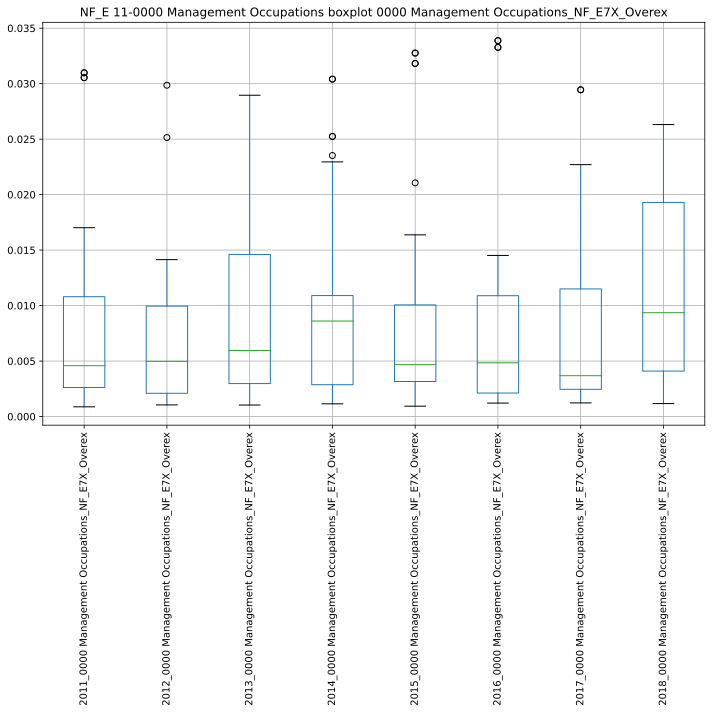

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/034920.922191:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034920.960793:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/034921.167031:INFO:headless_shell.cc(660)] Written to file /tmp/tmp6rq9srq7/temp.png.
[1014/034921.379959:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034921.418514:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/034921.710696:INFO:headless_shell.cc(660)] Written to file /tmp/tmp11z2r6ka/temp.png.
[1014/034921.971379:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034922.008075:WARNI

,2011_0000 Management Occupations_NF_E7X_Overex,2012_0000 Management Occupations_NF_E7X_Overex,2013_0000 Management Occupations_NF_E7X_Overex,2014_0000 Management Occupations_NF_E7X_Overex,2015_0000 Management Occupations_NF_E7X_Overex,2016_0000 Management Occupations_NF_E7X_Overex,2017_0000 Management Occupations_NF_E7X_Overex,2018_0000 Management Occupations_NF_E7X_Overex
2011_0000 Management Occupations_NF_E7X_Overex,1.000000,0.415914,0.370408,-0.025214,-0.064330,0.106971,0.251711,0.561278
2012_0000 Management Occupations_NF_E7X_Overex,0.415914,1.000000,0.371515,-0.108151,-0.034153,0.459069,0.291102,0.322789
2013_0000 Management Occupations_NF_E7X_Overex,0.370408,0.371515,1.000000,-0.282705,-0.128552,-0.039671,0.078111,-0.021524
2014_0000 Management Occupations_NF_E7X_Overex,-0.025214,-0.108151,-0.282705,1.000000,0.614839,0.124961,-0.023711,0.108890
2015_0000 Management Occupations_NF_E7X_Overex,-0.064330,-0.034153,-0.128552,0.614839,1.000000,-0.032685,-0.151268,-0.279817
2016_0000 Management Occupations_NF_E7X_Overex,0.106971,0.459069,-0.039671,0.124961,-0.032685,1.000000,0.563706,0.119776
2017_0000 Management Occupations_NF_E7X_Overex,0.251711,0.291102,0.078111,-0.023711,-0.151268,0.563706,1.000000,-0.107280
2018_0000 Management Occupations_NF_E7X_Overex,0.561278,0.322789,-0.021524,0.108890,-0.279817,0.119776,-0.107280,1.000000


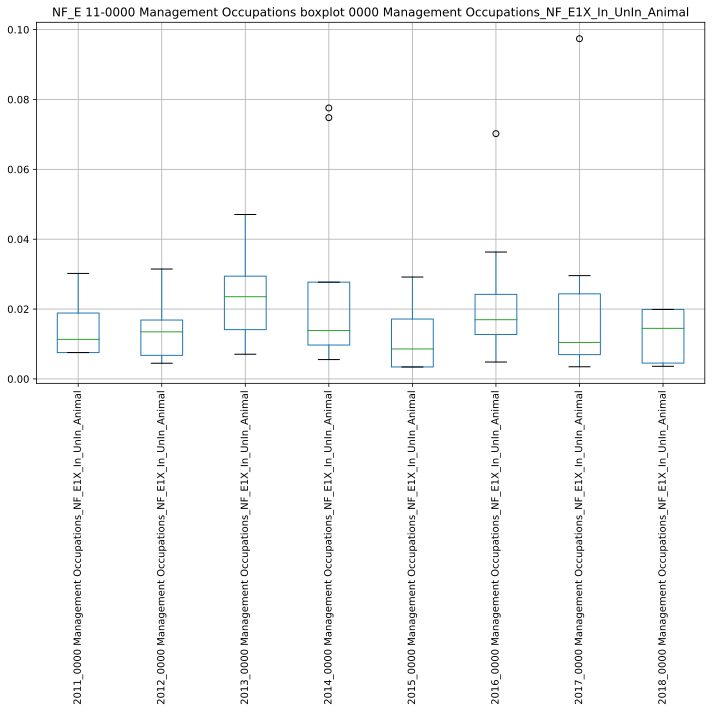

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/034924.971847:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034925.009878:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/034925.221101:INFO:headless_shell.cc(660)] Written to file /tmp/tmpkr_38sji/temp.png.
[1014/034925.437683:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034925.474914:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/034925.747055:INFO:headless_shell.cc(660)] Written to file /tmp/tmpb7g3m05x/temp.png.
[1014/034926.008815:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034926.045657:WARNI

,2011_0000 Management Occupations_NF_E1X_In_UnIn_Animal,2012_0000 Management Occupations_NF_E1X_In_UnIn_Animal,2013_0000 Management Occupations_NF_E1X_In_UnIn_Animal,2014_0000 Management Occupations_NF_E1X_In_UnIn_Animal,2015_0000 Management Occupations_NF_E1X_In_UnIn_Animal,2016_0000 Management Occupations_NF_E1X_In_UnIn_Animal,2017_0000 Management Occupations_NF_E1X_In_UnIn_Animal,2018_0000 Management Occupations_NF_E1X_In_UnIn_Animal
2011_0000 Management Occupations_NF_E1X_In_UnIn_Animal,1.000000,0.535294,0.027938,-0.364267,-0.043532,-0.170872,0.661044,0.364936
2012_0000 Management Occupations_NF_E1X_In_UnIn_Animal,0.535294,1.000000,-0.213173,-0.090480,-0.038976,-0.076299,-0.275434,0.303295
2013_0000 Management Occupations_NF_E1X_In_UnIn_Animal,0.027938,-0.213173,1.000000,-0.392546,0.200461,-0.581838,-0.176324,-0.591238
2014_0000 Management Occupations_NF_E1X_In_UnIn_Animal,-0.364267,-0.090480,-0.392546,1.000000,0.134882,0.713014,-0.169742,0.515072
2015_0000 Management Occupations_NF_E1X_In_UnIn_Animal,-0.043532,-0.038976,0.200461,0.134882,1.000000,0.232863,0.483661,0.026598
2016_0000 Management Occupations_NF_E1X_In_UnIn_Animal,-0.170872,-0.076299,-0.581838,0.713014,0.232863,1.000000,0.061842,0.589916
2017_0000 Management Occupations_NF_E1X_In_UnIn_Animal,0.661044,-0.275434,-0.176324,-0.169742,0.483661,0.061842,1.000000,0.246986
2018_0000 Management Occupations_NF_E1X_In_UnIn_Animal,0.364936,0.303295,-0.591238,0.515072,0.026598,0.589916,0.246986,1.000000


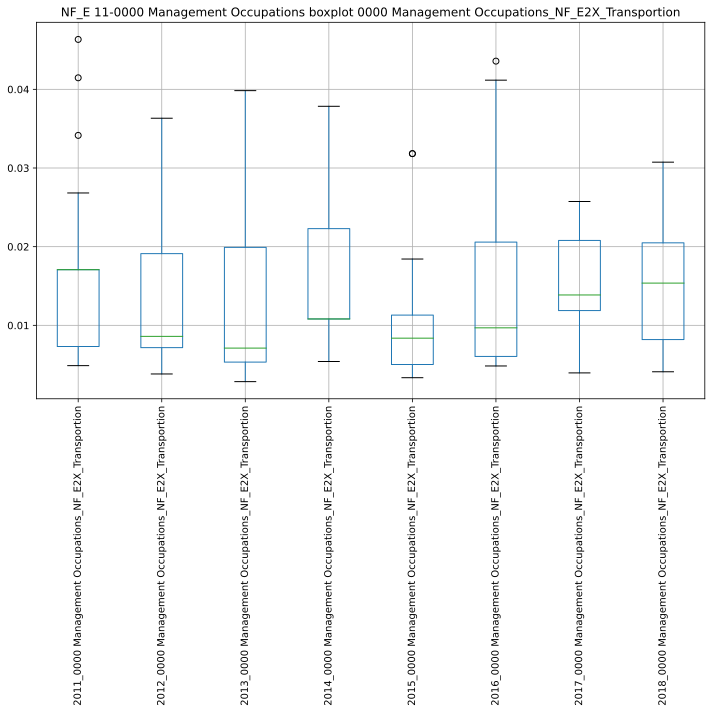

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/034928.686088:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034928.727709:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/034928.955657:INFO:headless_shell.cc(660)] Written to file /tmp/tmpkf7ccd9a/temp.png.
[1014/034929.173685:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034929.210466:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/034929.502319:INFO:headless_shell.cc(660)] Written to file /tmp/tmpe3hqhjbd/temp.png.
[1014/034929.759813:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034929.800470:WARNI

,2011_0000 Management Occupations_NF_E2X_Transportion,2012_0000 Management Occupations_NF_E2X_Transportion,2013_0000 Management Occupations_NF_E2X_Transportion,2014_0000 Management Occupations_NF_E2X_Transportion,2015_0000 Management Occupations_NF_E2X_Transportion,2016_0000 Management Occupations_NF_E2X_Transportion,2017_0000 Management Occupations_NF_E2X_Transportion,2018_0000 Management Occupations_NF_E2X_Transportion
2011_0000 Management Occupations_NF_E2X_Transportion,1.000000,0.055964,0.448423,0.236624,-0.322396,0.961973,-0.021566,0.474757
2012_0000 Management Occupations_NF_E2X_Transportion,0.055964,1.000000,0.246353,0.021654,-0.005031,0.338658,0.173180,0.524664
2013_0000 Management Occupations_NF_E2X_Transportion,0.448423,0.246353,1.000000,-0.315778,-0.179008,0.063983,0.296704,0.510471
2014_0000 Management Occupations_NF_E2X_Transportion,0.236624,0.021654,-0.315778,1.000000,-0.149564,0.204882,0.058015,0.189048
2015_0000 Management Occupations_NF_E2X_Transportion,-0.322396,-0.005031,-0.179008,-0.149564,1.000000,-0.388532,-0.154219,-0.384708
2016_0000 Management Occupations_NF_E2X_Transportion,0.961973,0.338658,0.063983,0.204882,-0.388532,1.000000,0.093439,0.490841
2017_0000 Management Occupations_NF_E2X_Transportion,-0.021566,0.173180,0.296704,0.058015,-0.154219,0.093439,1.000000,0.017080
2018_0000 Management Occupations_NF_E2X_Transportion,0.474757,0.524664,0.510471,0.189048,-0.384708,0.490841,0.017080,1.000000


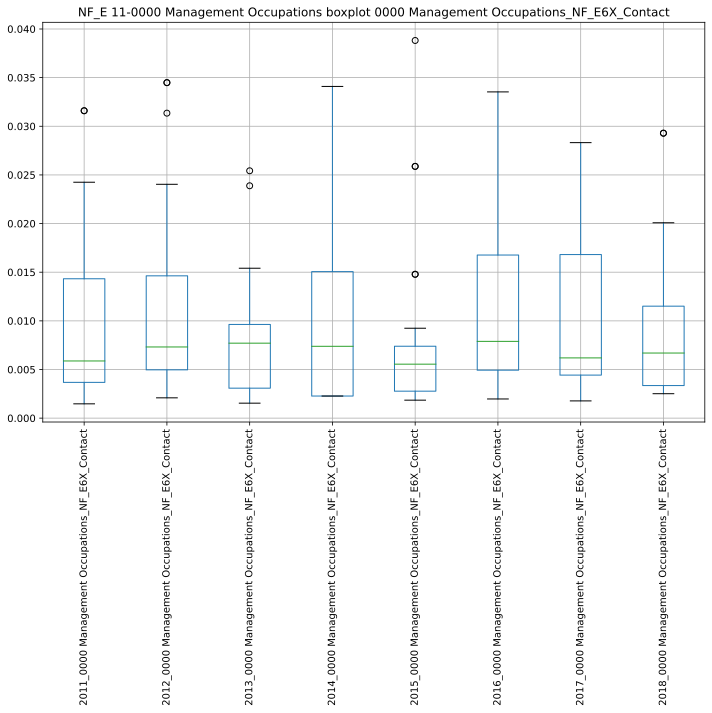

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/034932.429138:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034932.466008:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/034932.668631:INFO:headless_shell.cc(660)] Written to file /tmp/tmp4w_91jn0/temp.png.
[1014/034932.880479:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034932.919680:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/034933.218042:INFO:headless_shell.cc(660)] Written to file /tmp/tmpo9tikuj2/temp.png.
[1014/034933.476204:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034933.515918:WARNI

,2011_0000 Management Occupations_NF_E6X_Contact,2012_0000 Management Occupations_NF_E6X_Contact,2013_0000 Management Occupations_NF_E6X_Contact,2014_0000 Management Occupations_NF_E6X_Contact,2015_0000 Management Occupations_NF_E6X_Contact,2016_0000 Management Occupations_NF_E6X_Contact,2017_0000 Management Occupations_NF_E6X_Contact,2018_0000 Management Occupations_NF_E6X_Contact
2011_0000 Management Occupations_NF_E6X_Contact,1.000000,0.326956,0.027307,0.132521,-0.111119,0.144489,0.343146,-0.293373
2012_0000 Management Occupations_NF_E6X_Contact,0.326956,1.000000,0.323895,0.583726,0.279665,-0.047580,-0.061197,-0.139270
2013_0000 Management Occupations_NF_E6X_Contact,0.027307,0.323895,1.000000,0.194196,0.054877,-0.117030,0.094694,0.235034
2014_0000 Management Occupations_NF_E6X_Contact,0.132521,0.583726,0.194196,1.000000,0.107059,-0.389930,-0.207860,-0.325728
2015_0000 Management Occupations_NF_E6X_Contact,-0.111119,0.279665,0.054877,0.107059,1.000000,0.348588,-0.102890,0.700133
2016_0000 Management Occupations_NF_E6X_Contact,0.144489,-0.047580,-0.117030,-0.389930,0.348588,1.000000,0.742438,0.485427
2017_0000 Management Occupations_NF_E6X_Contact,0.343146,-0.061197,0.094694,-0.207860,-0.102890,0.742438,1.000000,0.127235
2018_0000 Management Occupations_NF_E6X_Contact,-0.293373,-0.139270,0.235034,-0.325728,0.700133,0.485427,0.127235,1.000000


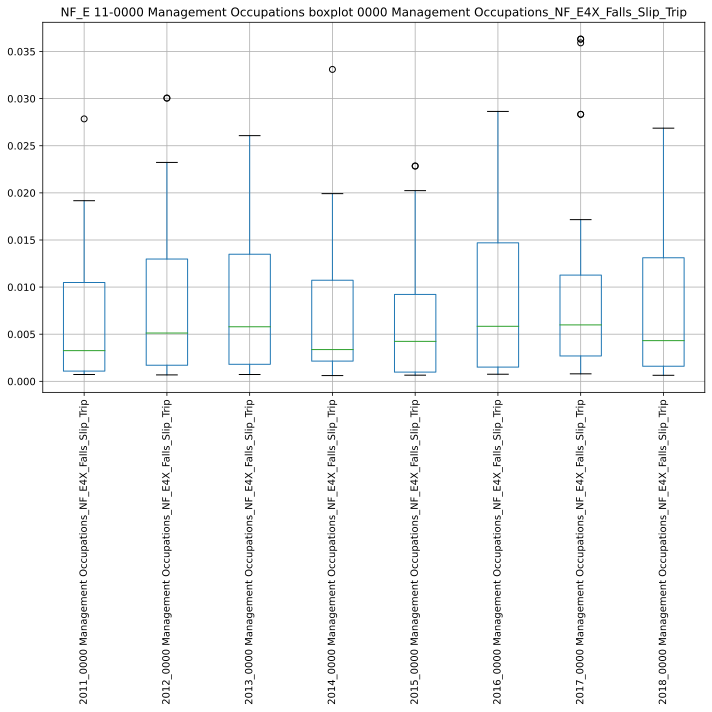

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/034936.211731:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034936.248663:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/034936.472946:INFO:headless_shell.cc(660)] Written to file /tmp/tmp0yfkm32e/temp.png.
[1014/034936.681544:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034936.720844:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/034936.999486:INFO:headless_shell.cc(660)] Written to file /tmp/tmpio88e0fp/temp.png.
[1014/034937.263780:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034937.301638:WARNI

,2011_0000 Management Occupations_NF_E4X_Falls_Slip_Trip,2012_0000 Management Occupations_NF_E4X_Falls_Slip_Trip,2013_0000 Management Occupations_NF_E4X_Falls_Slip_Trip,2014_0000 Management Occupations_NF_E4X_Falls_Slip_Trip,2015_0000 Management Occupations_NF_E4X_Falls_Slip_Trip,2016_0000 Management Occupations_NF_E4X_Falls_Slip_Trip,2017_0000 Management Occupations_NF_E4X_Falls_Slip_Trip,2018_0000 Management Occupations_NF_E4X_Falls_Slip_Trip
2011_0000 Management Occupations_NF_E4X_Falls_Slip_Trip,1.000000,0.293277,0.320525,0.550573,0.832420,0.283408,-0.015038,0.221412
2012_0000 Management Occupations_NF_E4X_Falls_Slip_Trip,0.293277,1.000000,0.559151,0.428702,0.614005,0.331014,-0.212353,-0.001520
2013_0000 Management Occupations_NF_E4X_Falls_Slip_Trip,0.320525,0.559151,1.000000,0.583909,0.683542,0.635086,-0.139962,0.438936
2014_0000 Management Occupations_NF_E4X_Falls_Slip_Trip,0.550573,0.428702,0.583909,1.000000,0.540547,0.339503,0.050679,0.247709
2015_0000 Management Occupations_NF_E4X_Falls_Slip_Trip,0.832420,0.614005,0.683542,0.540547,1.000000,0.244884,-0.382179,0.122832
2016_0000 Management Occupations_NF_E4X_Falls_Slip_Trip,0.283408,0.331014,0.635086,0.339503,0.244884,1.000000,0.091885,0.222948
2017_0000 Management Occupations_NF_E4X_Falls_Slip_Trip,-0.015038,-0.212353,-0.139962,0.050679,-0.382179,0.091885,1.000000,0.093374
2018_0000 Management Occupations_NF_E4X_Falls_Slip_Trip,0.221412,-0.001520,0.438936,0.247709,0.122832,0.222948,0.093374,1.000000


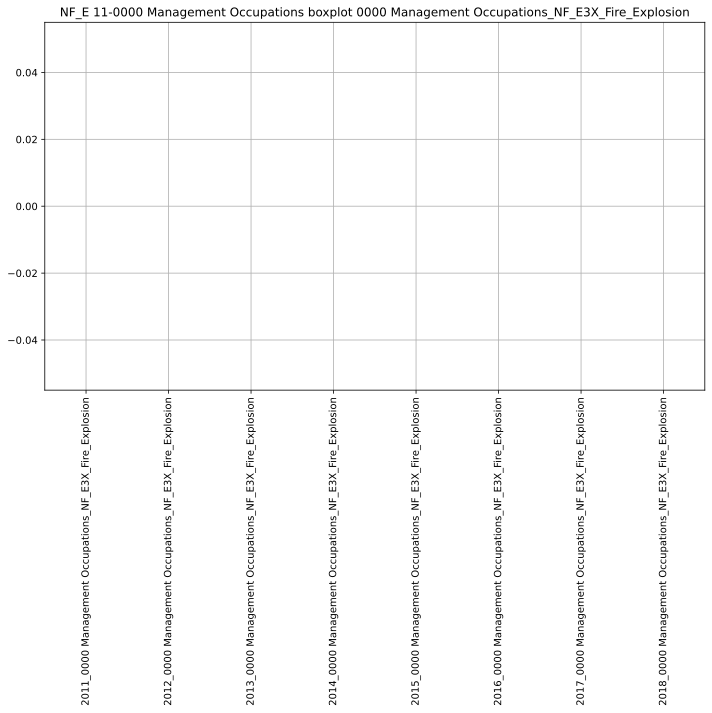

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/034939.916488:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034939.955389:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/034940.170575:INFO:headless_shell.cc(660)] Written to file /tmp/tmpu_i5a7tm/temp.png.
[1014/034940.375276:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034940.415729:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/034940.690811:INFO:headless_shell.cc(660)] Written to file /tmp/tmpdznswnzj/temp.png.
[1014/034940.953837:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034940.994325:WARNI

,2011_0000 Management Occupations_NF_E3X_Fire_Explosion,2012_0000 Management Occupations_NF_E3X_Fire_Explosion,2013_0000 Management Occupations_NF_E3X_Fire_Explosion,2014_0000 Management Occupations_NF_E3X_Fire_Explosion,2015_0000 Management Occupations_NF_E3X_Fire_Explosion,2016_0000 Management Occupations_NF_E3X_Fire_Explosion,2017_0000 Management Occupations_NF_E3X_Fire_Explosion,2018_0000 Management Occupations_NF_E3X_Fire_Explosion
2011_0000 Management Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Management Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Management Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Management Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Management Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Management Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Management Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Management Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan


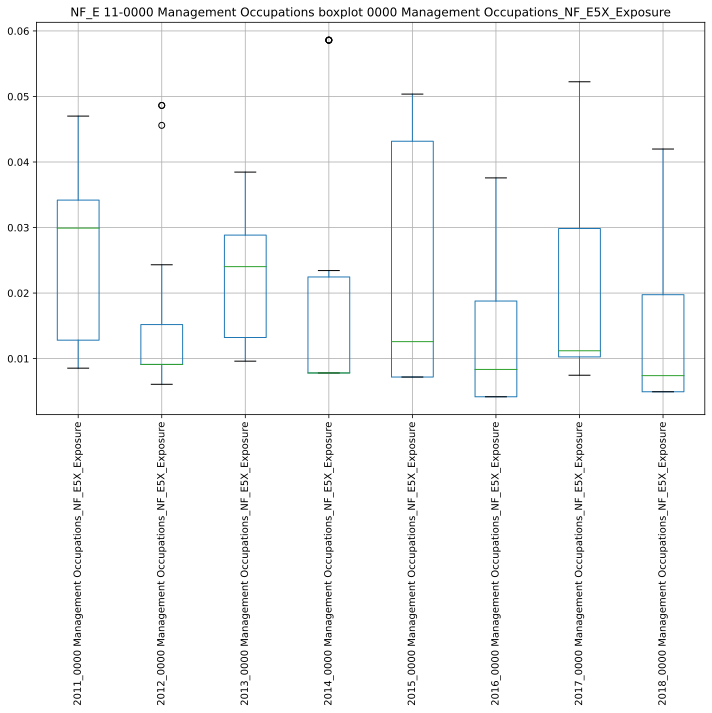

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/034943.588178:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034943.627458:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/034943.838834:INFO:headless_shell.cc(660)] Written to file /tmp/tmpuflgysa1/temp.png.
[1014/034944.044630:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034944.085819:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/034944.384574:INFO:headless_shell.cc(660)] Written to file /tmp/tmp1i6a9llm/temp.png.
[1014/034944.650366:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034944.688068:WARNI

,2011_0000 Management Occupations_NF_E5X_Exposure,2012_0000 Management Occupations_NF_E5X_Exposure,2013_0000 Management Occupations_NF_E5X_Exposure,2014_0000 Management Occupations_NF_E5X_Exposure,2015_0000 Management Occupations_NF_E5X_Exposure,2016_0000 Management Occupations_NF_E5X_Exposure,2017_0000 Management Occupations_NF_E5X_Exposure,2018_0000 Management Occupations_NF_E5X_Exposure
2011_0000 Management Occupations_NF_E5X_Exposure,1.000000,-0.536783,-0.051499,-0.203289,0.387319,0.356273,0.263529,0.711568
2012_0000 Management Occupations_NF_E5X_Exposure,-0.536783,1.000000,0.125890,-0.293788,0.053227,-0.195199,-0.149562,-0.428611
2013_0000 Management Occupations_NF_E5X_Exposure,-0.051499,0.125890,1.000000,-0.554119,-0.536446,-0.106067,-0.128550,-0.044427
2014_0000 Management Occupations_NF_E5X_Exposure,-0.203289,-0.293788,-0.554119,1.000000,0.325918,0.288576,0.754215,-0.020280
2015_0000 Management Occupations_NF_E5X_Exposure,0.387319,0.053227,-0.536446,0.325918,1.000000,0.277019,0.023197,-0.192906
2016_0000 Management Occupations_NF_E5X_Exposure,0.356273,-0.195199,-0.106067,0.288576,0.277019,1.000000,0.360321,0.238474
2017_0000 Management Occupations_NF_E5X_Exposure,0.263529,-0.149562,-0.128550,0.754215,0.023197,0.360321,1.000000,0.421276
2018_0000 Management Occupations_NF_E5X_Exposure,0.711568,-0.428611,-0.044427,-0.020280,-0.192906,0.238474,0.421276,1.000000


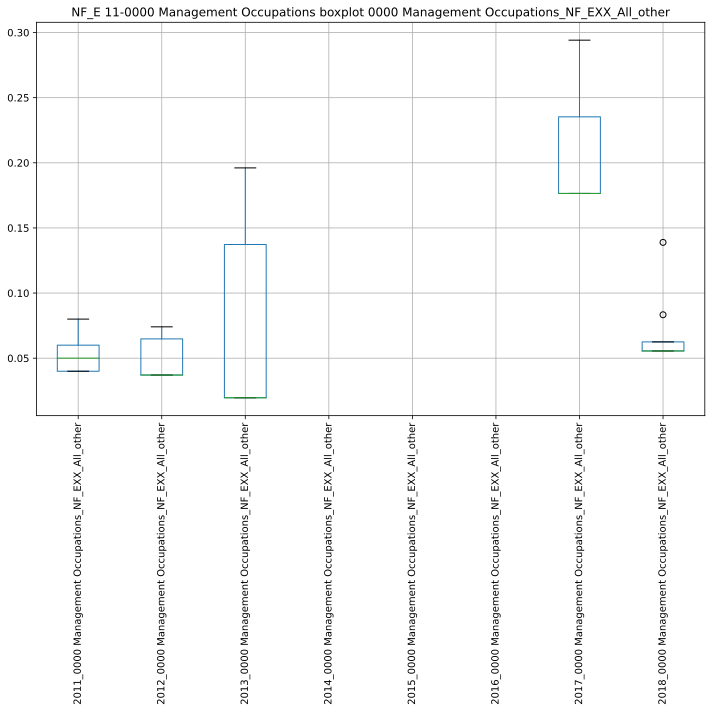

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/034947.522193:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034947.559154:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/034947.763515:INFO:headless_shell.cc(660)] Written to file /tmp/tmp9bn4x7yz/temp.png.
[1014/034948.040122:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034948.086346:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/034948.347669:INFO:headless_shell.cc(660)] Written to file /tmp/tmpn23_1ovd/temp.png.
[1014/034948.613710:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034948.652807:WARNI

,2011_0000 Management Occupations_NF_EXX_All_other,2012_0000 Management Occupations_NF_EXX_All_other,2013_0000 Management Occupations_NF_EXX_All_other,2014_0000 Management Occupations_NF_EXX_All_other,2015_0000 Management Occupations_NF_EXX_All_other,2016_0000 Management Occupations_NF_EXX_All_other,2017_0000 Management Occupations_NF_EXX_All_other,2018_0000 Management Occupations_NF_EXX_All_other
2011_0000 Management Occupations_NF_EXX_All_other,1.000000,0.218218,0.577350,nan,nan,nan,nan,-0.333333
2012_0000 Management Occupations_NF_EXX_All_other,0.218218,1.000000,nan,nan,nan,nan,-1.000000,nan
2013_0000 Management Occupations_NF_EXX_All_other,0.577350,nan,1.000000,nan,nan,nan,nan,0.569275
2014_0000 Management Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Management Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Management Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Management Occupations_NF_EXX_All_other,nan,-1.000000,nan,nan,nan,nan,1.000000,nan
2018_0000 Management Occupations_NF_EXX_All_other,-0.333333,nan,0.569275,nan,nan,nan,nan,1.000000


########################################## CORRELATIONS ###############################################
['11-0000 Management Occupations_NF_E7X_Overex', '11-0000 Management Occupations_NF_E1X_In_UnIn_Animal', '11-0000 Management Occupations_NF_E2X_Transportion', '11-0000 Management Occupations_NF_E6X_Contact', '11-0000 Management Occupations_NF_E4X_Falls_Slip_Trip', '11-0000 Management Occupations_NF_E3X_Fire_Explosion', '11-0000 Management Occupations_NF_E5X_Exposure', '11-0000 Management Occupations_NF_EXX_All_other']


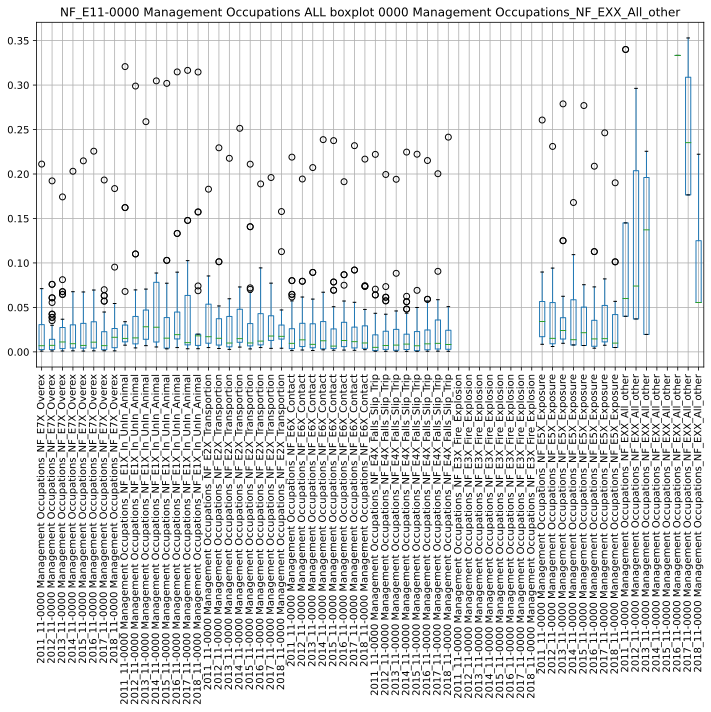

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/034957.338774:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034957.396326:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/034957.839208:INFO:headless_shell.cc(660)] Written to file /tmp/tmp4idqalhx/temp.png.
[1014/034958.057987:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034958.099552:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/034958.751415:INFO:headless_shell.cc(660)] Written to file /tmp/tmpja05ovtf/temp.png.
[1014/034959.117095:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/034959.155886:WARNI

,2011_11-0000 Management Occupations_NF_E7X_Overex,2012_11-0000 Management Occupations_NF_E7X_Overex,2013_11-0000 Management Occupations_NF_E7X_Overex,2014_11-0000 Management Occupations_NF_E7X_Overex,2015_11-0000 Management Occupations_NF_E7X_Overex,2016_11-0000 Management Occupations_NF_E7X_Overex,2017_11-0000 Management Occupations_NF_E7X_Overex,2018_11-0000 Management Occupations_NF_E7X_Overex,2011_11-0000 Management Occupations_NF_E1X_In_UnIn_Animal,2012_11-0000 Management Occupations_NF_E1X_In_UnIn_Animal,2013_11-0000 Management Occupations_NF_E1X_In_UnIn_Animal,2014_11-0000 Management Occupations_NF_E1X_In_UnIn_Animal,2015_11-0000 Management Occupations_NF_E1X_In_UnIn_Animal,2016_11-0000 Management Occupations_NF_E1X_In_UnIn_Animal,2017_11-0000 Management Occupations_NF_E1X_In_UnIn_Animal,2018_11-0000 Management Occupations_NF_E1X_In_UnIn_Animal,2011_11-0000 Management Occupations_NF_E2X_Transportion,2012_11-0000 Management Occupations_NF_E2X_Transportion,2013_11-0000 Management Occupations_NF_E2X_Transportion,2014_11-0000 Management Occupations_NF_E2X_Transportion,2015_11-0000 Management Occupations_NF_E2X_Transportion,2016_11-0000 Management Occupations_NF_E2X_Transportion,2017_11-0000 Management Occupations_NF_E2X_Transportion,2018_11-0000 Management Occupations_NF_E2X_Transportion,2011_11-0000 Management Occupations_NF_E6X_Contact,2012_11-0000 Management Occupations_NF_E6X_Contact,2013_11-0000 Management Occupations_NF_E6X_Contact,2014_11-0000 Management Occupations_NF_E6X_Contact,2015_11-0000 Management Occupations_NF_E6X_Contact,2016_11-0000 Management Occupations_NF_E6X_Contact,2017_11-0000 Management Occupations_NF_E6X_Contact,2018_11-0000 Management Occupations_NF_E6X_Contact,2011_11-0000 Management Occupations_NF_E4X_Falls_Slip_Trip,2012_11-0000 Management Occupations_NF_E4X_Falls_Slip_Trip,2013_11-0000 Management Occupations_NF_E4X_Falls_Slip_Trip,2014_11-0000 Management Occupations_NF_E4X_Falls_Slip_Trip,2015_11-0000 Management Occupations_NF_E4X_Falls_Slip_Trip,2016_11-0000 Management Occupations_NF_E4X_Falls_Slip_Trip,2017_11-0000 Management Occupations_NF_E4X_Falls_Slip_Trip,2018_11-0000 Management Occupations_NF_E4X_Falls_Slip_Trip,2011_11-0000 Management Occupations_NF_E3X_Fire_Explosion,2012_11-0000 Management Occupations_NF_E3X_Fire_Explosion,2013_11-0000 Management Occupations_NF_E3X_Fire_Explosion,2014_11-0000 Management Occupations_NF_E3X_Fire_Explosion,2015_11-0000 Management Occupations_NF_E3X_Fire_Explosion,2016_11-0000 Management Occupations_NF_E3X_Fire_Explosion,2017_11-0000 Management Occupations_NF_E3X_Fire_Explosion,2018_11-0000 Management Occupations_NF_E3X_Fire_Explosion,2011_11-0000 Management Occupations_NF_E5X_Exposure,2012_11-0000 Management Occupations_NF_E5X_Exposure,2013_11-0000 Management Occupations_NF_E5X_Exposure,2014_11-0000 Management Occupations_NF_E5X_Exposure,2015_11-0000 Management Occupations_NF_E5X_Exposure,2016_11-0000 Management Occupations_NF_E5X_Exposure,2017_11-0000 Management Occupations_NF_E5X_Exposure,2018_11-0000 Management Occupations_NF_E5X_Exposure,2011_11-0000 Management Occupations_NF_EXX_All_other,2012_11-0000 Management Occupations_NF_EXX_All_other,2013_11-0000 Management Occupations_NF_EXX_All_other,2014_11-0000 Management Occupations_NF_EXX_All_other,2015_11-0000 Management Occupations_NF_EXX_All_other,2016_11-0000 Management Occupations_NF_EXX_All_other,2017_11-0000 Management Occupations_NF_EXX_All_other,2018_11-0000 Management Occupations_NF_EXX_All_other
2011_11-0000 Management Occupations_NF_E7X_Overex,1.000000,0.041082,0.054530,0.004981,-0.043054,-0.004102,-0.055527,0.070272,0.068853,-0.067368,0.672640,-0.049106,-0.078958,-0.123647,0.166911,0.352129,0.159652,0.048024,-0.081605,0.001594,-0.060311,-0.020696,-0.166478,0.054122,-0.011816,0.063638,0.006433,-0.100540,0.175912,0.063072,0.319265,-0.009397,0.008266,0.019233,-0.036608,-0.037633,0.020410,-0.016080,-0.111613,-0.027494,nan,nan,nan,nan,nan,nan,nan,nan,-0.033093,0.085161,0.518639,-0.165653,-0.0

########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
NF_E7X_Overex_all.csv
NF_E1X_In_UnIn_Animal_all.csv
NF_E2X_Transportion_all.csv
NF_E6X_Contact_all.csv
NF_E4X_Falls_Slip_Trip_all.csv
NF_E3X_Fire_Explosion_all.csv
NF_E5X_Exposure_all.csv
NF_EXX_All_other_all.csv
dict_keys(['NF_E7X_Overex', 'NF_E1X_In_UnIn_Animal', 'NF_E2X_Transportion', 'NF_E6X_Contact', 'NF_E4X_Falls_Slip_Trip', 'NF_E3X_Fire_Explosion', 'NF_E5X_Exposure', 'NF_EXX_All_other'])
############ OCCUPATION ############
13-0000 Business and Financial Operations Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
13-0000 Business and Financial Operations Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVA

/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
NF_E7X_Overex_all.csv
NF_E1X_In_UnIn_Animal_all.csv
NF_E2X_Transportion_all.csv
NF_E6X_Contact_all.csv
NF_E4X_Falls_Slip_Trip_all.csv
NF_E3X_Fire_Explosion_all.csv
NF_E5X_Exposure_all.csv
NF_EXX_All_other_all.csv
dict_keys(['NF_E7X_Overex', 'NF_E1X_In_UnIn_Animal', 'NF_E2X_Transportion', 'NF_E6X_Contact', 'NF_E4X_Falls_Slip_Trip', 'NF_E3X_Fire_Explosion', 'NF_E5X_Exposure', 'NF_EXX_All_other'])
############ OCCUPATION ############
13-0000 Business and Financial Operations Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
13-0000 Business and Financial Operations Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
13-0000 Business and Financial Operations Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
#######

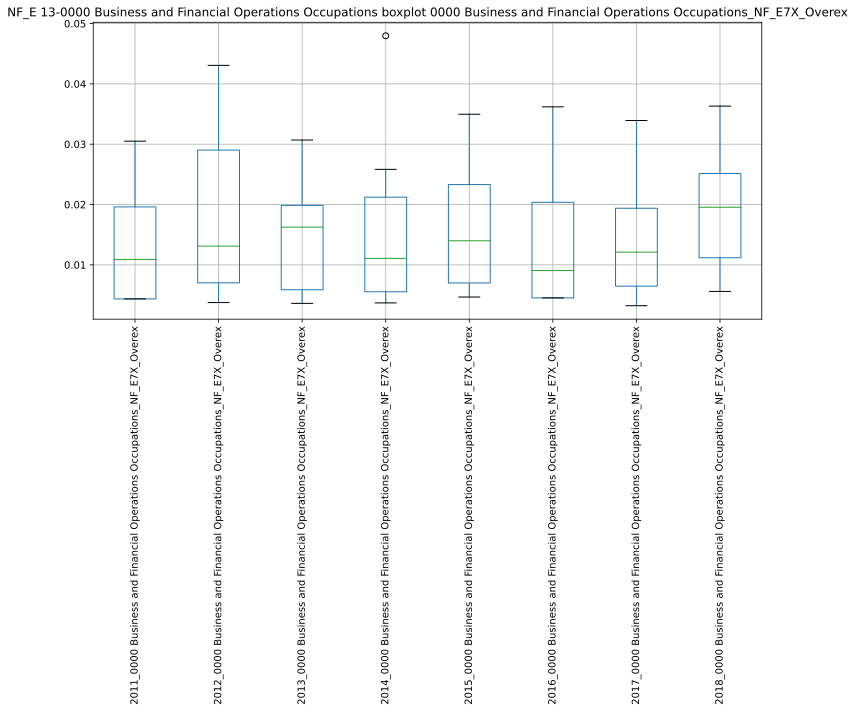

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/035717.188742:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035717.226164:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/035717.460012:INFO:headless_shell.cc(660)] Written to file /tmp/tmp_r27qgh9/temp.png.
[1014/035717.684244:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035717.722781:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/035718.020977:INFO:headless_shell.cc(660)] Written to file /tmp/tmpwhl5njf7/temp.png.
[1014/035718.289910:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035718.327340:WARNI

,2011_0000 Business and Financial Operations Occupations_NF_E7X_Overex,2012_0000 Business and Financial Operations Occupations_NF_E7X_Overex,2013_0000 Business and Financial Operations Occupations_NF_E7X_Overex,2014_0000 Business and Financial Operations Occupations_NF_E7X_Overex,2015_0000 Business and Financial Operations Occupations_NF_E7X_Overex,2016_0000 Business and Financial Operations Occupations_NF_E7X_Overex,2017_0000 Business and Financial Operations Occupations_NF_E7X_Overex,2018_0000 Business and Financial Operations Occupations_NF_E7X_Overex
2011_0000 Business and Financial Operations Occupations_NF_E7X_Overex,1.000000,-0.083029,0.316528,0.414459,0.506049,0.195121,0.729367,0.279762
2012_0000 Business and Financial Operations Occupations_NF_E7X_Overex,-0.083029,1.000000,0.003597,0.380708,-0.226082,0.308497,0.156127,0.401068
2013_0000 Business and Financial Operations Occupations_NF_E7X_Overex,0.316528,0.003597,1.000000,0.055711,0.088687,-0.068196,0.442923,0.602410
2014_0000 Business and Financial Operations Occupations_NF_E7X_Overex,0.414459,0.380708,0.055711,1.000000,0.345151,0.634385,0.249688,0.147180
2015_0000 Business and Financial Operations Occupations_NF_E7X_Overex,0.506049,-0.226082,0.088687,0.345151,1.000000,0.116562,0.271983,0.050672
2016_0000 Business and Financial Operations Occupations_NF_E7X_Overex,0.195121,0.308497,-0.068196,0.634385,0.116562,1.000000,0.173357,-0.012522
2017_0000 Business and Financial Operations Occupations_NF_E7X_Overex,0.729367,0.156127,0.442923,0.249688,0.271983,0.173357,1.000000,0.236483
2018_0000 Business and Financial Operations Occupations_NF_E7X_Overex,0.279762,0.401068,0.602410,0.147180,0.050672,-0.012522,0.236483,1.000000


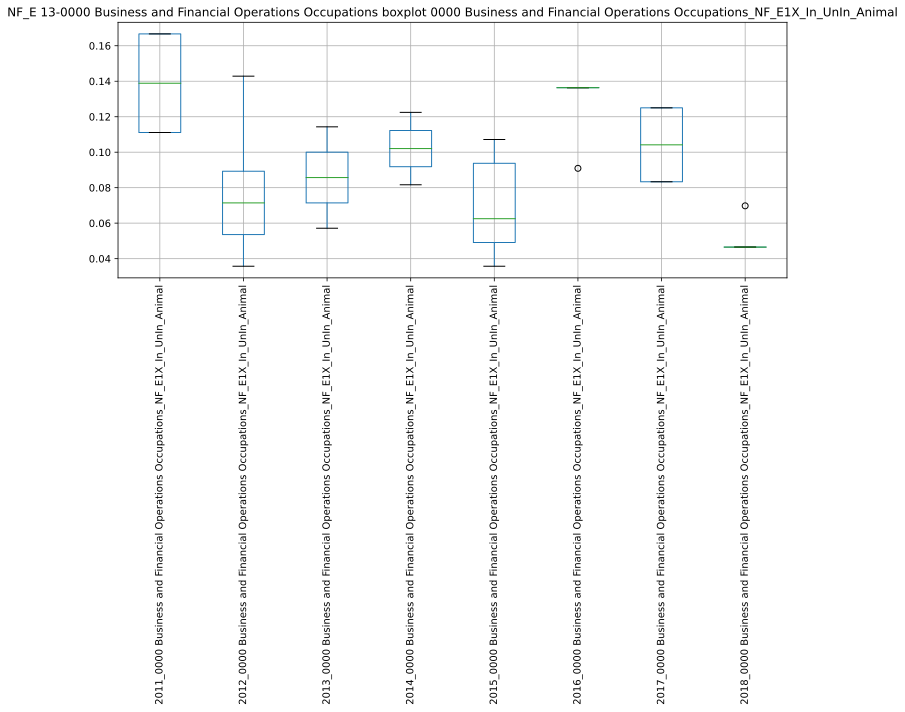

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/035722.386196:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035722.427844:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/035722.649909:INFO:headless_shell.cc(660)] Written to file /tmp/tmpsckzwvl9/temp.png.
[1014/035722.863026:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035722.900382:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/035723.201566:INFO:headless_shell.cc(660)] Written to file /tmp/tmpxehtpou9/temp.png.
[1014/035723.469254:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035723.508036:WARNI

,2011_0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,2012_0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,2013_0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,2014_0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,2015_0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,2016_0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,2017_0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,2018_0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal
2011_0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,1.000000,1.000000,nan,1.000000,nan,nan,nan,nan
2012_0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,1.000000,1.000000,-0.775880,0.872872,-0.677908,nan,1.000000,-0.200000
2013_0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,nan,-0.775880,1.000000,0.456435,-0.555064,0.801784,nan,nan
2014_0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,1.000000,0.872872,0.456435,1.000000,-0.853913,1.000000,nan,-0.801784
2015_0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,nan,-0.677908,-0.555064,-0.853913,1.000000,-0.870388,nan,0.912871
2016_0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,nan,nan,0.801784,1.000000,-0.870388,1.000000,nan,nan
2017_0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,nan,1.000000,nan,nan,nan,nan,1.000000,nan
2018_0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,nan,-0.200000,nan,-0.801784,0.912871,nan,nan,1.000000


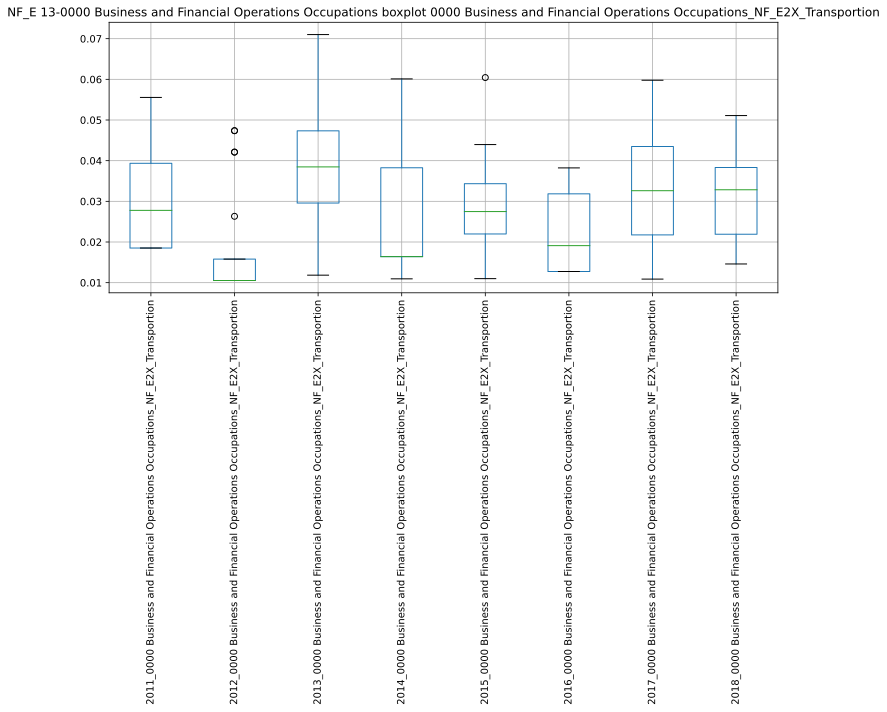

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/035727.536214:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035727.574050:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/035727.790110:INFO:headless_shell.cc(660)] Written to file /tmp/tmp_oxj27lb/temp.png.
[1014/035728.017721:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035728.056455:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/035728.335200:INFO:headless_shell.cc(660)] Written to file /tmp/tmplnq51urs/temp.png.
[1014/035728.609494:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035728.648156:WARNI

,2011_0000 Business and Financial Operations Occupations_NF_E2X_Transportion,2012_0000 Business and Financial Operations Occupations_NF_E2X_Transportion,2013_0000 Business and Financial Operations Occupations_NF_E2X_Transportion,2014_0000 Business and Financial Operations Occupations_NF_E2X_Transportion,2015_0000 Business and Financial Operations Occupations_NF_E2X_Transportion,2016_0000 Business and Financial Operations Occupations_NF_E2X_Transportion,2017_0000 Business and Financial Operations Occupations_NF_E2X_Transportion,2018_0000 Business and Financial Operations Occupations_NF_E2X_Transportion
2011_0000 Business and Financial Operations Occupations_NF_E2X_Transportion,1.000000,-0.790569,0.198698,-0.054169,0.399750,0.042796,-0.176263,-0.428802
2012_0000 Business and Financial Operations Occupations_NF_E2X_Transportion,-0.790569,1.000000,0.131738,-0.014691,0.195120,-0.763100,-0.252165,0.486928
2013_0000 Business and Financial Operations Occupations_NF_E2X_Transportion,0.198698,0.131738,1.000000,0.188805,-0.167264,0.006153,-0.043038,-0.069876
2014_0000 Business and Financial Operations Occupations_NF_E2X_Transportion,-0.054169,-0.014691,0.188805,1.000000,-0.163587,-0.065716,0.024571,-0.157144
2015_0000 Business and Financial Operations Occupations_NF_E2X_Transportion,0.399750,0.195120,-0.167264,-0.163587,1.000000,-0.321627,-0.082127,0.682782
2016_0000 Business and Financial Operations Occupations_NF_E2X_Transportion,0.042796,-0.763100,0.006153,-0.065716,-0.321627,1.000000,0.438567,-0.169003
2017_0000 Business and Financial Operations Occupations_NF_E2X_Transportion,-0.176263,-0.252165,-0.043038,0.024571,-0.082127,0.438567,1.000000,0.508544
2018_0000 Business and Financial Operations Occupations_NF_E2X_Transportion,-0.428802,0.486928,-0.069876,-0.157144,0.682782,-0.169003,0.508544,1.000000


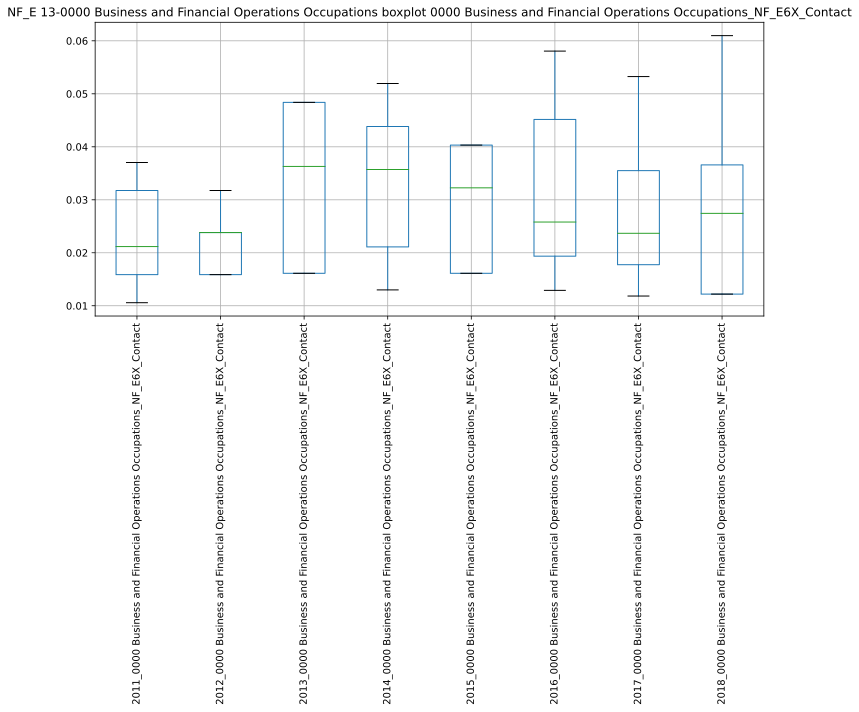

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/035732.841917:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035732.879219:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/035733.107643:INFO:headless_shell.cc(660)] Written to file /tmp/tmp9fe10jvg/temp.png.
[1014/035733.321612:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035733.359450:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/035733.653820:INFO:headless_shell.cc(660)] Written to file /tmp/tmpb3pat4x6/temp.png.
[1014/035733.945729:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035733.973965:WARNI

,2011_0000 Business and Financial Operations Occupations_NF_E6X_Contact,2012_0000 Business and Financial Operations Occupations_NF_E6X_Contact,2013_0000 Business and Financial Operations Occupations_NF_E6X_Contact,2014_0000 Business and Financial Operations Occupations_NF_E6X_Contact,2015_0000 Business and Financial Operations Occupations_NF_E6X_Contact,2016_0000 Business and Financial Operations Occupations_NF_E6X_Contact,2017_0000 Business and Financial Operations Occupations_NF_E6X_Contact,2018_0000 Business and Financial Operations Occupations_NF_E6X_Contact
2011_0000 Business and Financial Operations Occupations_NF_E6X_Contact,1.000000,0.084108,-0.514336,-0.300036,0.158114,-0.302550,0.079028,-0.312798
2012_0000 Business and Financial Operations Occupations_NF_E6X_Contact,0.084108,1.000000,-0.473950,-0.662500,-0.597614,-0.249688,-0.323230,-0.514072
2013_0000 Business and Financial Operations Occupations_NF_E6X_Contact,-0.514336,-0.473950,1.000000,0.352527,-0.285391,0.073794,-0.034065,0.800523
2014_0000 Business and Financial Operations Occupations_NF_E6X_Contact,-0.300036,-0.662500,0.352527,1.000000,0.322873,-0.018044,0.381546,0.371411
2015_0000 Business and Financial Operations Occupations_NF_E6X_Contact,0.158114,-0.597614,-0.285391,0.322873,1.000000,-0.077414,0.287482,0.125265
2016_0000 Business and Financial Operations Occupations_NF_E6X_Contact,-0.302550,-0.249688,0.073794,-0.018044,-0.077414,1.000000,-0.049549,0.052701
2017_0000 Business and Financial Operations Occupations_NF_E6X_Contact,0.079028,-0.323230,-0.034065,0.381546,0.287482,-0.049549,1.000000,0.290883
2018_0000 Business and Financial Operations Occupations_NF_E6X_Contact,-0.312798,-0.514072,0.800523,0.371411,0.125265,0.052701,0.290883,1.000000


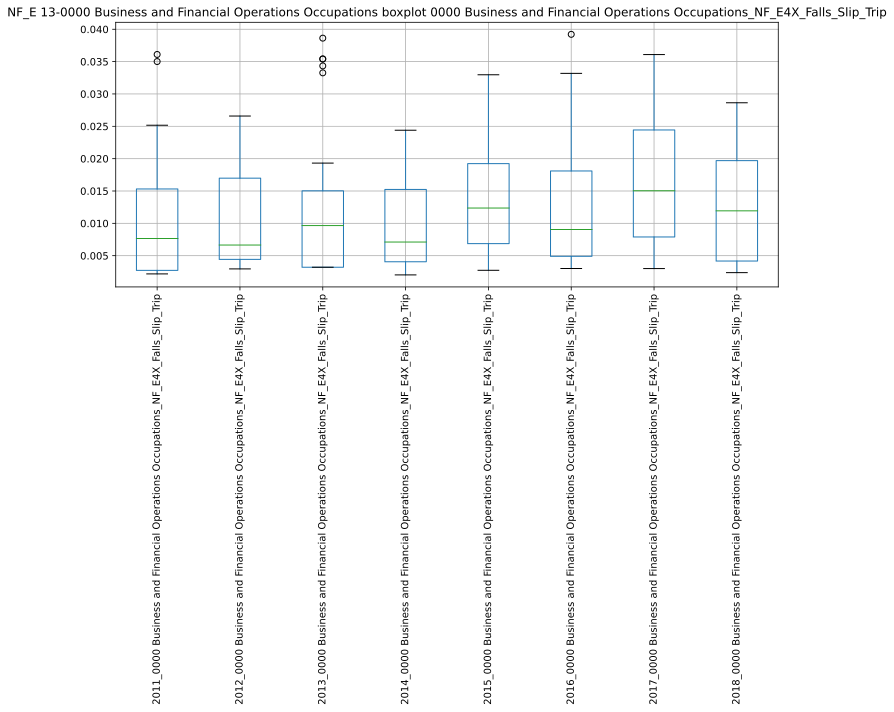

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/035738.052131:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035738.089848:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/035738.309607:INFO:headless_shell.cc(660)] Written to file /tmp/tmp0kpvm930/temp.png.
[1014/035738.526519:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035738.564181:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/035738.847482:INFO:headless_shell.cc(660)] Written to file /tmp/tmp7qow24bq/temp.png.
[1014/035739.136535:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035739.164487:WARNI

,2011_0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,2012_0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,2013_0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,2014_0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,2015_0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,2016_0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,2017_0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,2018_0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip
2011_0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,1.000000,0.202070,0.317382,0.214543,0.010249,0.597822,0.179113,0.218985
2012_0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,0.202070,1.000000,-0.293668,0.149823,0.344978,0.703364,-0.086798,0.758812
2013_0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,0.317382,-0.293668,1.000000,0.068763,0.283018,0.349424,0.292230,0.023721
2014_0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,0.214543,0.149823,0.068763,1.000000,0.516082,0.504048,0.060808,0.321349
2015_0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,0.010249,0.344978,0.283018,0.516082,1.000000,0.544902,0.006610,0.514438
2016_0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,0.597822,0.703364,0.349424,0.504048,0.544902,1.000000,0.294667,0.639718
2017_0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,0.179113,-0.086798,0.292230,0.060808,0.006610,0.294667,1.000000,0.240268
2018_0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,0.218985,0.758812,0.023721,0.321349,0.514438,0.639718,0.240268,1.000000


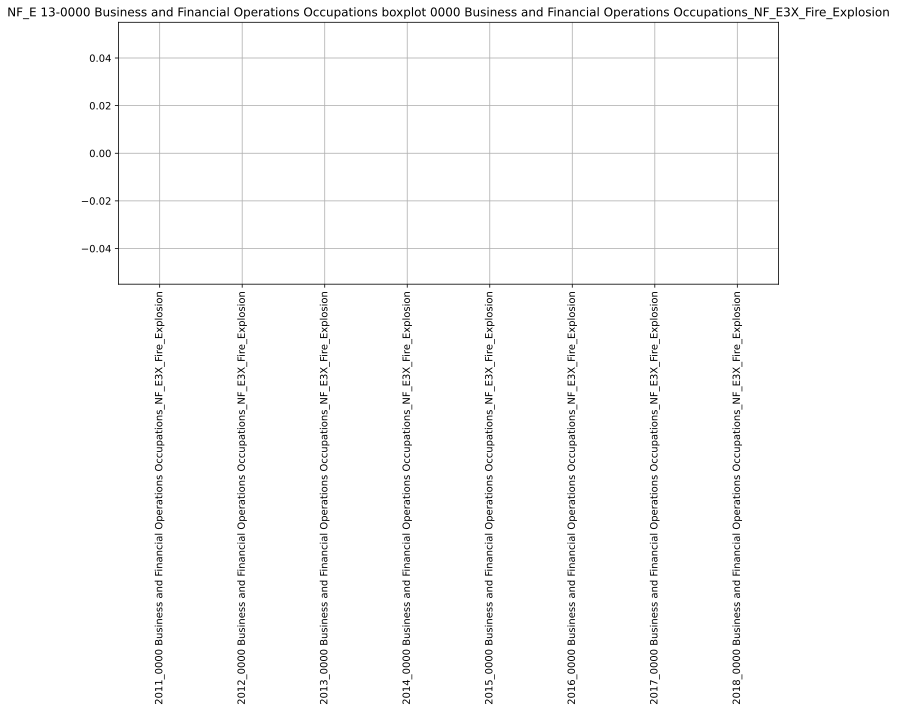

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/035743.252085:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035743.289650:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/035743.517700:INFO:headless_shell.cc(660)] Written to file /tmp/tmpsahfg19r/temp.png.
[1014/035743.738180:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035743.776962:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/035744.054010:INFO:headless_shell.cc(660)] Written to file /tmp/tmpwln903dr/temp.png.
[1014/035744.320568:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035744.357971:WARNI

,2011_0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,2012_0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,2013_0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,2014_0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,2015_0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,2016_0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,2017_0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,2018_0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion
2011_0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan


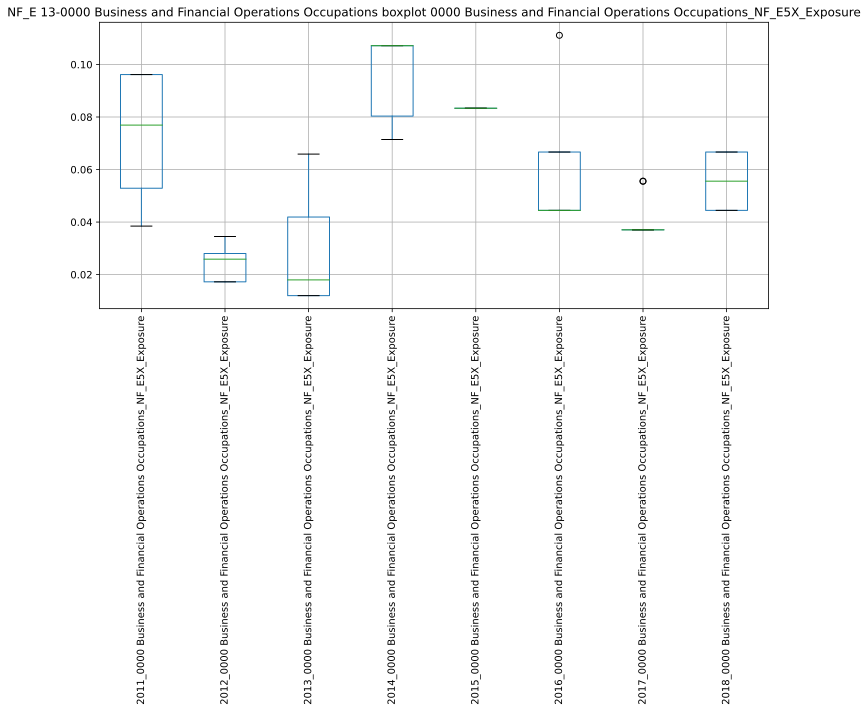

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/035748.329714:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035748.369201:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/035748.589518:INFO:headless_shell.cc(660)] Written to file /tmp/tmpi15sj59w/temp.png.
[1014/035748.811130:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035748.851054:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/035749.160113:INFO:headless_shell.cc(660)] Written to file /tmp/tmp2t5tblqs/temp.png.
[1014/035749.427277:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035749.466118:WARNI

,2011_0000 Business and Financial Operations Occupations_NF_E5X_Exposure,2012_0000 Business and Financial Operations Occupations_NF_E5X_Exposure,2013_0000 Business and Financial Operations Occupations_NF_E5X_Exposure,2014_0000 Business and Financial Operations Occupations_NF_E5X_Exposure,2015_0000 Business and Financial Operations Occupations_NF_E5X_Exposure,2016_0000 Business and Financial Operations Occupations_NF_E5X_Exposure,2017_0000 Business and Financial Operations Occupations_NF_E5X_Exposure,2018_0000 Business and Financial Operations Occupations_NF_E5X_Exposure
2011_0000 Business and Financial Operations Occupations_NF_E5X_Exposure,1.000000,-0.534522,-0.678064,0.755929,nan,-0.229416,nan,0.666667
2012_0000 Business and Financial Operations Occupations_NF_E5X_Exposure,-0.534522,1.000000,-0.314102,0.577350,nan,0.441726,-0.108465,0.166667
2013_0000 Business and Financial Operations Occupations_NF_E5X_Exposure,-0.678064,-0.314102,1.000000,-0.987878,nan,0.533348,-0.511682,-0.282216
2014_0000 Business and Financial Operations Occupations_NF_E5X_Exposure,0.755929,0.577350,-0.987878,1.000000,nan,nan,nan,1.000000
2015_0000 Business and Financial Operations Occupations_NF_E5X_Exposure,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Business and Financial Operations Occupations_NF_E5X_Exposure,-0.229416,0.441726,0.533348,nan,nan,1.000000,-0.577350,1.000000
2017_0000 Business and Financial Operations Occupations_NF_E5X_Exposure,nan,-0.108465,-0.511682,nan,nan,-0.577350,1.000000,-0.577350
2018_0000 Business and Financial Operations Occupations_NF_E5X_Exposure,0.666667,0.166667,-0.282216,1.000000,nan,1.000000,-0.577350,1.000000


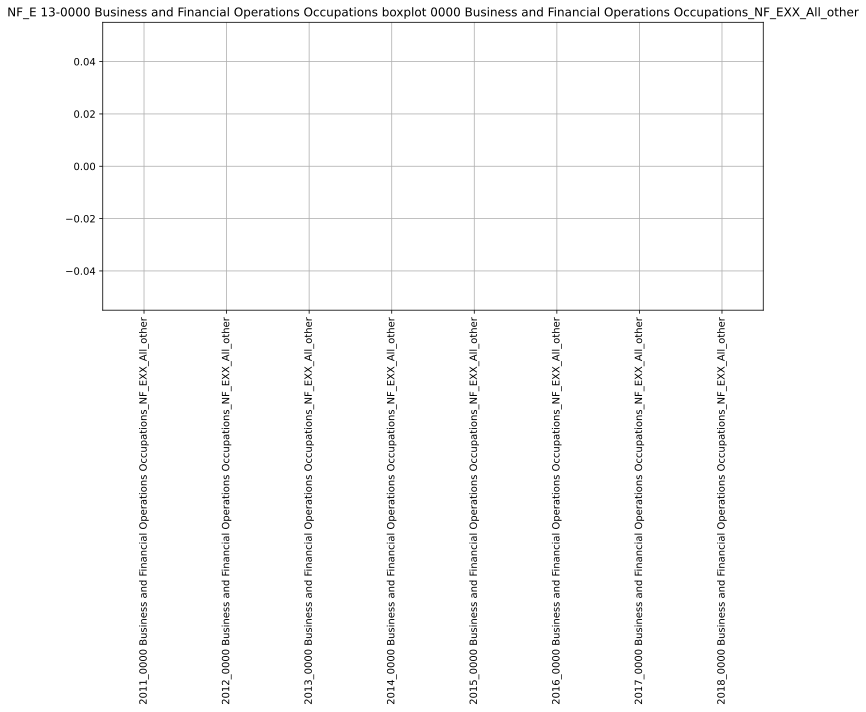

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/035753.476972:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035753.514121:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/035753.749543:INFO:headless_shell.cc(660)] Written to file /tmp/tmpoesv5j5d/temp.png.
[1014/035753.964063:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035754.001805:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/035754.312251:INFO:headless_shell.cc(660)] Written to file /tmp/tmplkv2amn1/temp.png.
[1014/035754.579355:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035754.616598:WARNI

,2011_0000 Business and Financial Operations Occupations_NF_EXX_All_other,2012_0000 Business and Financial Operations Occupations_NF_EXX_All_other,2013_0000 Business and Financial Operations Occupations_NF_EXX_All_other,2014_0000 Business and Financial Operations Occupations_NF_EXX_All_other,2015_0000 Business and Financial Operations Occupations_NF_EXX_All_other,2016_0000 Business and Financial Operations Occupations_NF_EXX_All_other,2017_0000 Business and Financial Operations Occupations_NF_EXX_All_other,2018_0000 Business and Financial Operations Occupations_NF_EXX_All_other
2011_0000 Business and Financial Operations Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Business and Financial Operations Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Business and Financial Operations Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Business and Financial Operations Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Business and Financial Operations Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Business and Financial Operations Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Business and Financial Operations Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Business and Financial Operations Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['13-0000 Business and Financial Operations Occupations_NF_E7X_Overex', '13-0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal', '13-0000 Business and Financial Operations Occupations_NF_E2X_Transportion', '13-0000 Business and Financial Operations Occupations_NF_E6X_Contact', '13-0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip', '13-0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion', '13-0000 Business and Financial Operations Occupations_NF_E5X_Exposure', '13-0000 Business and Financial Operations Occupations_NF_EXX_All_other']


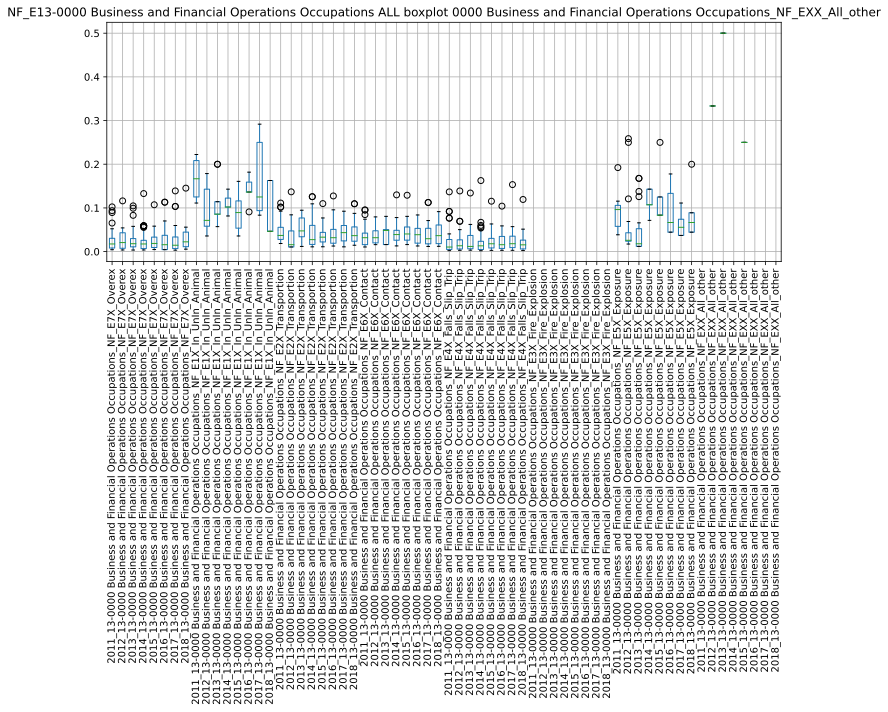

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/035805.523629:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035805.560569:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/035806.045305:INFO:headless_shell.cc(660)] Written to file /tmp/tmpr_dkrk61/temp.png.
[1014/035806.272956:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035806.310110:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/035806.969022:INFO:headless_shell.cc(660)] Written to file /tmp/tmpt12abi_w/temp.png.
[1014/035807.293392:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/035807.330691:WARNI

,2011_13-0000 Business and Financial Operations Occupations_NF_E7X_Overex,2012_13-0000 Business and Financial Operations Occupations_NF_E7X_Overex,2013_13-0000 Business and Financial Operations Occupations_NF_E7X_Overex,2014_13-0000 Business and Financial Operations Occupations_NF_E7X_Overex,2015_13-0000 Business and Financial Operations Occupations_NF_E7X_Overex,2016_13-0000 Business and Financial Operations Occupations_NF_E7X_Overex,2017_13-0000 Business and Financial Operations Occupations_NF_E7X_Overex,2018_13-0000 Business and Financial Operations Occupations_NF_E7X_Overex,2011_13-0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,2012_13-0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,2013_13-0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,2014_13-0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,2015_13-0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,2016_13-0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,2017_13-0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,2018_13-0000 Business and Financial Operations Occupations_NF_E1X_In_UnIn_Animal,2011_13-0000 Business and Financial Operations Occupations_NF_E2X_Transportion,2012_13-0000 Business and Financial Operations Occupations_NF_E2X_Transportion,2013_13-0000 Business and Financial Operations Occupations_NF_E2X_Transportion,2014_13-0000 Business and Financial Operations Occupations_NF_E2X_Transportion,2015_13-0000 Business and Financial Operations Occupations_NF_E2X_Transportion,2016_13-0000 Business and Financial Operations Occupations_NF_E2X_Transportion,2017_13-0000 Business and Financial Operations Occupations_NF_E2X_Transportion,2018_13-0000 Business and Financial Operations Occupations_NF_E2X_Transportion,2011_13-0000 Business and Financial Operations Occupations_NF_E6X_Contact,2012_13-0000 Business and Financial Operations Occupations_NF_E6X_Contact,2013_13-0000 Business and Financial Operations Occupations_NF_E6X_Contact,2014_13-0000 Business and Financial Operations Occupations_NF_E6X_Contact,2015_13-0000 Business and Financial Operations Occupations_NF_E6X_Contact,2016_13-0000 Business and Financial Operations Occupations_NF_E6X_Contact,2017_13-0000 Business and Financial Operations Occupations_NF_E6X_Contact,2018_13-0000 Business and Financial Operations Occupations_NF_E6X_Contact,2011_13-0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,2012_13-0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,2013_13-0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,2014_13-0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,2015_13-0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,2016_13-0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,2017_13-0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,2018_13-0000 Business and Financial Operations Occupations_NF_E4X_Falls_Slip_Trip,2011_13-0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,2012_13-0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,2013_13-0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,2014_13-0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,2015_13-0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,2016_13-0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,2017_13-0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,2018_13-0000 Business and Financial Operations Occupations_NF_E3X_Fire_Explosion,2011_13-0000 Business and Financial Operations Occupations_NF_E5X_Exposure,2012_13-0000 Business and Financial Operations Occupations_NF_E5X_Exposure,2013_13-0000 Business and Financial Operations Occupations_NF_E5X_Exposure,2014_13-0000 B

########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
NF_E7X_Overex_all.csv
NF_E1X_In_UnIn_Animal_all.csv
NF_E2X_Transportion_all.csv
NF_E6X_Contact_all.csv
NF_E4X_Falls_Slip_Trip_all.csv
NF_E3X_Fire_Explosion_all.csv
NF_E5X_Exposure_all.csv
NF_EXX_All_other_all.csv
dict_keys(['NF_E7X_Overex', 'NF_E1X_In_UnIn_Animal', 'NF_E2X_Transportion', 'NF_E6X_Contact', 'NF_E4X_Falls_Slip_Trip', 'NF_E3X_Fire_Explosion', 'NF_E5X_Exposure', 'NF_EXX_All_other'])
############ OCCUPATION ############
15-0000 Computer and Mathematical Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
15-0000 Computer and Mathematical Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##############

/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


############ OCCUPATION ############
15-0000 Computer and Mathematical Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
15-0000 Computer and Mathematical Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
15-0000 Computer and Mathematical Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
15-0000 Computer and Mathematical Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
15-0000 Computer and Mathematical Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
15-0000 Computer and Mathematical Occupations
 
########## NEED TO EVAL ##################
########## NEED T

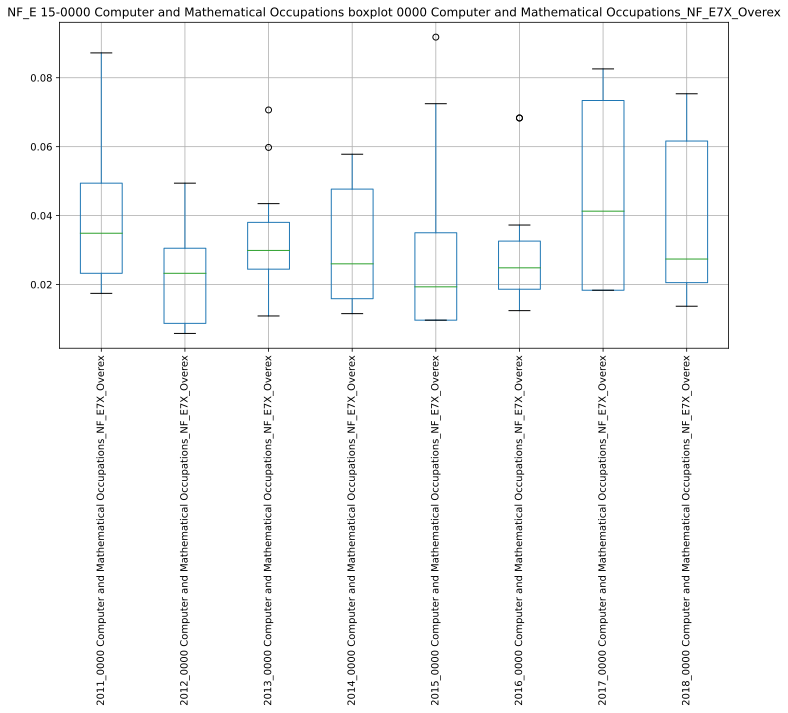

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040013.626202:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040013.665821:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040013.906694:INFO:headless_shell.cc(660)] Written to file /tmp/tmptwj6wmu5/temp.png.
[1014/040014.126098:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040014.162973:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040014.463164:INFO:headless_shell.cc(660)] Written to file /tmp/tmpeustztf6/temp.png.
[1014/040014.742233:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040014.779376:WARNI

,2011_0000 Computer and Mathematical Occupations_NF_E7X_Overex,2012_0000 Computer and Mathematical Occupations_NF_E7X_Overex,2013_0000 Computer and Mathematical Occupations_NF_E7X_Overex,2014_0000 Computer and Mathematical Occupations_NF_E7X_Overex,2015_0000 Computer and Mathematical Occupations_NF_E7X_Overex,2016_0000 Computer and Mathematical Occupations_NF_E7X_Overex,2017_0000 Computer and Mathematical Occupations_NF_E7X_Overex,2018_0000 Computer and Mathematical Occupations_NF_E7X_Overex
2011_0000 Computer and Mathematical Occupations_NF_E7X_Overex,1.000000,0.263448,0.418703,0.343943,-0.488624,-0.368421,-0.523581,0.076717
2012_0000 Computer and Mathematical Occupations_NF_E7X_Overex,0.263448,1.000000,0.806356,-0.350908,0.054963,-0.107096,-0.108468,0.110376
2013_0000 Computer and Mathematical Occupations_NF_E7X_Overex,0.418703,0.806356,1.000000,-0.392076,0.000420,0.379980,0.088152,0.033071
2014_0000 Computer and Mathematical Occupations_NF_E7X_Overex,0.343943,-0.350908,-0.392076,1.000000,0.113830,-0.010300,0.018894,-0.034444
2015_0000 Computer and Mathematical Occupations_NF_E7X_Overex,-0.488624,0.054963,0.000420,0.113830,1.000000,0.564009,0.792417,0.431588
2016_0000 Computer and Mathematical Occupations_NF_E7X_Overex,-0.368421,-0.107096,0.379980,-0.010300,0.564009,1.000000,0.233944,0.426885
2017_0000 Computer and Mathematical Occupations_NF_E7X_Overex,-0.523581,-0.108468,0.088152,0.018894,0.792417,0.233944,1.000000,-0.235511
2018_0000 Computer and Mathematical Occupations_NF_E7X_Overex,0.076717,0.110376,0.033071,-0.034444,0.431588,0.426885,-0.235511,1.000000


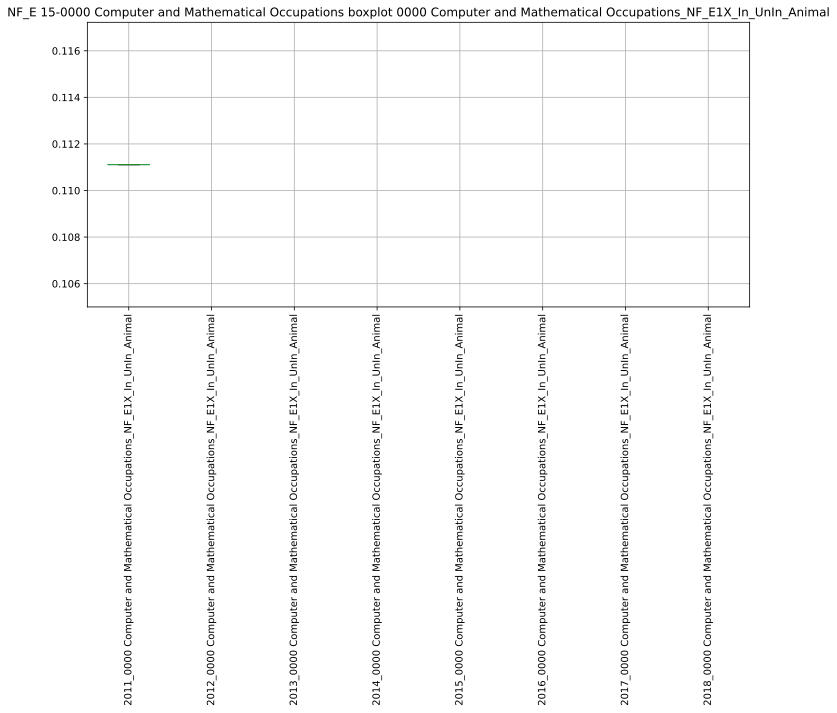

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040017.464326:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040017.505060:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040017.728374:INFO:headless_shell.cc(660)] Written to file /tmp/tmp_a2lzkry/temp.png.
[1014/040017.950859:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040017.991641:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040018.287184:INFO:headless_shell.cc(660)] Written to file /tmp/tmpm_qvoya6/temp.png.
[1014/040018.550211:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040018.593116:WARNI

,2011_0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,2012_0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,2013_0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,2014_0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,2015_0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,2016_0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,2017_0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,2018_0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal
2011_0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan


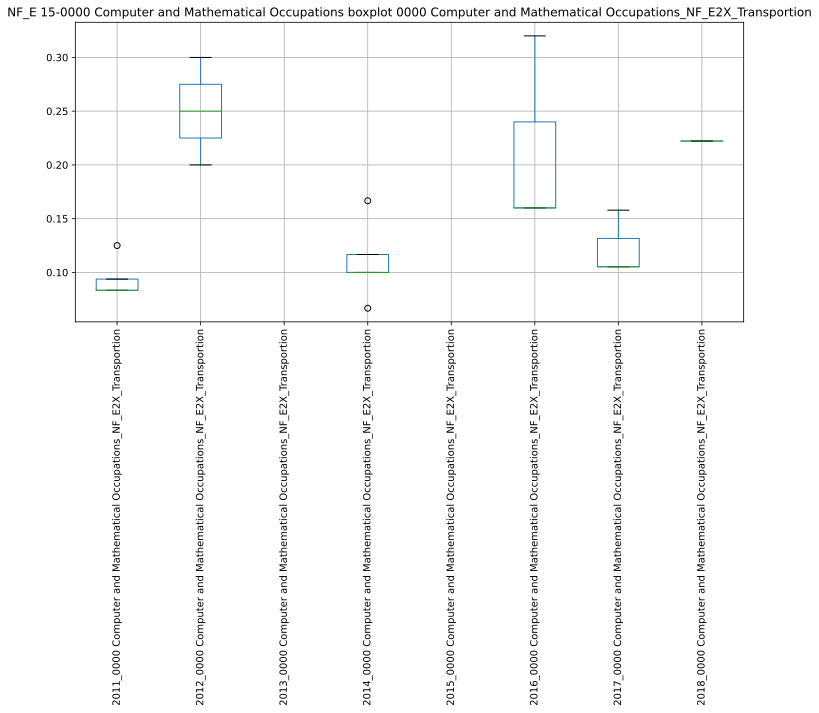

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040022.566019:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040022.607416:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040022.835950:INFO:headless_shell.cc(660)] Written to file /tmp/tmpyvgmc7hf/temp.png.
[1014/040023.054213:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040023.091151:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040023.367916:INFO:headless_shell.cc(660)] Written to file /tmp/tmpzchj10zo/temp.png.
[1014/040023.657051:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040023.684944:WARNI

,2011_0000 Computer and Mathematical Occupations_NF_E2X_Transportion,2012_0000 Computer and Mathematical Occupations_NF_E2X_Transportion,2013_0000 Computer and Mathematical Occupations_NF_E2X_Transportion,2014_0000 Computer and Mathematical Occupations_NF_E2X_Transportion,2015_0000 Computer and Mathematical Occupations_NF_E2X_Transportion,2016_0000 Computer and Mathematical Occupations_NF_E2X_Transportion,2017_0000 Computer and Mathematical Occupations_NF_E2X_Transportion,2018_0000 Computer and Mathematical Occupations_NF_E2X_Transportion
2011_0000 Computer and Mathematical Occupations_NF_E2X_Transportion,1.000000,nan,nan,-0.500000,nan,nan,nan,nan
2012_0000 Computer and Mathematical Occupations_NF_E2X_Transportion,nan,1.000000,nan,nan,nan,-1.000000,1.000000,nan
2013_0000 Computer and Mathematical Occupations_NF_E2X_Transportion,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Computer and Mathematical Occupations_NF_E2X_Transportion,-0.500000,nan,nan,1.000000,nan,nan,nan,nan
2015_0000 Computer and Mathematical Occupations_NF_E2X_Transportion,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Computer and Mathematical Occupations_NF_E2X_Transportion,nan,-1.000000,nan,nan,nan,1.000000,-1.000000,nan
2017_0000 Computer and Mathematical Occupations_NF_E2X_Transportion,nan,1.000000,nan,nan,nan,-1.000000,1.000000,nan
2018_0000 Computer and Mathematical Occupations_NF_E2X_Transportion,nan,nan,nan,nan,nan,nan,nan,nan


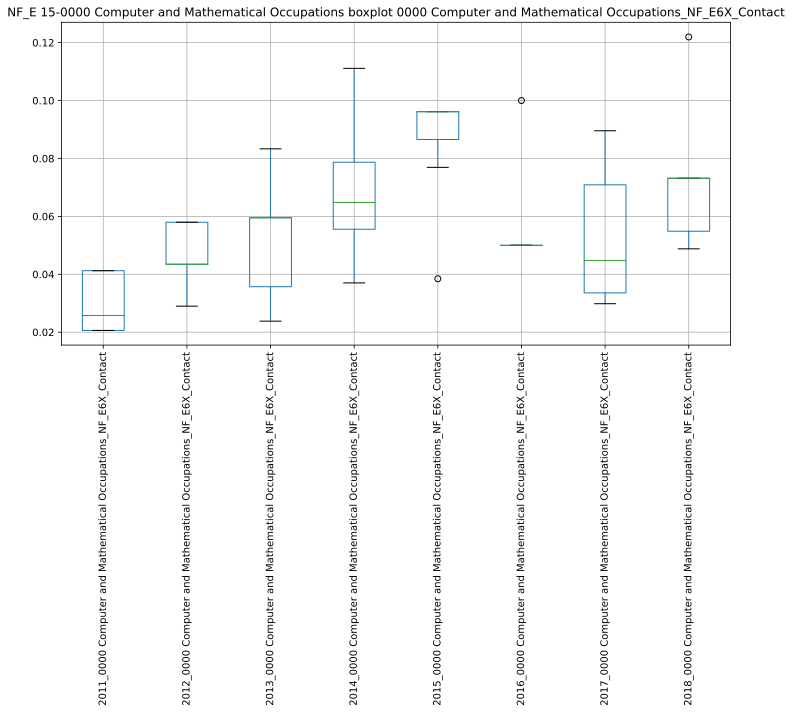

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040026.400029:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040026.437662:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040026.666744:INFO:headless_shell.cc(660)] Written to file /tmp/tmpa9hc25fr/temp.png.
[1014/040026.885952:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040026.923664:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040027.240737:INFO:headless_shell.cc(660)] Written to file /tmp/tmpqdvid9_u/temp.png.
[1014/040027.510637:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040027.548662:WARNI

,2011_0000 Computer and Mathematical Occupations_NF_E6X_Contact,2012_0000 Computer and Mathematical Occupations_NF_E6X_Contact,2013_0000 Computer and Mathematical Occupations_NF_E6X_Contact,2014_0000 Computer and Mathematical Occupations_NF_E6X_Contact,2015_0000 Computer and Mathematical Occupations_NF_E6X_Contact,2016_0000 Computer and Mathematical Occupations_NF_E6X_Contact,2017_0000 Computer and Mathematical Occupations_NF_E6X_Contact,2018_0000 Computer and Mathematical Occupations_NF_E6X_Contact
2011_0000 Computer and Mathematical Occupations_NF_E6X_Contact,1.000000,0.315264,0.132954,0.309277,0.223957,-0.331133,-0.164845,-0.522233
2012_0000 Computer and Mathematical Occupations_NF_E6X_Contact,0.315264,1.000000,0.730297,-0.085749,-0.342997,-0.200000,0.238302,-0.322749
2013_0000 Computer and Mathematical Occupations_NF_E6X_Contact,0.132954,0.730297,1.000000,0.690849,0.100504,-0.254588,0.050572,0.099504
2014_0000 Computer and Mathematical Occupations_NF_E6X_Contact,0.309277,-0.085749,0.690849,1.000000,0.261116,-0.198030,-0.404820,-0.174078
2015_0000 Computer and Mathematical Occupations_NF_E6X_Contact,0.223957,-0.342997,0.100504,0.261116,1.000000,-1.000000,0.440225,0.102062
2016_0000 Computer and Mathematical Occupations_NF_E6X_Contact,-0.331133,-0.200000,-0.254588,-0.198030,-1.000000,1.000000,nan,nan
2017_0000 Computer and Mathematical Occupations_NF_E6X_Contact,-0.164845,0.238302,0.050572,-0.404820,0.440225,nan,1.000000,0.922331
2018_0000 Computer and Mathematical Occupations_NF_E6X_Contact,-0.522233,-0.322749,0.099504,-0.174078,0.102062,nan,0.922331,1.000000


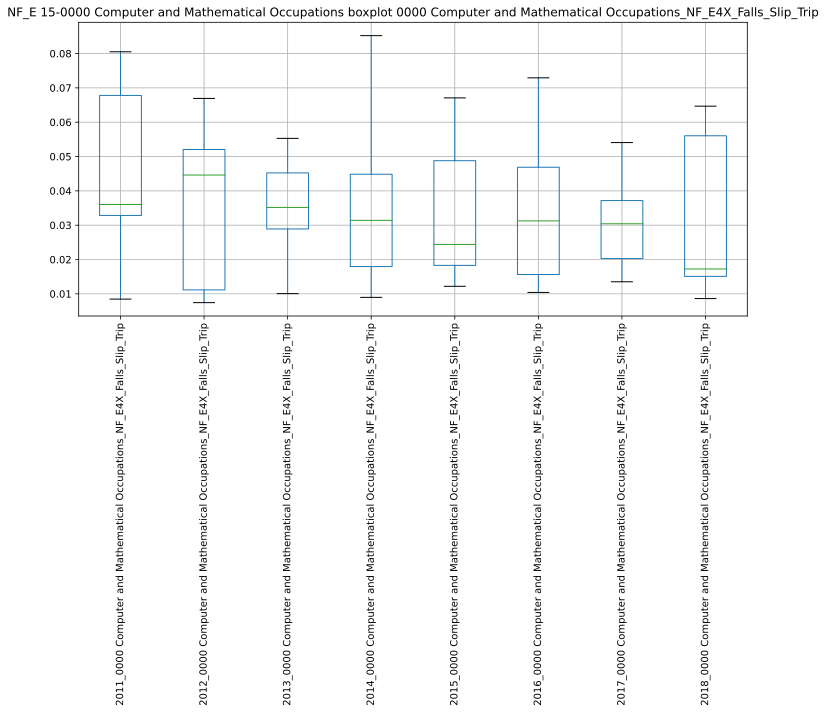

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040030.296026:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040030.333640:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040030.569233:INFO:headless_shell.cc(660)] Written to file /tmp/tmpi5ajjgzi/temp.png.
[1014/040030.788333:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040030.828845:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040031.143450:INFO:headless_shell.cc(660)] Written to file /tmp/tmpw594iofb/temp.png.
[1014/040031.414621:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040031.451458:WARNI

,2011_0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,2012_0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,2013_0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,2014_0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,2015_0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,2016_0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,2017_0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,2018_0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip
2011_0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,1.000000,0.364428,0.712056,0.672706,0.281225,0.584382,0.185054,0.256241
2012_0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,0.364428,1.000000,-0.029893,-0.013307,-0.046990,0.040380,0.285373,0.608852
2013_0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,0.712056,-0.029893,1.000000,0.413148,0.658535,0.496650,-0.372298,0.370550
2014_0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,0.672706,-0.013307,0.413148,1.000000,0.629137,0.743540,-0.320951,0.360416
2015_0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,0.281225,-0.046990,0.658535,0.629137,1.000000,0.526372,-0.711241,0.236917
2016_0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,0.584382,0.040380,0.496650,0.743540,0.526372,1.000000,-0.109238,0.396917
2017_0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,0.185054,0.285373,-0.372298,-0.320951,-0.711241,-0.109238,1.000000,-0.288195
2018_0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,0.256241,0.608852,0.370550,0.360416,0.236917,0.396917,-0.288195,1.000000


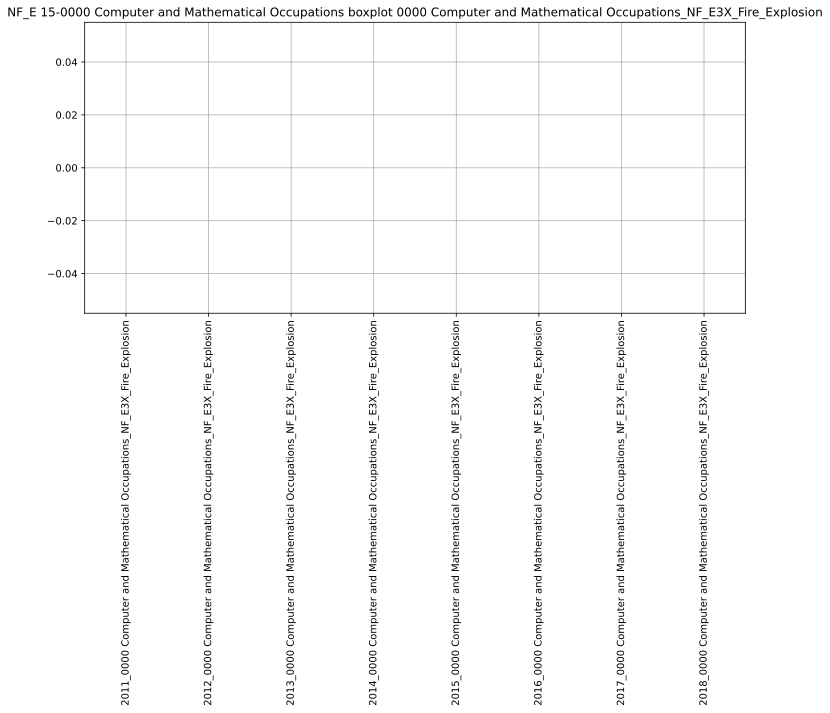

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040035.474702:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040035.512495:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040035.733517:INFO:headless_shell.cc(660)] Written to file /tmp/tmpd53yq7xe/temp.png.
[1014/040035.945072:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040035.984681:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040036.256320:INFO:headless_shell.cc(660)] Written to file /tmp/tmpr2956_lf/temp.png.
[1014/040036.516484:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040036.556915:WARNI

,2011_0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,2012_0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,2013_0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,2014_0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,2015_0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,2016_0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,2017_0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,2018_0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion
2011_0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan


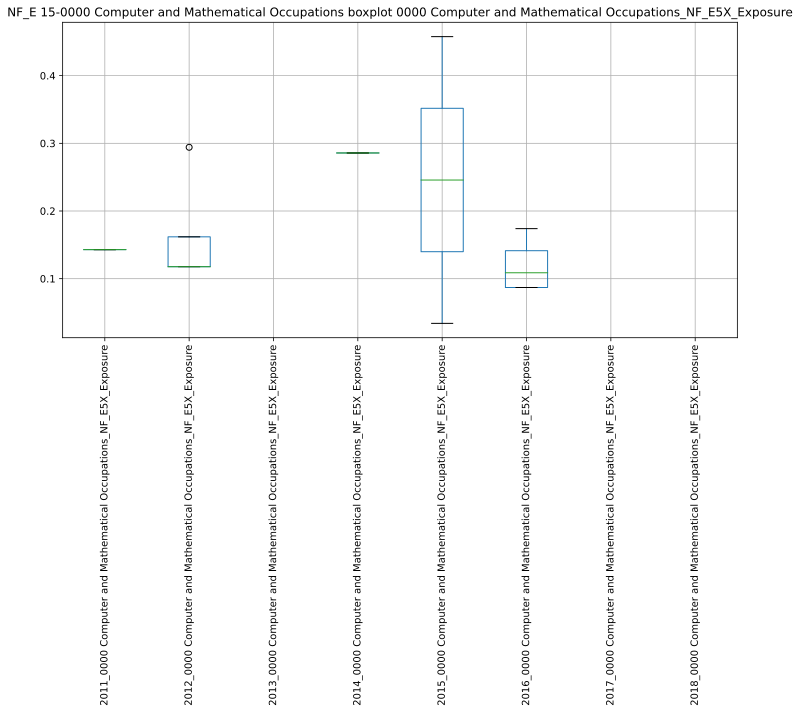

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040040.453366:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040040.491960:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040040.692121:INFO:headless_shell.cc(660)] Written to file /tmp/tmpnza6xx4d/temp.png.
[1014/040040.903554:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040040.941921:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040041.222077:INFO:headless_shell.cc(660)] Written to file /tmp/tmp_fx1128g/temp.png.
[1014/040041.503187:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040041.531807:WARNI

,2011_0000 Computer and Mathematical Occupations_NF_E5X_Exposure,2012_0000 Computer and Mathematical Occupations_NF_E5X_Exposure,2013_0000 Computer and Mathematical Occupations_NF_E5X_Exposure,2014_0000 Computer and Mathematical Occupations_NF_E5X_Exposure,2015_0000 Computer and Mathematical Occupations_NF_E5X_Exposure,2016_0000 Computer and Mathematical Occupations_NF_E5X_Exposure,2017_0000 Computer and Mathematical Occupations_NF_E5X_Exposure,2018_0000 Computer and Mathematical Occupations_NF_E5X_Exposure
2011_0000 Computer and Mathematical Occupations_NF_E5X_Exposure,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Computer and Mathematical Occupations_NF_E5X_Exposure,nan,1.000000,nan,nan,-1.000000,nan,nan,nan
2013_0000 Computer and Mathematical Occupations_NF_E5X_Exposure,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Computer and Mathematical Occupations_NF_E5X_Exposure,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Computer and Mathematical Occupations_NF_E5X_Exposure,nan,-1.000000,nan,nan,1.000000,nan,nan,nan
2016_0000 Computer and Mathematical Occupations_NF_E5X_Exposure,nan,nan,nan,nan,nan,1.000000,nan,nan
2017_0000 Computer and Mathematical Occupations_NF_E5X_Exposure,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Computer and Mathematical Occupations_NF_E5X_Exposure,nan,nan,nan,nan,nan,nan,nan,nan


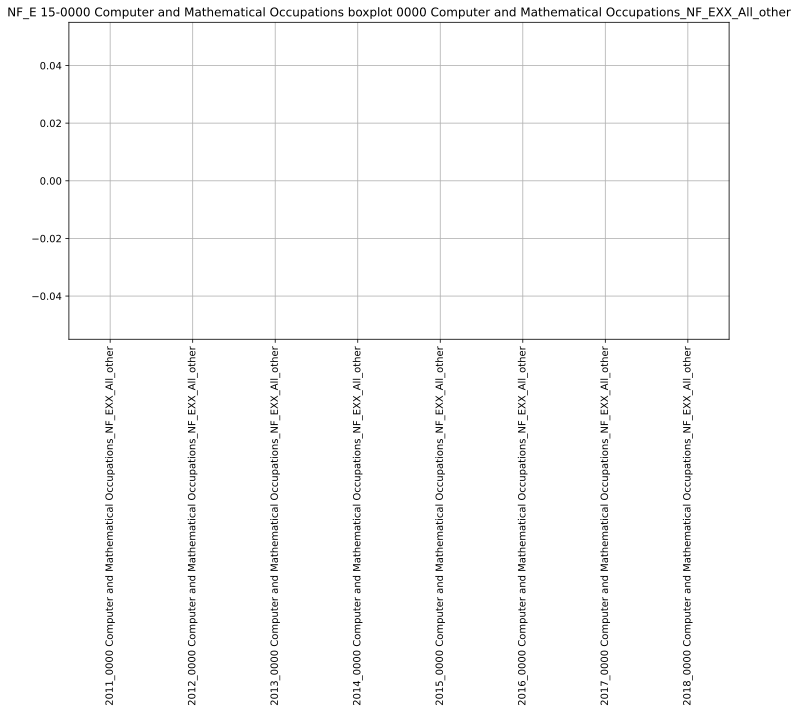

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040044.186574:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040044.223703:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040044.481245:INFO:headless_shell.cc(660)] Written to file /tmp/tmpcn4mruhy/temp.png.
[1014/040044.698718:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040044.737779:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040045.036385:INFO:headless_shell.cc(660)] Written to file /tmp/tmpu7e6nv3p/temp.png.
[1014/040045.302632:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040045.341085:WARNI

,2011_0000 Computer and Mathematical Occupations_NF_EXX_All_other,2012_0000 Computer and Mathematical Occupations_NF_EXX_All_other,2013_0000 Computer and Mathematical Occupations_NF_EXX_All_other,2014_0000 Computer and Mathematical Occupations_NF_EXX_All_other,2015_0000 Computer and Mathematical Occupations_NF_EXX_All_other,2016_0000 Computer and Mathematical Occupations_NF_EXX_All_other,2017_0000 Computer and Mathematical Occupations_NF_EXX_All_other,2018_0000 Computer and Mathematical Occupations_NF_EXX_All_other
2011_0000 Computer and Mathematical Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Computer and Mathematical Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Computer and Mathematical Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Computer and Mathematical Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Computer and Mathematical Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Computer and Mathematical Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Computer and Mathematical Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Computer and Mathematical Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['15-0000 Computer and Mathematical Occupations_NF_E7X_Overex', '15-0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal', '15-0000 Computer and Mathematical Occupations_NF_E2X_Transportion', '15-0000 Computer and Mathematical Occupations_NF_E6X_Contact', '15-0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip', '15-0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion', '15-0000 Computer and Mathematical Occupations_NF_E5X_Exposure', '15-0000 Computer and Mathematical Occupations_NF_EXX_All_other']


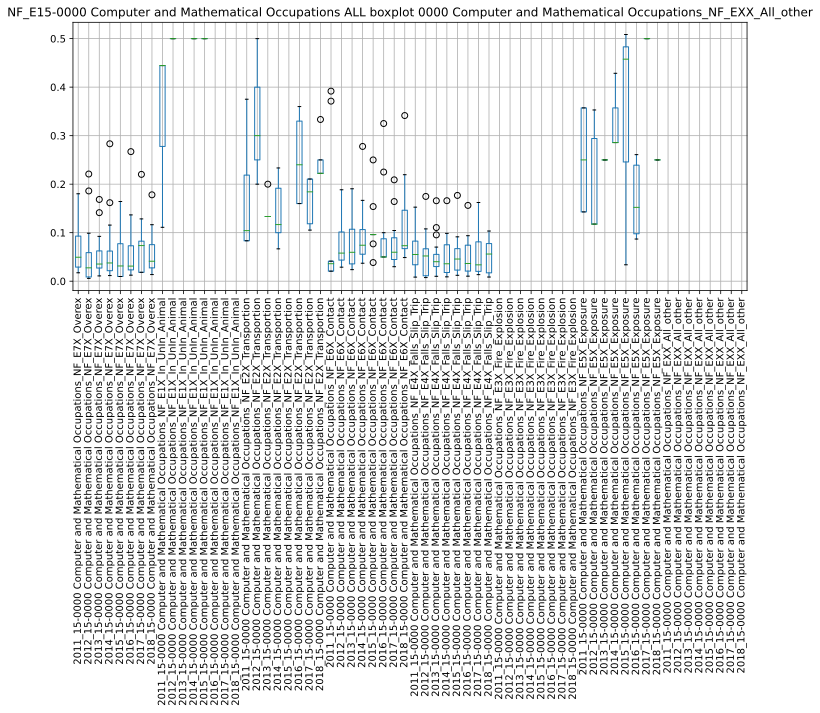

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040054.366593:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040054.404901:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040054.887056:INFO:headless_shell.cc(660)] Written to file /tmp/tmpedw1s6ij/temp.png.
[1014/040055.109639:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040055.147335:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040055.784675:INFO:headless_shell.cc(660)] Written to file /tmp/tmp7w6ml6fi/temp.png.
[1014/040056.108385:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040056.145317:WARNI

,2011_15-0000 Computer and Mathematical Occupations_NF_E7X_Overex,2012_15-0000 Computer and Mathematical Occupations_NF_E7X_Overex,2013_15-0000 Computer and Mathematical Occupations_NF_E7X_Overex,2014_15-0000 Computer and Mathematical Occupations_NF_E7X_Overex,2015_15-0000 Computer and Mathematical Occupations_NF_E7X_Overex,2016_15-0000 Computer and Mathematical Occupations_NF_E7X_Overex,2017_15-0000 Computer and Mathematical Occupations_NF_E7X_Overex,2018_15-0000 Computer and Mathematical Occupations_NF_E7X_Overex,2011_15-0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,2012_15-0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,2013_15-0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,2014_15-0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,2015_15-0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,2016_15-0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,2017_15-0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,2018_15-0000 Computer and Mathematical Occupations_NF_E1X_In_UnIn_Animal,2011_15-0000 Computer and Mathematical Occupations_NF_E2X_Transportion,2012_15-0000 Computer and Mathematical Occupations_NF_E2X_Transportion,2013_15-0000 Computer and Mathematical Occupations_NF_E2X_Transportion,2014_15-0000 Computer and Mathematical Occupations_NF_E2X_Transportion,2015_15-0000 Computer and Mathematical Occupations_NF_E2X_Transportion,2016_15-0000 Computer and Mathematical Occupations_NF_E2X_Transportion,2017_15-0000 Computer and Mathematical Occupations_NF_E2X_Transportion,2018_15-0000 Computer and Mathematical Occupations_NF_E2X_Transportion,2011_15-0000 Computer and Mathematical Occupations_NF_E6X_Contact,2012_15-0000 Computer and Mathematical Occupations_NF_E6X_Contact,2013_15-0000 Computer and Mathematical Occupations_NF_E6X_Contact,2014_15-0000 Computer and Mathematical Occupations_NF_E6X_Contact,2015_15-0000 Computer and Mathematical Occupations_NF_E6X_Contact,2016_15-0000 Computer and Mathematical Occupations_NF_E6X_Contact,2017_15-0000 Computer and Mathematical Occupations_NF_E6X_Contact,2018_15-0000 Computer and Mathematical Occupations_NF_E6X_Contact,2011_15-0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,2012_15-0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,2013_15-0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,2014_15-0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,2015_15-0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,2016_15-0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,2017_15-0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,2018_15-0000 Computer and Mathematical Occupations_NF_E4X_Falls_Slip_Trip,2011_15-0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,2012_15-0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,2013_15-0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,2014_15-0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,2015_15-0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,2016_15-0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,2017_15-0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,2018_15-0000 Computer and Mathematical Occupations_NF_E3X_Fire_Explosion,2011_15-0000 Computer and Mathematical Occupations_NF_E5X_Exposure,2012_15-0000 Computer and Mathematical Occupations_NF_E5X_Exposure,2013_15-0000 Computer and Mathematical Occupations_NF_E5X_Exposure,2014_15-0000 Computer and Mathematical Occupations_NF_E5X_Exposure,2015_15-0000 Computer and Mathematical Occupations_NF_E5X_Exposure,2016_15-0000 Computer and Mathematical Occupations_NF_E5X_Exposure,2017_15-0000 Computer and Mathematical Occupations_NF_E5X_Exposure,2018_15-0000 Computer and Mathematical Occupations_NF_E5X_Exposure,2011_15-0000 Computer and Mathematical Occupations_NF_EXX_All_other,2012_15-0000 Comput

########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
NF_E7X_Overex_all.csv
NF_E1X_In_UnIn_Animal_all.csv
NF_E2X_Transportion_all.csv
NF_E6X_Contact_all.csv
NF_E4X_Falls_Slip_Trip_all.csv
NF_E3X_Fire_Explosion_all.csv
NF_E5X_Exposure_all.csv
NF_EXX_All_other_all.csv
dict_keys(['NF_E7X_Overex', 'NF_E1X_In_UnIn_Animal', 'NF_E2X_Transportion', 'NF_E6X_Contact', 'NF_E4X_Falls_Slip_Trip', 'NF_E3X_Fire_Explosion', 'NF_E5X_Exposure', 'NF_EXX_All_other'])
############ OCCUPATION ############
17-0000 Architecture and Engineering Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
17-0000 Architecture and Engineering Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ########

/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
NF_E7X_Overex_all.csv
NF_E1X_In_UnIn_Animal_all.csv
NF_E2X_Transportion_all.csv
NF_E6X_Contact_all.csv
NF_E4X_Falls_Slip_Trip_all.csv
NF_E3X_Fire_Explosion_all.csv
NF_E5X_Exposure_all.csv
NF_EXX_All_other_all.csv
dict_keys(['NF_E7X_Overex', 'NF_E1X_In_UnIn_Animal', 'NF_E2X_Transportion', 'NF_E6X_Contact', 'NF_E4X_Falls_Slip_Trip', 'NF_E3X_Fire_Explosion', 'NF_E5X_Exposure', 'NF_EXX_All_other'])
############ OCCUPATION ############
17-0000 Architecture and Engineering Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
17-0000 Architecture and Engineering Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
17-0000 Architecture and Engineering Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATIO

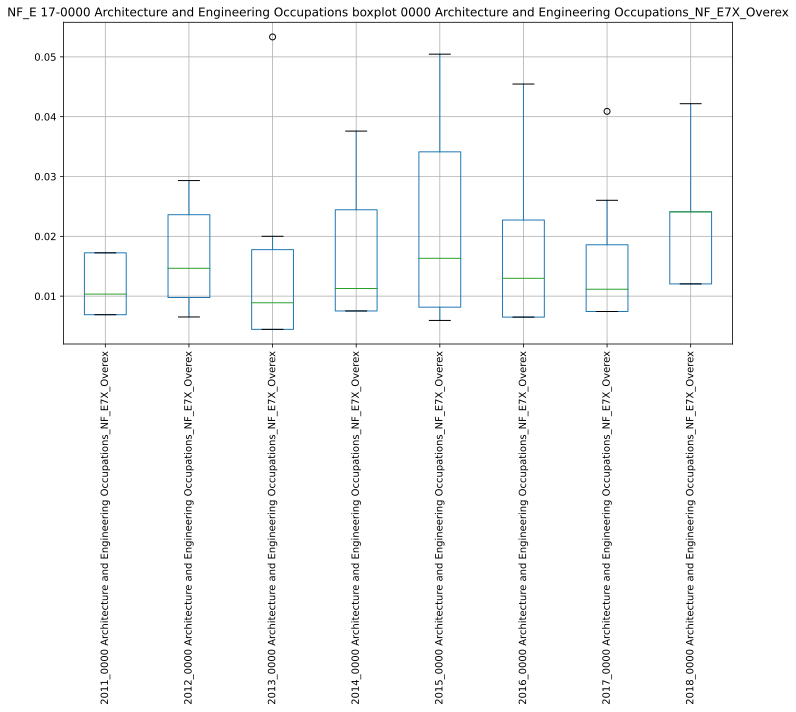

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040221.438229:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040221.475992:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040221.685484:INFO:headless_shell.cc(660)] Written to file /tmp/tmpqk3r18d4/temp.png.
[1014/040221.901521:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040221.939603:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040222.241768:INFO:headless_shell.cc(660)] Written to file /tmp/tmpnffwmynp/temp.png.
[1014/040222.520375:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040222.558839:WARNI

,2011_0000 Architecture and Engineering Occupations_NF_E7X_Overex,2012_0000 Architecture and Engineering Occupations_NF_E7X_Overex,2013_0000 Architecture and Engineering Occupations_NF_E7X_Overex,2014_0000 Architecture and Engineering Occupations_NF_E7X_Overex,2015_0000 Architecture and Engineering Occupations_NF_E7X_Overex,2016_0000 Architecture and Engineering Occupations_NF_E7X_Overex,2017_0000 Architecture and Engineering Occupations_NF_E7X_Overex,2018_0000 Architecture and Engineering Occupations_NF_E7X_Overex
2011_0000 Architecture and Engineering Occupations_NF_E7X_Overex,1.000000,0.238411,-0.247707,0.157007,0.699691,0.211598,-0.114125,-0.246667
2012_0000 Architecture and Engineering Occupations_NF_E7X_Overex,0.238411,1.000000,-0.522828,0.298329,-0.006906,0.434675,-0.205045,-0.442358
2013_0000 Architecture and Engineering Occupations_NF_E7X_Overex,-0.247707,-0.522828,1.000000,-0.540868,0.133009,0.028703,0.251535,0.312672
2014_0000 Architecture and Engineering Occupations_NF_E7X_Overex,0.157007,0.298329,-0.540868,1.000000,0.452698,0.368395,0.020950,-0.004313
2015_0000 Architecture and Engineering Occupations_NF_E7X_Overex,0.699691,-0.006906,0.133009,0.452698,1.000000,0.181375,0.128281,0.495408
2016_0000 Architecture and Engineering Occupations_NF_E7X_Overex,0.211598,0.434675,0.028703,0.368395,0.181375,1.000000,0.468428,-0.118696
2017_0000 Architecture and Engineering Occupations_NF_E7X_Overex,-0.114125,-0.205045,0.251535,0.020950,0.128281,0.468428,1.000000,0.647150
2018_0000 Architecture and Engineering Occupations_NF_E7X_Overex,-0.246667,-0.442358,0.312672,-0.004313,0.495408,-0.118696,0.647150,1.000000


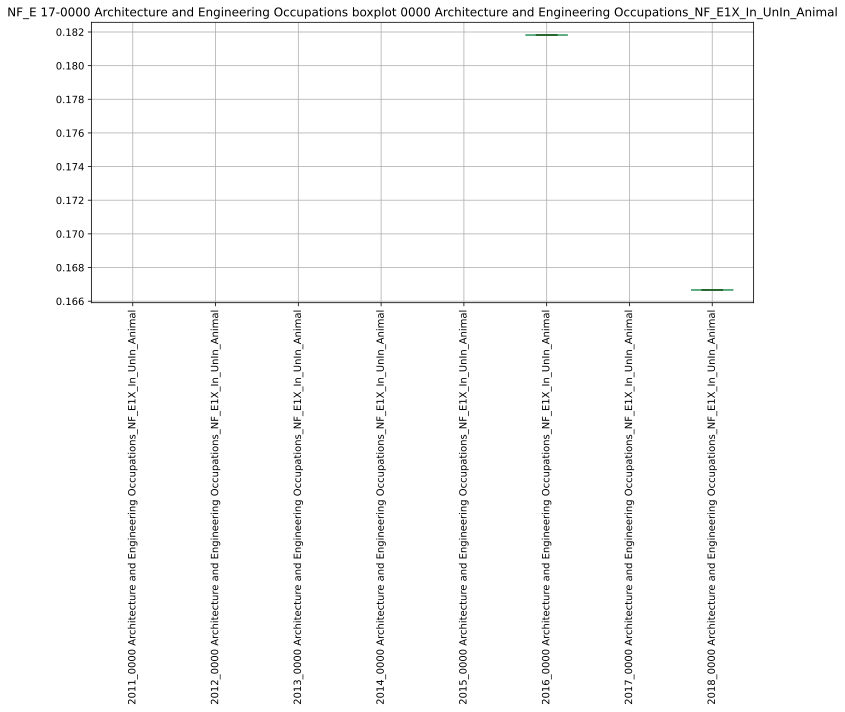

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040225.315266:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040225.356862:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040225.594090:INFO:headless_shell.cc(660)] Written to file /tmp/tmpoda8bcqk/temp.png.
[1014/040225.819655:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040225.857109:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040226.148315:INFO:headless_shell.cc(660)] Written to file /tmp/tmpcd1wcsjq/temp.png.
[1014/040226.414179:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040226.451572:WARNI

,2011_0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,2012_0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,2013_0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,2014_0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,2015_0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,2016_0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,2017_0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,2018_0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal
2011_0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan


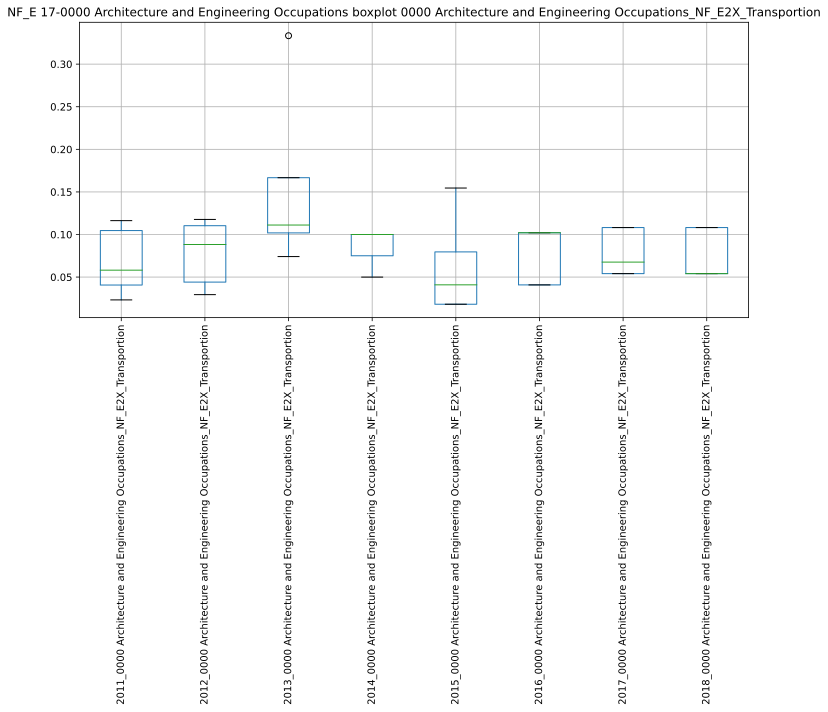

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040230.499472:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040230.536816:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040230.775204:INFO:headless_shell.cc(660)] Written to file /tmp/tmpteald72_/temp.png.
[1014/040231.002914:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040231.041613:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040231.336401:INFO:headless_shell.cc(660)] Written to file /tmp/tmpt_h5lq2o/temp.png.
[1014/040231.602297:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040231.639816:WARNI

,2011_0000 Architecture and Engineering Occupations_NF_E2X_Transportion,2012_0000 Architecture and Engineering Occupations_NF_E2X_Transportion,2013_0000 Architecture and Engineering Occupations_NF_E2X_Transportion,2014_0000 Architecture and Engineering Occupations_NF_E2X_Transportion,2015_0000 Architecture and Engineering Occupations_NF_E2X_Transportion,2016_0000 Architecture and Engineering Occupations_NF_E2X_Transportion,2017_0000 Architecture and Engineering Occupations_NF_E2X_Transportion,2018_0000 Architecture and Engineering Occupations_NF_E2X_Transportion
2011_0000 Architecture and Engineering Occupations_NF_E2X_Transportion,1.000000,0.517088,0.609994,0.495519,0.764881,-0.647298,0.567698,1.000000
2012_0000 Architecture and Engineering Occupations_NF_E2X_Transportion,0.517088,1.000000,0.188982,nan,0.006637,-0.650945,-0.457604,-0.816497
2013_0000 Architecture and Engineering Occupations_NF_E2X_Transportion,0.609994,0.188982,1.000000,1.000000,0.609994,nan,0.260290,0.500000
2014_0000 Architecture and Engineering Occupations_NF_E2X_Transportion,0.495519,nan,1.000000,1.000000,0.490505,-0.333333,-0.090909,1.000000
2015_0000 Architecture and Engineering Occupations_NF_E2X_Transportion,0.764881,0.006637,0.609994,0.490505,1.000000,0.089087,0.635681,1.000000
2016_0000 Architecture and Engineering Occupations_NF_E2X_Transportion,-0.647298,-0.650945,nan,-0.333333,0.089087,1.000000,nan,nan
2017_0000 Architecture and Engineering Occupations_NF_E2X_Transportion,0.567698,-0.457604,0.260290,-0.090909,0.635681,nan,1.000000,0.912871
2018_0000 Architecture and Engineering Occupations_NF_E2X_Transportion,1.000000,-0.816497,0.500000,1.000000,1.000000,nan,0.912871,1.000000


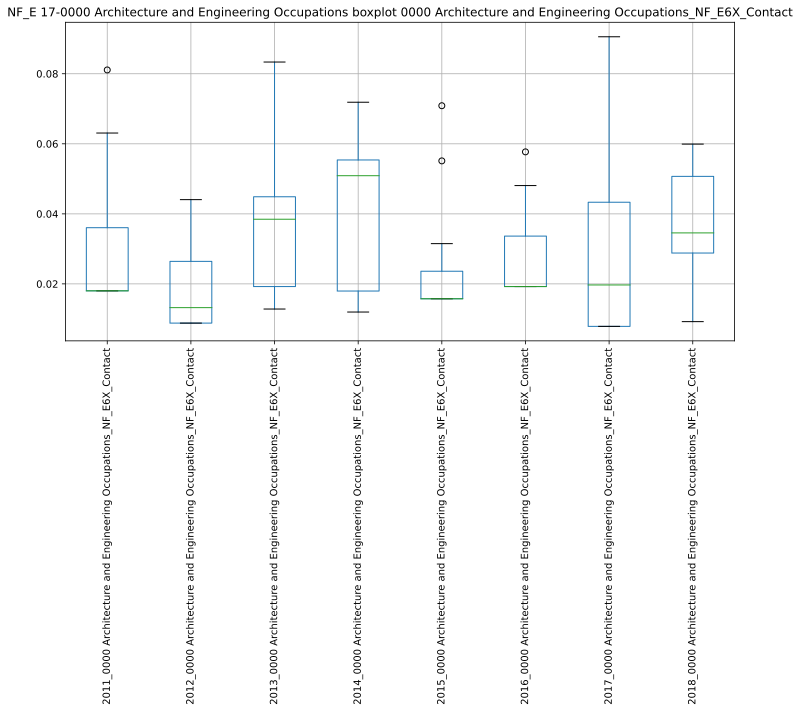

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040235.619451:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040235.660140:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040235.872992:INFO:headless_shell.cc(660)] Written to file /tmp/tmpvbnceh2m/temp.png.
[1014/040236.099554:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040236.136548:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040236.419830:INFO:headless_shell.cc(660)] Written to file /tmp/tmp35_4d4gs/temp.png.
[1014/040236.690554:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040236.729875:WARNI

,2011_0000 Architecture and Engineering Occupations_NF_E6X_Contact,2012_0000 Architecture and Engineering Occupations_NF_E6X_Contact,2013_0000 Architecture and Engineering Occupations_NF_E6X_Contact,2014_0000 Architecture and Engineering Occupations_NF_E6X_Contact,2015_0000 Architecture and Engineering Occupations_NF_E6X_Contact,2016_0000 Architecture and Engineering Occupations_NF_E6X_Contact,2017_0000 Architecture and Engineering Occupations_NF_E6X_Contact,2018_0000 Architecture and Engineering Occupations_NF_E6X_Contact
2011_0000 Architecture and Engineering Occupations_NF_E6X_Contact,1.000000,-0.519776,-0.210042,-0.450768,0.359211,-0.052591,0.746751,0.448449
2012_0000 Architecture and Engineering Occupations_NF_E6X_Contact,-0.519776,1.000000,-0.194063,0.576243,-0.251952,-0.626040,-0.277698,-0.496162
2013_0000 Architecture and Engineering Occupations_NF_E6X_Contact,-0.210042,-0.194063,1.000000,-0.330971,0.279508,0.670559,0.183675,0.660351
2014_0000 Architecture and Engineering Occupations_NF_E6X_Contact,-0.450768,0.576243,-0.330971,1.000000,-0.307915,-0.655371,-0.215956,-0.127828
2015_0000 Architecture and Engineering Occupations_NF_E6X_Contact,0.359211,-0.251952,0.279508,-0.307915,1.000000,-0.056254,0.108514,0.104162
2016_0000 Architecture and Engineering Occupations_NF_E6X_Contact,-0.052591,-0.626040,0.670559,-0.655371,-0.056254,1.000000,0.816594,0.071182
2017_0000 Architecture and Engineering Occupations_NF_E6X_Contact,0.746751,-0.277698,0.183675,-0.215956,0.108514,0.816594,1.000000,-0.597200
2018_0000 Architecture and Engineering Occupations_NF_E6X_Contact,0.448449,-0.496162,0.660351,-0.127828,0.104162,0.071182,-0.597200,1.000000


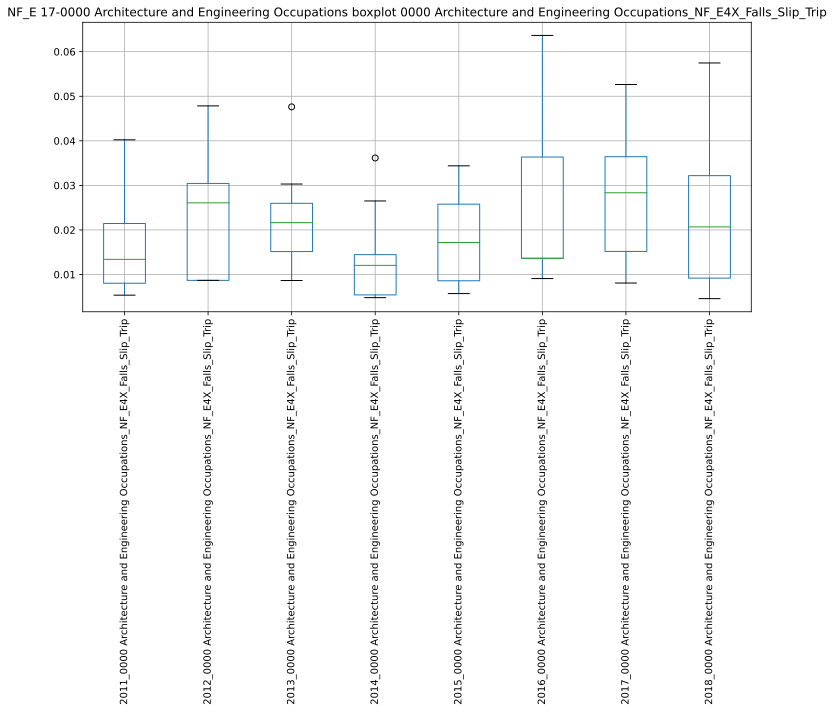

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040239.452220:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040239.490514:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040239.727960:INFO:headless_shell.cc(660)] Written to file /tmp/tmpng42gujd/temp.png.
[1014/040239.957887:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040239.999697:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040240.286026:INFO:headless_shell.cc(660)] Written to file /tmp/tmpyp44nby7/temp.png.
[1014/040240.546437:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040240.586007:WARNI

,2011_0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,2012_0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,2013_0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,2014_0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,2015_0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,2016_0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,2017_0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,2018_0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip
2011_0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,1.000000,0.565104,-0.174222,-0.021473,-0.042834,-0.534595,-0.251843,-0.039564
2012_0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,0.565104,1.000000,-0.264521,0.152099,-0.011843,-0.032251,-0.339507,0.121676
2013_0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,-0.174222,-0.264521,1.000000,-0.226505,-0.057293,-0.399249,0.467533,0.273673
2014_0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,-0.021473,0.152099,-0.226505,1.000000,0.093258,-0.009024,-0.043336,0.072288
2015_0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,-0.042834,-0.011843,-0.057293,0.093258,1.000000,0.185431,0.287785,-0.048962
2016_0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,-0.534595,-0.032251,-0.399249,-0.009024,0.185431,1.000000,0.192470,0.175358
2017_0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,-0.251843,-0.339507,0.467533,-0.043336,0.287785,0.192470,1.000000,0.166268
2018_0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,-0.039564,0.121676,0.273673,0.072288,-0.048962,0.175358,0.166268,1.000000


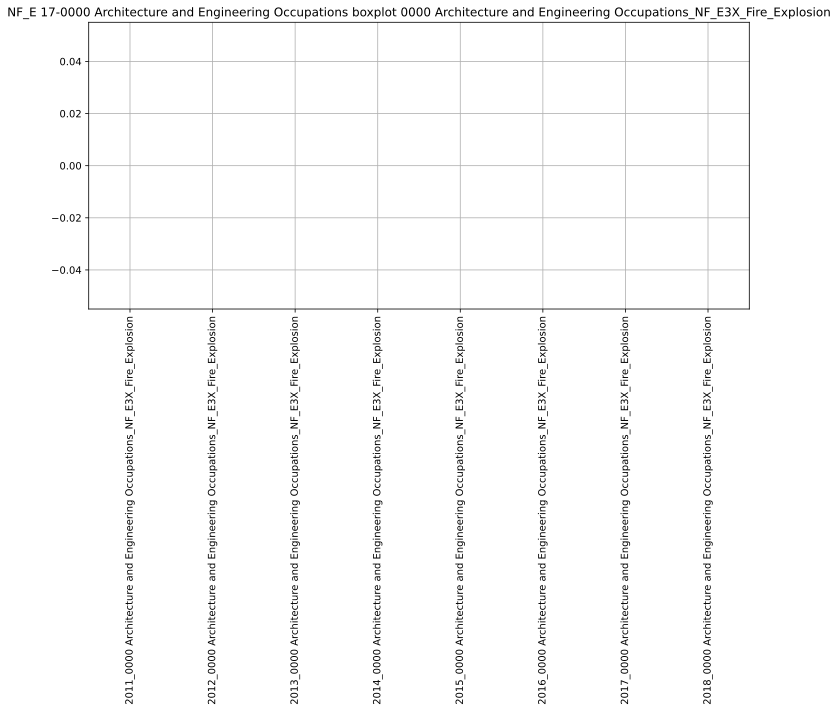

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040244.732460:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040244.773061:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040244.994468:INFO:headless_shell.cc(660)] Written to file /tmp/tmpcac56end/temp.png.
[1014/040245.214839:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040245.250245:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040245.524223:INFO:headless_shell.cc(660)] Written to file /tmp/tmpryai41lu/temp.png.
[1014/040245.792011:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040245.832892:WARNI

,2011_0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,2012_0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,2013_0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,2014_0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,2015_0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,2016_0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,2017_0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,2018_0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion
2011_0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan


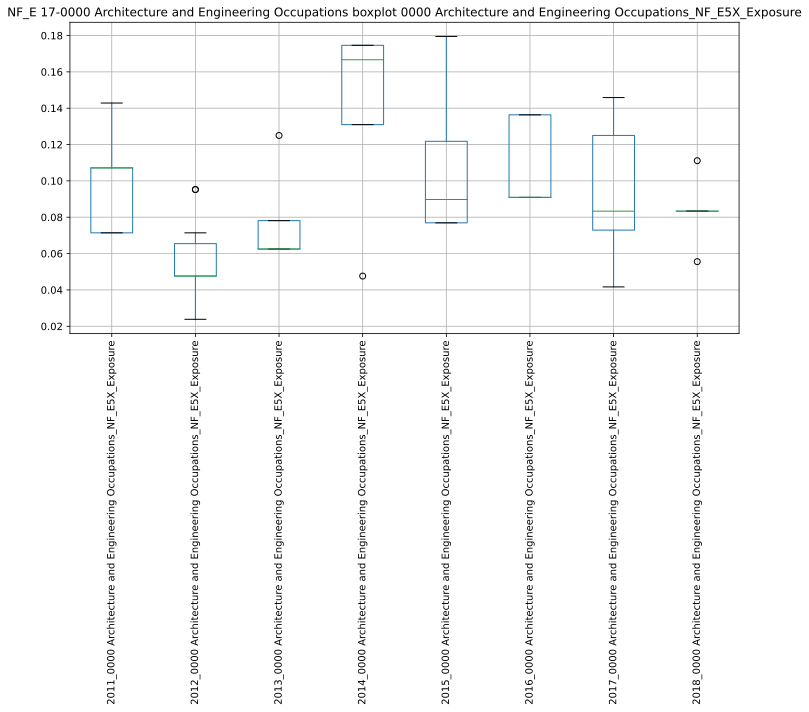

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040249.854489:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040249.896138:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040250.109369:INFO:headless_shell.cc(660)] Written to file /tmp/tmpikz3ou59/temp.png.
[1014/040250.322096:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040250.359089:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040250.629672:INFO:headless_shell.cc(660)] Written to file /tmp/tmp1pnwx___/temp.png.
[1014/040250.894367:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040250.934890:WARNI

,2011_0000 Architecture and Engineering Occupations_NF_E5X_Exposure,2012_0000 Architecture and Engineering Occupations_NF_E5X_Exposure,2013_0000 Architecture and Engineering Occupations_NF_E5X_Exposure,2014_0000 Architecture and Engineering Occupations_NF_E5X_Exposure,2015_0000 Architecture and Engineering Occupations_NF_E5X_Exposure,2016_0000 Architecture and Engineering Occupations_NF_E5X_Exposure,2017_0000 Architecture and Engineering Occupations_NF_E5X_Exposure,2018_0000 Architecture and Engineering Occupations_NF_E5X_Exposure
2011_0000 Architecture and Engineering Occupations_NF_E5X_Exposure,1.000000,nan,0.174078,0.000000,0.866025,0.301511,0.500000,0.000000
2012_0000 Architecture and Engineering Occupations_NF_E5X_Exposure,nan,1.000000,nan,-0.992523,0.968496,-0.577350,-0.980196,-0.790569
2013_0000 Architecture and Engineering Occupations_NF_E5X_Exposure,0.174078,nan,1.000000,-1.000000,-0.500000,nan,nan,1.000000
2014_0000 Architecture and Engineering Occupations_NF_E5X_Exposure,0.000000,-0.992523,-1.000000,1.000000,-0.946057,nan,1.000000,0.739923
2015_0000 Architecture and Engineering Occupations_NF_E5X_Exposure,0.866025,0.968496,-0.500000,-0.946057,1.000000,nan,-0.970725,-0.862662
2016_0000 Architecture and Engineering Occupations_NF_E5X_Exposure,0.301511,-0.577350,nan,nan,nan,1.000000,0.962250,nan
2017_0000 Architecture and Engineering Occupations_NF_E5X_Exposure,0.500000,-0.980196,nan,1.000000,-0.970725,0.962250,1.000000,0.443607
2018_0000 Architecture and Engineering Occupations_NF_E5X_Exposure,0.000000,-0.790569,1.000000,0.739923,-0.862662,nan,0.443607,1.000000


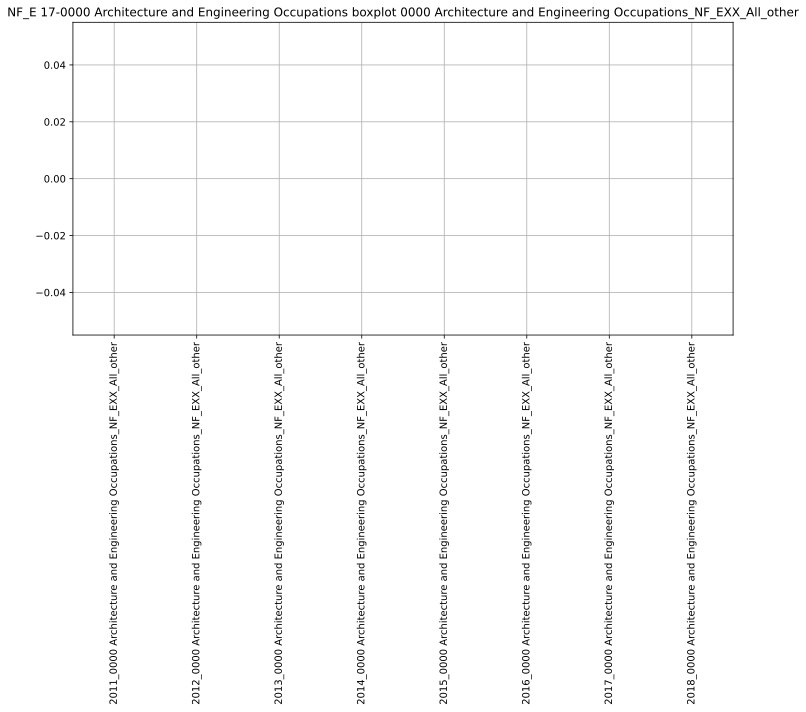

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040253.609458:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040253.646543:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040253.859898:INFO:headless_shell.cc(660)] Written to file /tmp/tmpsn30j5aj/temp.png.
[1014/040254.080326:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040254.120353:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040254.400855:INFO:headless_shell.cc(660)] Written to file /tmp/tmpxiazl6ar/temp.png.
[1014/040254.668072:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040254.705354:WARNI

,2011_0000 Architecture and Engineering Occupations_NF_EXX_All_other,2012_0000 Architecture and Engineering Occupations_NF_EXX_All_other,2013_0000 Architecture and Engineering Occupations_NF_EXX_All_other,2014_0000 Architecture and Engineering Occupations_NF_EXX_All_other,2015_0000 Architecture and Engineering Occupations_NF_EXX_All_other,2016_0000 Architecture and Engineering Occupations_NF_EXX_All_other,2017_0000 Architecture and Engineering Occupations_NF_EXX_All_other,2018_0000 Architecture and Engineering Occupations_NF_EXX_All_other
2011_0000 Architecture and Engineering Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Architecture and Engineering Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Architecture and Engineering Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Architecture and Engineering Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Architecture and Engineering Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Architecture and Engineering Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Architecture and Engineering Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Architecture and Engineering Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['17-0000 Architecture and Engineering Occupations_NF_E7X_Overex', '17-0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal', '17-0000 Architecture and Engineering Occupations_NF_E2X_Transportion', '17-0000 Architecture and Engineering Occupations_NF_E6X_Contact', '17-0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip', '17-0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion', '17-0000 Architecture and Engineering Occupations_NF_E5X_Exposure', '17-0000 Architecture and Engineering Occupations_NF_EXX_All_other']


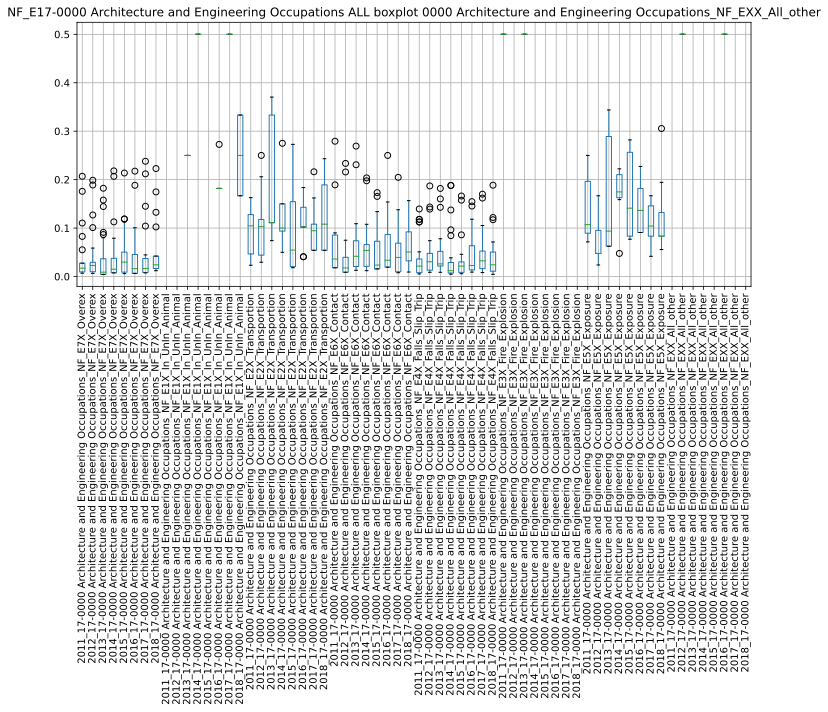

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040303.967769:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040304.004461:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040304.476717:INFO:headless_shell.cc(660)] Written to file /tmp/tmpaqap5hgb/temp.png.
[1014/040304.708657:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040304.747733:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040305.402914:INFO:headless_shell.cc(660)] Written to file /tmp/tmpg2ew5sw5/temp.png.
[1014/040305.712330:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040305.767606:WARNI

,2011_17-0000 Architecture and Engineering Occupations_NF_E7X_Overex,2012_17-0000 Architecture and Engineering Occupations_NF_E7X_Overex,2013_17-0000 Architecture and Engineering Occupations_NF_E7X_Overex,2014_17-0000 Architecture and Engineering Occupations_NF_E7X_Overex,2015_17-0000 Architecture and Engineering Occupations_NF_E7X_Overex,2016_17-0000 Architecture and Engineering Occupations_NF_E7X_Overex,2017_17-0000 Architecture and Engineering Occupations_NF_E7X_Overex,2018_17-0000 Architecture and Engineering Occupations_NF_E7X_Overex,2011_17-0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,2012_17-0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,2013_17-0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,2014_17-0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,2015_17-0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,2016_17-0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,2017_17-0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,2018_17-0000 Architecture and Engineering Occupations_NF_E1X_In_UnIn_Animal,2011_17-0000 Architecture and Engineering Occupations_NF_E2X_Transportion,2012_17-0000 Architecture and Engineering Occupations_NF_E2X_Transportion,2013_17-0000 Architecture and Engineering Occupations_NF_E2X_Transportion,2014_17-0000 Architecture and Engineering Occupations_NF_E2X_Transportion,2015_17-0000 Architecture and Engineering Occupations_NF_E2X_Transportion,2016_17-0000 Architecture and Engineering Occupations_NF_E2X_Transportion,2017_17-0000 Architecture and Engineering Occupations_NF_E2X_Transportion,2018_17-0000 Architecture and Engineering Occupations_NF_E2X_Transportion,2011_17-0000 Architecture and Engineering Occupations_NF_E6X_Contact,2012_17-0000 Architecture and Engineering Occupations_NF_E6X_Contact,2013_17-0000 Architecture and Engineering Occupations_NF_E6X_Contact,2014_17-0000 Architecture and Engineering Occupations_NF_E6X_Contact,2015_17-0000 Architecture and Engineering Occupations_NF_E6X_Contact,2016_17-0000 Architecture and Engineering Occupations_NF_E6X_Contact,2017_17-0000 Architecture and Engineering Occupations_NF_E6X_Contact,2018_17-0000 Architecture and Engineering Occupations_NF_E6X_Contact,2011_17-0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,2012_17-0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,2013_17-0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,2014_17-0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,2015_17-0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,2016_17-0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,2017_17-0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,2018_17-0000 Architecture and Engineering Occupations_NF_E4X_Falls_Slip_Trip,2011_17-0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,2012_17-0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,2013_17-0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,2014_17-0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,2015_17-0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,2016_17-0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,2017_17-0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,2018_17-0000 Architecture and Engineering Occupations_NF_E3X_Fire_Explosion,2011_17-0000 Architecture and Engineering Occupations_NF_E5X_Exposure,2012_17-0000 Architecture and Engineering Occupations_NF_E5X_Exposure,2013_17-0000 Architecture and Engineering Occupations_NF_E5X_Exposure,2014_17-0000 Architecture and Engineering Occupations_NF_E5X_Exposure,2015_17-0000 Architecture and Engineering Occupations_NF_E5X_Exposure,2016_17-0000 Architecture and Engineering Occupations_NF_E5X_Exposure,2017_17-0000 Architecture and Engineering Occupations_NF_E5

########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
NF_E7X_Overex_all.csv
NF_E1X_In_UnIn_Animal_all.csv
NF_E2X_Transportion_all.csv
NF_E6X_Contact_all.csv
NF_E4X_Falls_Slip_Trip_all.csv
NF_E3X_Fire_Explosion_all.csv
NF_E5X_Exposure_all.csv
NF_EXX_All_other_all.csv
dict_keys(['NF_E7X_Overex', 'NF_E1X_In_UnIn_Animal', 'NF_E2X_Transportion', 'NF_E6X_Contact', 'NF_E4X_Falls_Slip_Trip', 'NF_E3X_Fire_Explosion', 'NF_E5X_Exposure', 'NF_EXX_All_other'])
############ OCCUPATION ############
19-0000 Life, Physical, and Social Science Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
19-0000 Life, Physical, and Social Science Occupations
 
########## NEED TO EVAL ##################
########## NEED TO E

/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


########## NEED TO EVAL ##################
########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
NF_E7X_Overex_all.csv
NF_E1X_In_UnIn_Animal_all.csv
NF_E2X_Transportion_all.csv
NF_E6X_Contact_all.csv
NF_E4X_Falls_Slip_Trip_all.csv
NF_E3X_Fire_Explosion_all.csv
NF_E5X_Exposure_all.csv
NF_EXX_All_other_all.csv
dict_keys(['NF_E7X_Overex', 'NF_E1X_In_UnIn_Animal', 'NF_E2X_Transportion', 'NF_E6X_Contact', 'NF_E4X_Falls_Slip_Trip', 'NF_E3X_Fire_Explosion', 'NF_E5X_Exposure', 'NF_EXX_All_other'])
############ OCCUPATION ############
19-0000 Life, Physical, and Social Science Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
19-0000 Life, Physical, and Social Science Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
19-0

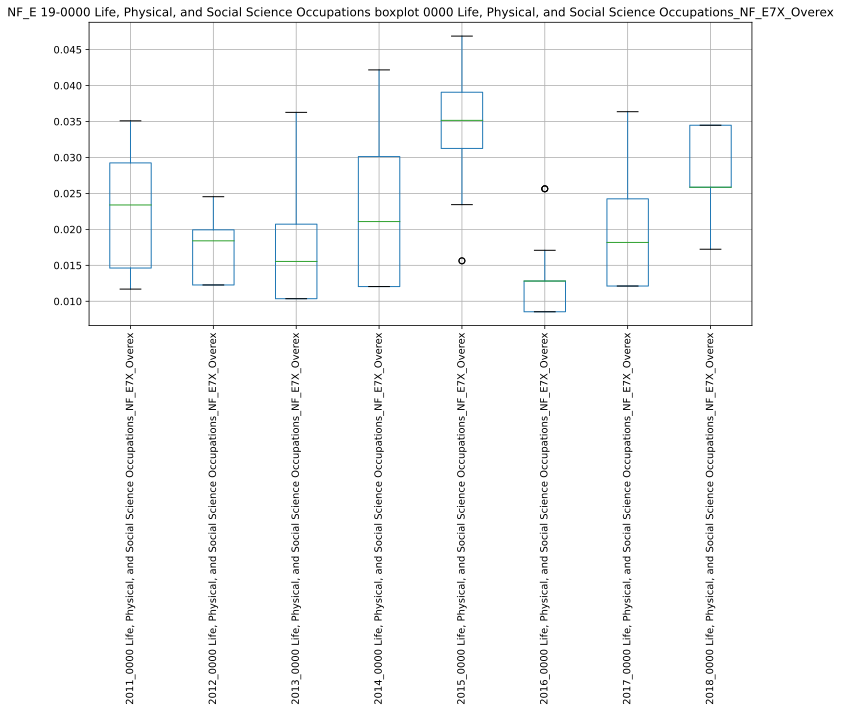

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040431.372965:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040431.411125:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040431.624343:INFO:headless_shell.cc(660)] Written to file /tmp/tmp4yfmdbgz/temp.png.
[1014/040431.849984:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040431.886608:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040432.204123:INFO:headless_shell.cc(660)] Written to file /tmp/tmpfrijgip5/temp.png.
[1014/040432.477718:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040432.516731:WARNI

,"2011_0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex","2012_0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex","2013_0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex","2014_0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex","2015_0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex","2016_0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex","2017_0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex","2018_0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex"
"2011_0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex",1.000000,0.145974,0.330698,-0.051671,0.237881,0.317258,-0.050245,0.237624
"2012_0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex",0.145974,1.000000,0.360726,-0.647415,-0.157191,0.039093,-0.271696,0.028161
"2013_0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex",0.330698,0.360726,1.000000,0.049196,-0.041021,0.128737,0.191154,0.047121
"2014_0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex",-0.051671,-0.647415,0.049196,1.000000,-0.141147,0.032752,0.497620,-0.331614
"2015_0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex",0.237881,-0.157191,-0.041021,-0.141147,1.000000,-0.518558,-0.321808,0.100924
"2016_0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex",0.317258,0.039093,0.128737,0.032752,-0.518558,1.000000,0.069095,-0.492461
"2017_0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex",-0.050245,-0.271696,0.191154,0.497620,-0.321808,0.069095,1.000000,0.034251
"2018_0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex",0.237624,0.028161,0.047121,-0.331614,0.100924,-0.492461,0.034251,1.000000


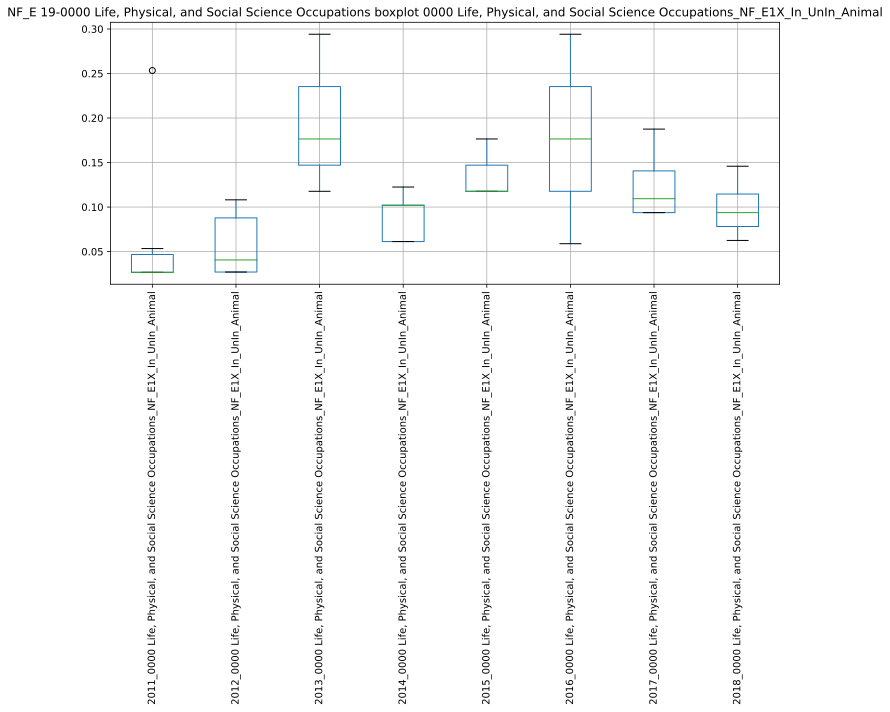

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040435.367334:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040435.406135:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040435.683209:INFO:headless_shell.cc(660)] Written to file /tmp/tmpx5e7oddu/temp.png.
[1014/040435.893039:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040435.930321:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040436.211452:INFO:headless_shell.cc(660)] Written to file /tmp/tmpw7jqri4j/temp.png.
[1014/040436.485049:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040436.522619:WARNI

,"2011_0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal","2012_0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal","2013_0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal","2014_0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal","2015_0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal","2016_0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal","2017_0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal","2018_0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal"
"2011_0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal",1.000000,0.993638,nan,0.574367,nan,nan,1.000000,nan
"2012_0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal",0.993638,1.000000,nan,0.485071,nan,nan,1.000000,nan
"2013_0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal",nan,nan,1.000000,nan,1.000000,1.000000,nan,-1.000000
"2014_0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal",0.574367,0.485071,nan,1.000000,nan,nan,-0.188982,nan
"2015_0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal",nan,nan,1.000000,nan,1.000000,1.000000,nan,-0.866025
"2016_0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal",nan,nan,1.000000,nan,1.000000,1.000000,nan,-1.000000
"2017_0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal",1.000000,1.000000,nan,-0.188982,nan,nan,1.000000,1.000000
"2018_0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal",nan,nan,-1.000000,nan,-0.866025,-1.000000,1.000000,1.000000


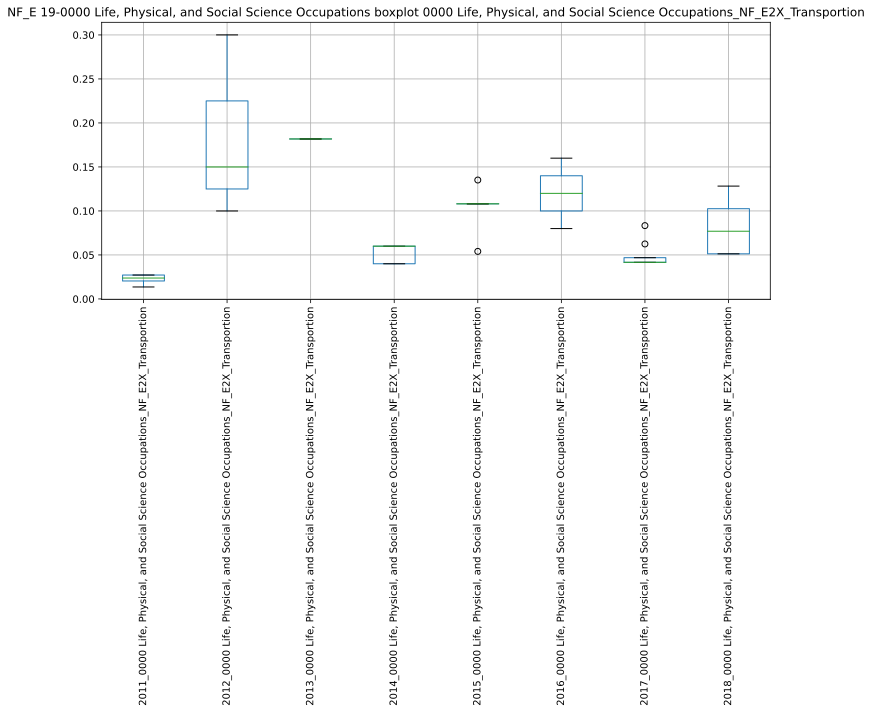

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040440.597166:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040440.630284:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040440.876437:INFO:headless_shell.cc(660)] Written to file /tmp/tmponk86jps/temp.png.
[1014/040441.093706:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040441.131056:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040441.414470:INFO:headless_shell.cc(660)] Written to file /tmp/tmpgqu167b9/temp.png.
[1014/040441.680287:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040441.717811:WARNI

,"2011_0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion","2012_0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion","2013_0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion","2014_0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion","2015_0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion","2016_0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion","2017_0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion","2018_0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion"
"2011_0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion",1.000000,nan,nan,0.645497,-0.577350,nan,0.534522,0.866025
"2012_0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion",nan,1.000000,nan,nan,-1.000000,nan,nan,0.720577
"2013_0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion",nan,nan,nan,nan,nan,nan,nan,nan
"2014_0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion",0.645497,nan,nan,1.000000,-0.577350,0.866025,nan,0.771744
"2015_0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion",-0.577350,-1.000000,nan,-0.577350,1.000000,-1.000000,-0.927173,-0.188982
"2016_0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion",nan,nan,nan,0.866025,-1.000000,1.000000,nan,nan
"2017_0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion",0.534522,nan,nan,nan,-0.927173,nan,1.000000,nan
"2018_0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion",0.866025,0.720577,nan,0.771744,-0.188982,nan,nan,1.000000


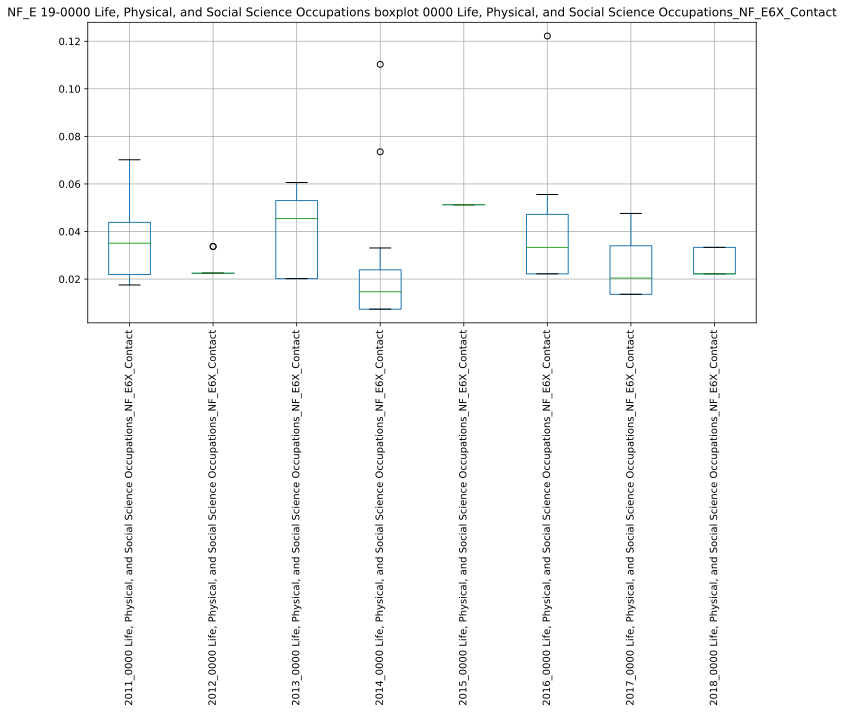

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040445.751107:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040445.791330:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040446.006689:INFO:headless_shell.cc(660)] Written to file /tmp/tmparwpvl3w/temp.png.
[1014/040446.225248:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040446.264400:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040446.550430:INFO:headless_shell.cc(660)] Written to file /tmp/tmpxjlmh4e2/temp.png.
[1014/040446.820659:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040446.857779:WARNI

,"2011_0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact","2012_0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact","2013_0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact","2014_0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact","2015_0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact","2016_0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact","2017_0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact","2018_0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact"
"2011_0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact",1.000000,0.317999,0.183785,0.385478,nan,-0.044858,0.106135,-0.270089
"2012_0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact",0.317999,1.000000,-0.534522,-0.214066,nan,0.043355,-0.000000,nan
"2013_0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact",0.183785,-0.534522,1.000000,0.610371,nan,-0.000000,0.572293,0.320256
"2014_0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact",0.385478,-0.214066,0.610371,1.000000,nan,0.102162,-0.224139,0.344414
"2015_0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact",nan,nan,nan,nan,nan,nan,nan,nan
"2016_0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact",-0.044858,0.043355,-0.000000,0.102162,nan,1.000000,-0.093348,0.455354
"2017_0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact",0.106135,-0.000000,0.572293,-0.224139,nan,-0.093348,1.000000,-0.091502
"2018_0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact",-0.270089,nan,0.320256,0.344414,nan,0.455354,-0.091502,1.000000


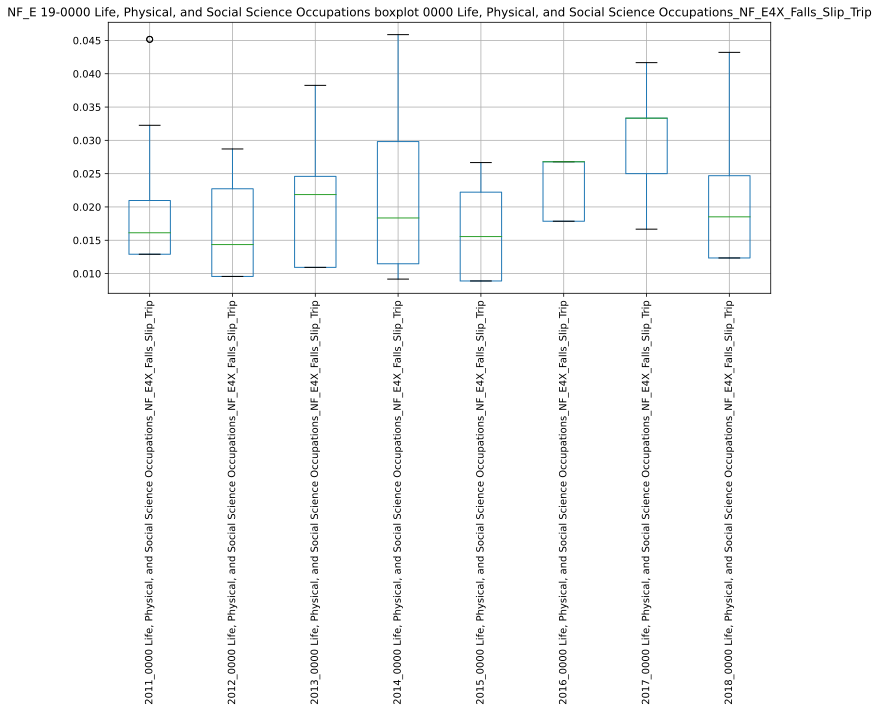

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040450.902485:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040450.939497:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040451.175245:INFO:headless_shell.cc(660)] Written to file /tmp/tmpfrgikexl/temp.png.
[1014/040451.392898:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040451.429810:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040451.715057:INFO:headless_shell.cc(660)] Written to file /tmp/tmps57boy1l/temp.png.
[1014/040451.985845:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040452.023203:WARNI

,"2011_0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip","2012_0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip","2013_0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip","2014_0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip","2015_0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip","2016_0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip","2017_0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip","2018_0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip"
"2011_0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip",1.000000,0.560168,0.318728,0.289965,-0.156695,-0.007628,0.286860,0.345859
"2012_0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip",0.560168,1.000000,0.466560,-0.299728,-0.255616,-0.271448,-0.642278,0.114583
"2013_0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip",0.318728,0.466560,1.000000,-0.146451,-0.195743,0.113240,-0.191276,0.261518
"2014_0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip",0.289965,-0.299728,-0.146451,1.000000,0.343795,0.149761,0.495057,-0.195876
"2015_0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip",-0.156695,-0.255616,-0.195743,0.343795,1.000000,-0.231738,0.328951,-0.409960
"2016_0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip",-0.007628,-0.271448,0.113240,0.149761,-0.231738,1.000000,-0.125656,0.556794
"2017_0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip",0.286860,-0.642278,-0.191276,0.495057,0.328951,-0.125656,1.000000,0.254944
"2018_0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip",0.345859,0.114583,0.261518,-0.195876,-0.409960,0.556794,0.254944,1.000000


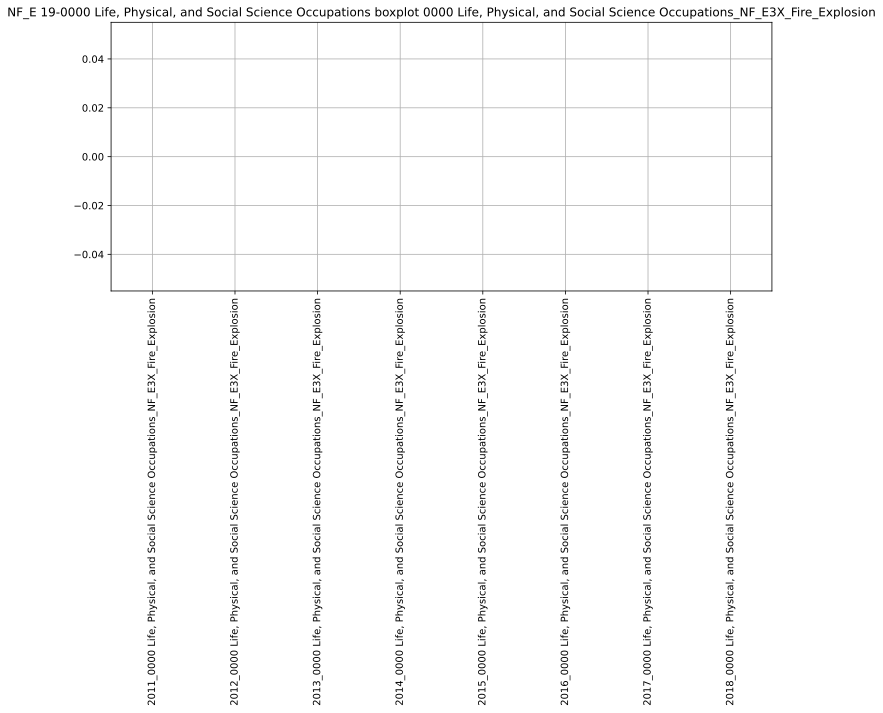

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040456.057807:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040456.100395:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040456.318938:INFO:headless_shell.cc(660)] Written to file /tmp/tmpb9zcqw92/temp.png.
[1014/040456.537061:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040456.575636:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040456.858013:INFO:headless_shell.cc(660)] Written to file /tmp/tmplhrwdczl/temp.png.
[1014/040457.124458:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040457.163884:WARNI

,"2011_0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion","2012_0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion","2013_0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion","2014_0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion","2015_0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion","2016_0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion","2017_0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion","2018_0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion"
"2011_0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion",nan,nan,nan,nan,nan,nan,nan,nan
"2012_0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion",nan,nan,nan,nan,nan,nan,nan,nan
"2013_0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion",nan,nan,nan,nan,nan,nan,nan,nan
"2014_0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion",nan,nan,nan,nan,nan,nan,nan,nan
"2015_0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion",nan,nan,nan,nan,nan,nan,nan,nan
"2016_0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion",nan,nan,nan,nan,nan,nan,nan,nan
"2017_0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion",nan,nan,nan,nan,nan,nan,nan,nan
"2018_0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion",nan,nan,nan,nan,nan,nan,nan,nan


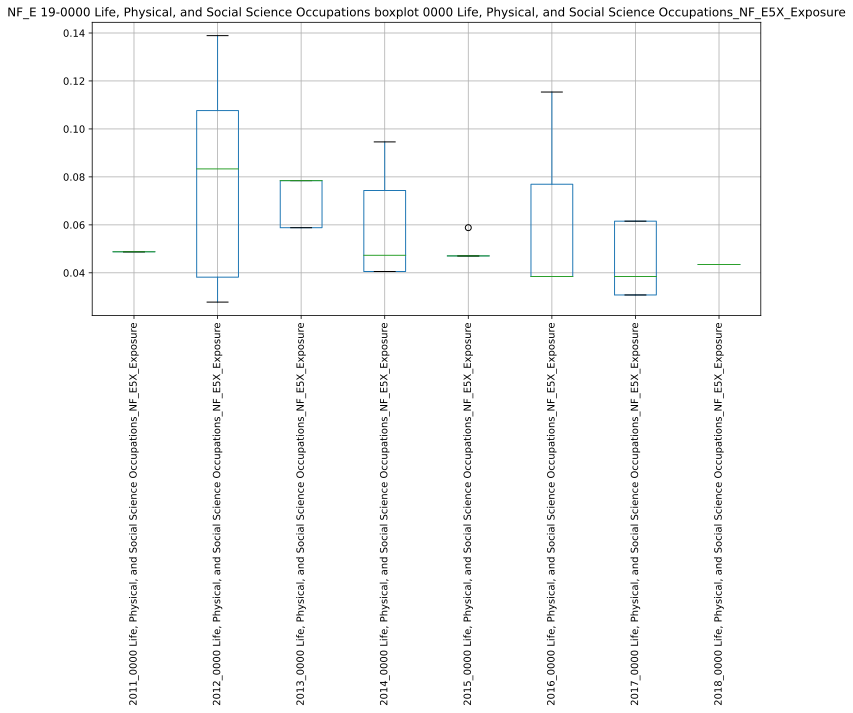

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040501.167483:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040501.203791:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040501.419604:INFO:headless_shell.cc(660)] Written to file /tmp/tmpxqm01i0v/temp.png.
[1014/040501.635714:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040501.672103:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040501.962041:INFO:headless_shell.cc(660)] Written to file /tmp/tmpqa91vbbf/temp.png.
[1014/040502.233885:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040502.271042:WARNI

,"2011_0000 Life, Physical, and Social Science Occupations_NF_E5X_Exposure","2012_0000 Life, Physical, and Social Science Occupations_NF_E5X_Exposure","2013_0000 Life, Physical, and Social Science Occupations_NF_E5X_Exposure","2014_0000 Life, Physical, and Social Science Occupations_NF_E5X_Exposure","2015_0000 Life, Physical, and Social Science Occupations_NF_E5X_Exposure","2016_0000 Life, Physical, and Social Science Occupations_NF_E5X_Exposure","2017_0000 Life, Physical, and Social Science Occupations_NF_E5X_Exposure","2018_0000 Life, Physical, and Social Science Occupations_NF_E5X_Exposure"
"2011_0000 Life, Physical, and Social Science Occupations_NF_E5X_Exposure",nan,nan,nan,nan,nan,nan,nan,nan
"2012_0000 Life, Physical, and Social Science Occupations_NF_E5X_Exposure",nan,1.000000,-0.283422,-0.242374,0.557136,0.306719,0.584705,nan
"2013_0000 Life, Physical, and Social Science Occupations_NF_E5X_Exposure",nan,-0.283422,1.000000,-0.341882,-0.471405,0.158114,-0.408248,nan
"2014_0000 Life, Physical, and Social Science Occupations_NF_E5X_Exposure",nan,-0.242374,-0.341882,1.000000,-0.314286,-0.263523,-0.105810,nan
"2015_0000 Life, Physical, and Social Science Occupations_NF_E5X_Exposure",nan,0.557136,-0.471405,-0.314286,1.000000,nan,0.471621,nan
"2016_0000 Life, Physical, and Social Science Occupations_NF_E5X_Exposure",nan,0.306719,0.158114,-0.263523,nan,1.000000,0.000000,nan
"2017_0000 Life, Physical, and Social Science Occupations_NF_E5X_Exposure",nan,0.584705,-0.408248,-0.105810,0.471621,0.000000,1.000000,nan
"2018_0000 Life, Physical, and Social Science Occupations_NF_E5X_Exposure",nan,nan,nan,nan,nan,nan,nan,nan


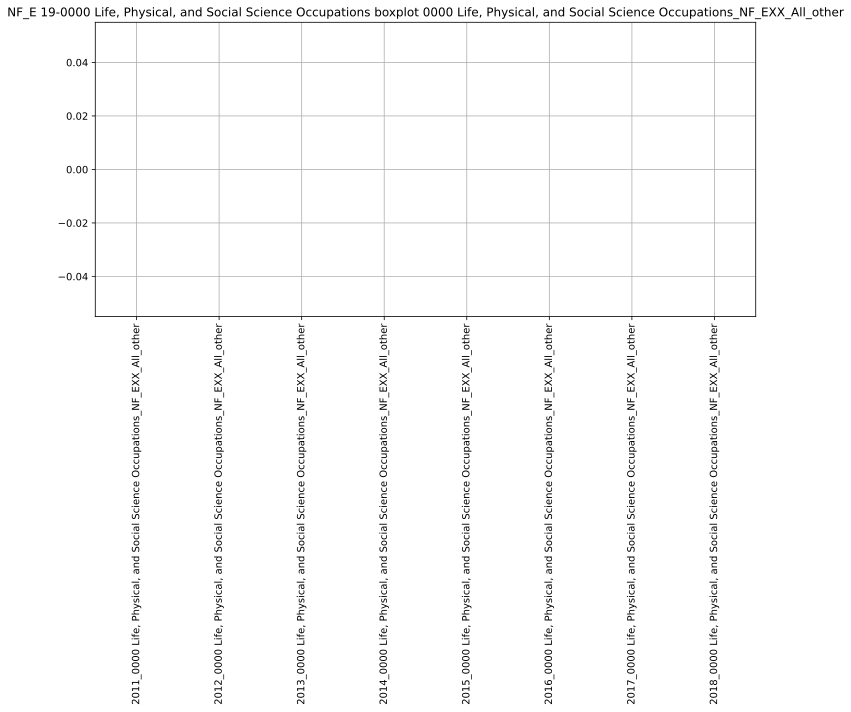

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040506.335303:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040506.372545:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040506.586560:INFO:headless_shell.cc(660)] Written to file /tmp/tmpgs2yo7i6/temp.png.
[1014/040506.804656:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040506.842026:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040507.124258:INFO:headless_shell.cc(660)] Written to file /tmp/tmpahlsg8q1/temp.png.
[1014/040507.393564:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040507.431380:WARNI

,"2011_0000 Life, Physical, and Social Science Occupations_NF_EXX_All_other","2012_0000 Life, Physical, and Social Science Occupations_NF_EXX_All_other","2013_0000 Life, Physical, and Social Science Occupations_NF_EXX_All_other","2014_0000 Life, Physical, and Social Science Occupations_NF_EXX_All_other","2015_0000 Life, Physical, and Social Science Occupations_NF_EXX_All_other","2016_0000 Life, Physical, and Social Science Occupations_NF_EXX_All_other","2017_0000 Life, Physical, and Social Science Occupations_NF_EXX_All_other","2018_0000 Life, Physical, and Social Science Occupations_NF_EXX_All_other"
"2011_0000 Life, Physical, and Social Science Occupations_NF_EXX_All_other",nan,nan,nan,nan,nan,nan,nan,nan
"2012_0000 Life, Physical, and Social Science Occupations_NF_EXX_All_other",nan,nan,nan,nan,nan,nan,nan,nan
"2013_0000 Life, Physical, and Social Science Occupations_NF_EXX_All_other",nan,nan,nan,nan,nan,nan,nan,nan
"2014_0000 Life, Physical, and Social Science Occupations_NF_EXX_All_other",nan,nan,nan,nan,nan,nan,nan,nan
"2015_0000 Life, Physical, and Social Science Occupations_NF_EXX_All_other",nan,nan,nan,nan,nan,nan,nan,nan
"2016_0000 Life, Physical, and Social Science Occupations_NF_EXX_All_other",nan,nan,nan,nan,nan,nan,nan,nan
"2017_0000 Life, Physical, and Social Science Occupations_NF_EXX_All_other",nan,nan,nan,nan,nan,nan,nan,nan
"2018_0000 Life, Physical, and Social Science Occupations_NF_EXX_All_other",nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['19-0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex', '19-0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal', '19-0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion', '19-0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact', '19-0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip', '19-0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion', '19-0000 Life, Physical, and Social Science Occupations_NF_E5X_Exposure', '19-0000 Life, Physical, and Social Science Occupations_NF_EXX_All_other']


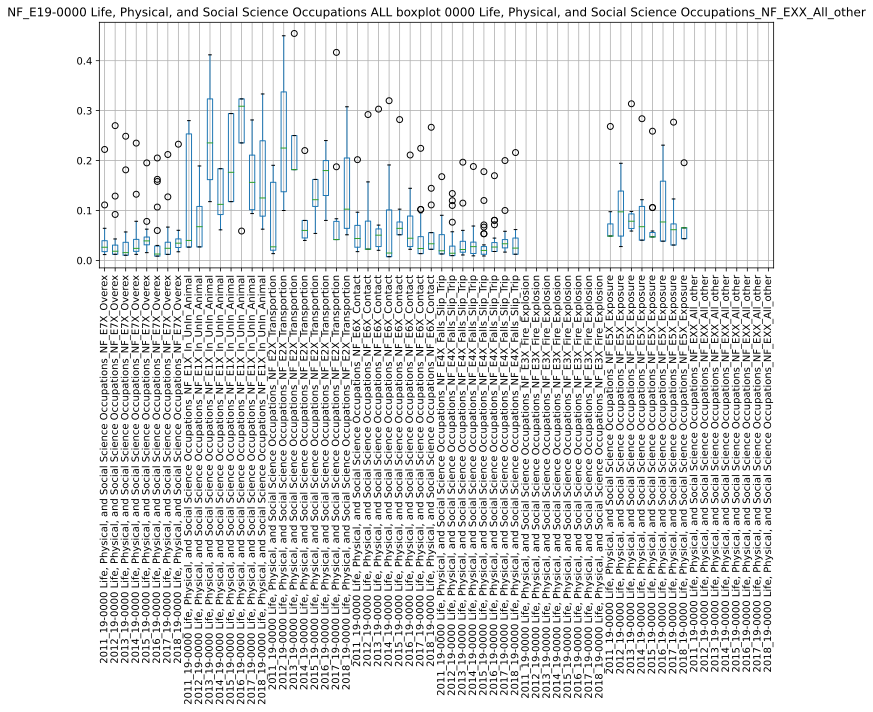

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040518.268432:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040518.305292:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040518.776284:INFO:headless_shell.cc(660)] Written to file /tmp/tmpyyh2mk53/temp.png.
[1014/040518.998010:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040519.036590:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040519.699582:INFO:headless_shell.cc(660)] Written to file /tmp/tmp_ocfhkee/temp.png.
[1014/040520.031483:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040520.069230:WARNI

,"2011_19-0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex","2012_19-0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex","2013_19-0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex","2014_19-0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex","2015_19-0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex","2016_19-0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex","2017_19-0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex","2018_19-0000 Life, Physical, and Social Science Occupations_NF_E7X_Overex","2011_19-0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal","2012_19-0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal","2013_19-0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal","2014_19-0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal","2015_19-0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal","2016_19-0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal","2017_19-0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal","2018_19-0000 Life, Physical, and Social Science Occupations_NF_E1X_In_UnIn_Animal","2011_19-0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion","2012_19-0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion","2013_19-0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion","2014_19-0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion","2015_19-0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion","2016_19-0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion","2017_19-0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion","2018_19-0000 Life, Physical, and Social Science Occupations_NF_E2X_Transportion","2011_19-0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact","2012_19-0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact","2013_19-0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact","2014_19-0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact","2015_19-0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact","2016_19-0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact","2017_19-0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact","2018_19-0000 Life, Physical, and Social Science Occupations_NF_E6X_Contact","2011_19-0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip","2012_19-0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip","2013_19-0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip","2014_19-0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip","2015_19-0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip","2016_19-0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip","2017_19-0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip","2018_19-0000 Life, Physical, and Social Science Occupations_NF_E4X_Falls_Slip_Trip","2011_19-0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion","2012_19-0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion","2013_19-0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion","2014_19-0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion","2015_19-0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion","2016_19-0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion","2017_19-0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion","2018_19-0000 Life, Physical, and Social Science Occupations_NF_E3X_Fire_Explosion","2011_19-0000 Life, Physical, and Social Science Occupations_NF_E5X_Exposure","2012_19-0000 Lif

########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
NF_E7X_Overex_all.csv
NF_E1X_In_UnIn_Animal_all.csv
NF_E2X_Transportion_all.csv
NF_E6X_Contact_all.csv
NF_E4X_Falls_Slip_Trip_all.csv
NF_E3X_Fire_Explosion_all.csv
NF_E5X_Exposure_all.csv
NF_EXX_All_other_all.csv
dict_keys(['NF_E7X_Overex', 'NF_E1X_In_UnIn_Animal', 'NF_E2X_Transportion', 'NF_E6X_Contact', 'NF_E4X_Falls_Slip_Trip', 'NF_E3X_Fire_Explosion', 'NF_E5X_Exposure', 'NF_EXX_All_other'])
############ OCCUPATION ############
21-0000 Community and Social Service Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
21-0000 Community and Social Service Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ########

/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
NF_E7X_Overex_all.csv
NF_E1X_In_UnIn_Animal_all.csv
NF_E2X_Transportion_all.csv
NF_E6X_Contact_all.csv
NF_E4X_Falls_Slip_Trip_all.csv
NF_E3X_Fire_Explosion_all.csv
NF_E5X_Exposure_all.csv
NF_EXX_All_other_all.csv
dict_keys(['NF_E7X_Overex', 'NF_E1X_In_UnIn_Animal', 'NF_E2X_Transportion', 'NF_E6X_Contact', 'NF_E4X_Falls_Slip_Trip', 'NF_E3X_Fire_Explosion', 'NF_E5X_Exposure', 'NF_EXX_All_other'])
############ OCCUPATION ############
21-0000 Community and Social Service Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
21-0000 Community and Social Service Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
21-0000 Community and Social Service Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATIO

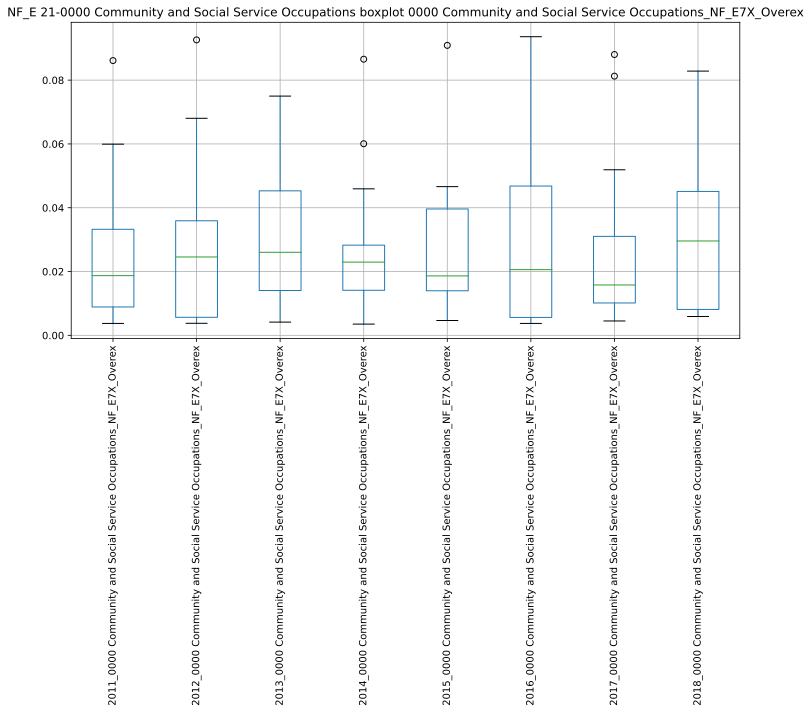

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040726.191971:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040726.245854:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040726.470753:INFO:headless_shell.cc(660)] Written to file /tmp/tmpxwswsciw/temp.png.
[1014/040726.699199:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040726.736251:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040727.002699:INFO:headless_shell.cc(660)] Written to file /tmp/tmpvwd8qnqs/temp.png.
[1014/040727.276795:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040727.315390:WARNI

,2011_0000 Community and Social Service Occupations_NF_E7X_Overex,2012_0000 Community and Social Service Occupations_NF_E7X_Overex,2013_0000 Community and Social Service Occupations_NF_E7X_Overex,2014_0000 Community and Social Service Occupations_NF_E7X_Overex,2015_0000 Community and Social Service Occupations_NF_E7X_Overex,2016_0000 Community and Social Service Occupations_NF_E7X_Overex,2017_0000 Community and Social Service Occupations_NF_E7X_Overex,2018_0000 Community and Social Service Occupations_NF_E7X_Overex
2011_0000 Community and Social Service Occupations_NF_E7X_Overex,1.000000,0.156670,0.496852,0.767569,0.779338,0.666252,0.915440,0.316344
2012_0000 Community and Social Service Occupations_NF_E7X_Overex,0.156670,1.000000,0.128115,0.816216,0.697394,0.159659,0.406312,0.630309
2013_0000 Community and Social Service Occupations_NF_E7X_Overex,0.496852,0.128115,1.000000,0.021324,0.203077,0.468472,0.600008,0.459753
2014_0000 Community and Social Service Occupations_NF_E7X_Overex,0.767569,0.816216,0.021324,1.000000,0.898289,0.635197,0.569687,0.503419
2015_0000 Community and Social Service Occupations_NF_E7X_Overex,0.779338,0.697394,0.203077,0.898289,1.000000,0.767775,0.463424,0.538398
2016_0000 Community and Social Service Occupations_NF_E7X_Overex,0.666252,0.159659,0.468472,0.635197,0.767775,1.000000,0.464531,0.590418
2017_0000 Community and Social Service Occupations_NF_E7X_Overex,0.915440,0.406312,0.600008,0.569687,0.463424,0.464531,1.000000,0.555594
2018_0000 Community and Social Service Occupations_NF_E7X_Overex,0.316344,0.630309,0.459753,0.503419,0.538398,0.590418,0.555594,1.000000


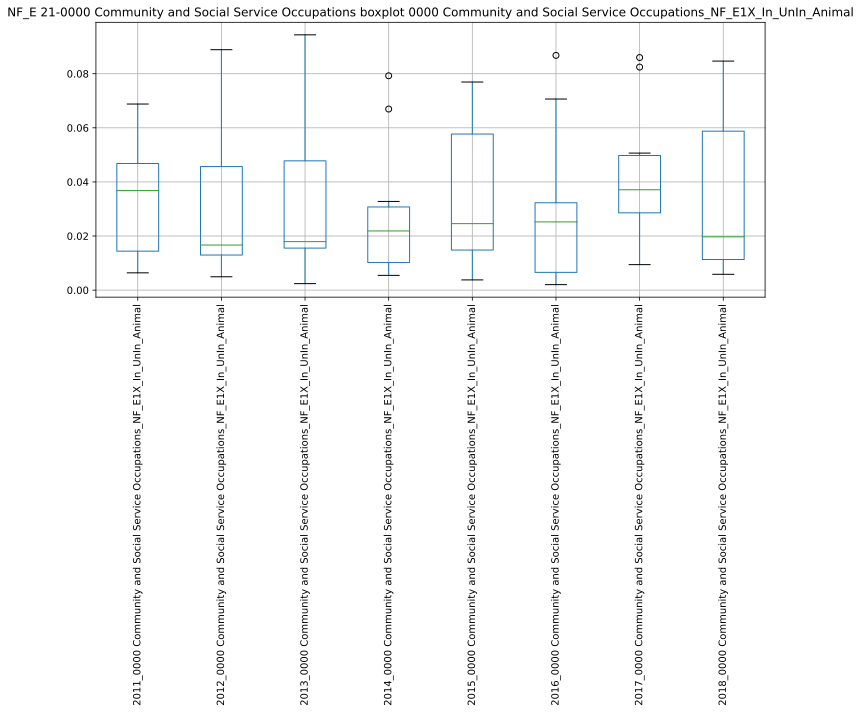

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040730.057798:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040730.103407:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040730.314061:INFO:headless_shell.cc(660)] Written to file /tmp/tmps2jn5c5r/temp.png.
[1014/040730.542478:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040730.580114:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040730.875854:INFO:headless_shell.cc(660)] Written to file /tmp/tmpp64rw6ks/temp.png.
[1014/040731.144396:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040731.184605:WARNI

,2011_0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,2012_0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,2013_0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,2014_0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,2015_0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,2016_0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,2017_0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,2018_0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal
2011_0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,1.000000,0.716925,0.692225,0.740441,-0.058603,0.005837,0.108851,0.354307
2012_0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,0.716925,1.000000,0.666986,0.732145,-0.007797,-0.651210,-0.393378,-0.155065
2013_0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,0.692225,0.666986,1.000000,0.141835,0.143117,-0.332572,-0.029326,0.331195
2014_0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,0.740441,0.732145,0.141835,1.000000,0.350915,0.014540,0.186729,0.268026
2015_0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,-0.058603,-0.007797,0.143117,0.350915,1.000000,0.358512,0.526573,-0.209333
2016_0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,0.005837,-0.651210,-0.332572,0.014540,0.358512,1.000000,0.801307,-0.165010
2017_0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,0.108851,-0.393378,-0.029326,0.186729,0.526573,0.801307,1.000000,0.152445
2018_0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,0.354307,-0.155065,0.331195,0.268026,-0.209333,-0.165010,0.152445,1.000000


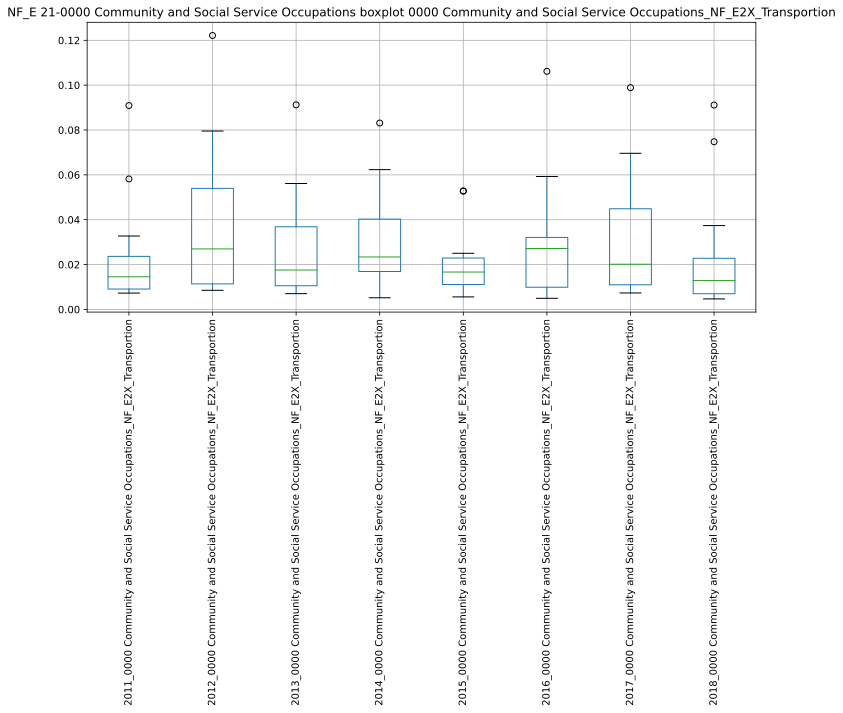

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040735.282773:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040735.322860:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040735.557743:INFO:headless_shell.cc(660)] Written to file /tmp/tmp2q_hcfn5/temp.png.
[1014/040735.775281:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040735.813352:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040736.097187:INFO:headless_shell.cc(660)] Written to file /tmp/tmpmasj55ly/temp.png.
[1014/040736.361972:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040736.399786:WARNI

,2011_0000 Community and Social Service Occupations_NF_E2X_Transportion,2012_0000 Community and Social Service Occupations_NF_E2X_Transportion,2013_0000 Community and Social Service Occupations_NF_E2X_Transportion,2014_0000 Community and Social Service Occupations_NF_E2X_Transportion,2015_0000 Community and Social Service Occupations_NF_E2X_Transportion,2016_0000 Community and Social Service Occupations_NF_E2X_Transportion,2017_0000 Community and Social Service Occupations_NF_E2X_Transportion,2018_0000 Community and Social Service Occupations_NF_E2X_Transportion
2011_0000 Community and Social Service Occupations_NF_E2X_Transportion,1.000000,0.427067,0.471017,-0.142741,0.865483,-0.327958,0.623795,0.662012
2012_0000 Community and Social Service Occupations_NF_E2X_Transportion,0.427067,1.000000,-0.004555,-0.343606,0.666635,-0.513246,-0.147582,-0.358968
2013_0000 Community and Social Service Occupations_NF_E2X_Transportion,0.471017,-0.004555,1.000000,0.377938,0.200335,-0.115960,0.217985,-0.069951
2014_0000 Community and Social Service Occupations_NF_E2X_Transportion,-0.142741,-0.343606,0.377938,1.000000,-0.118521,0.116419,0.040969,0.275205
2015_0000 Community and Social Service Occupations_NF_E2X_Transportion,0.865483,0.666635,0.200335,-0.118521,1.000000,-0.449670,-0.267365,-0.056070
2016_0000 Community and Social Service Occupations_NF_E2X_Transportion,-0.327958,-0.513246,-0.115960,0.116419,-0.449670,1.000000,0.355926,0.629459
2017_0000 Community and Social Service Occupations_NF_E2X_Transportion,0.623795,-0.147582,0.217985,0.040969,-0.267365,0.355926,1.000000,0.891614
2018_0000 Community and Social Service Occupations_NF_E2X_Transportion,0.662012,-0.358968,-0.069951,0.275205,-0.056070,0.629459,0.891614,1.000000


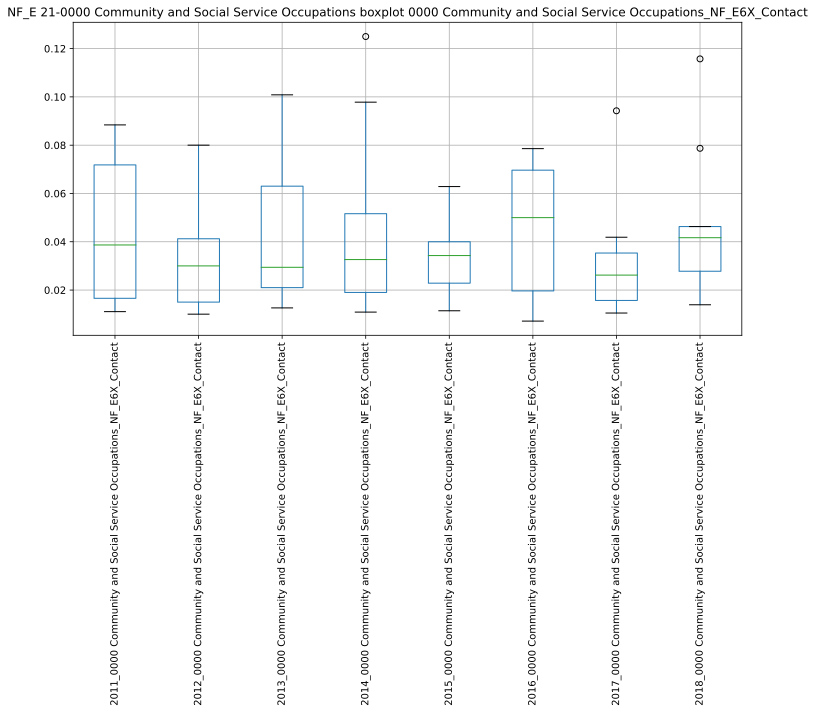

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040740.458803:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040740.495224:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040740.714835:INFO:headless_shell.cc(660)] Written to file /tmp/tmp3pnl8tel/temp.png.
[1014/040740.936703:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040740.974696:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040741.274575:INFO:headless_shell.cc(660)] Written to file /tmp/tmp_pupdats/temp.png.
[1014/040741.546096:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040741.585155:WARNI

,2011_0000 Community and Social Service Occupations_NF_E6X_Contact,2012_0000 Community and Social Service Occupations_NF_E6X_Contact,2013_0000 Community and Social Service Occupations_NF_E6X_Contact,2014_0000 Community and Social Service Occupations_NF_E6X_Contact,2015_0000 Community and Social Service Occupations_NF_E6X_Contact,2016_0000 Community and Social Service Occupations_NF_E6X_Contact,2017_0000 Community and Social Service Occupations_NF_E6X_Contact,2018_0000 Community and Social Service Occupations_NF_E6X_Contact
2011_0000 Community and Social Service Occupations_NF_E6X_Contact,1.000000,0.064250,0.087889,0.576233,-0.415555,-0.083684,0.754319,-0.470944
2012_0000 Community and Social Service Occupations_NF_E6X_Contact,0.064250,1.000000,-0.248108,-0.185291,-0.318278,-0.168036,0.507325,0.118380
2013_0000 Community and Social Service Occupations_NF_E6X_Contact,0.087889,-0.248108,1.000000,0.156083,0.341195,0.392371,0.201848,0.169576
2014_0000 Community and Social Service Occupations_NF_E6X_Contact,0.576233,-0.185291,0.156083,1.000000,0.028067,0.310131,0.500089,-0.530216
2015_0000 Community and Social Service Occupations_NF_E6X_Contact,-0.415555,-0.318278,0.341195,0.028067,1.000000,0.395493,-0.107000,-0.396102
2016_0000 Community and Social Service Occupations_NF_E6X_Contact,-0.083684,-0.168036,0.392371,0.310131,0.395493,1.000000,-0.094260,-0.805973
2017_0000 Community and Social Service Occupations_NF_E6X_Contact,0.754319,0.507325,0.201848,0.500089,-0.107000,-0.094260,1.000000,0.212987
2018_0000 Community and Social Service Occupations_NF_E6X_Contact,-0.470944,0.118380,0.169576,-0.530216,-0.396102,-0.805973,0.212987,1.000000


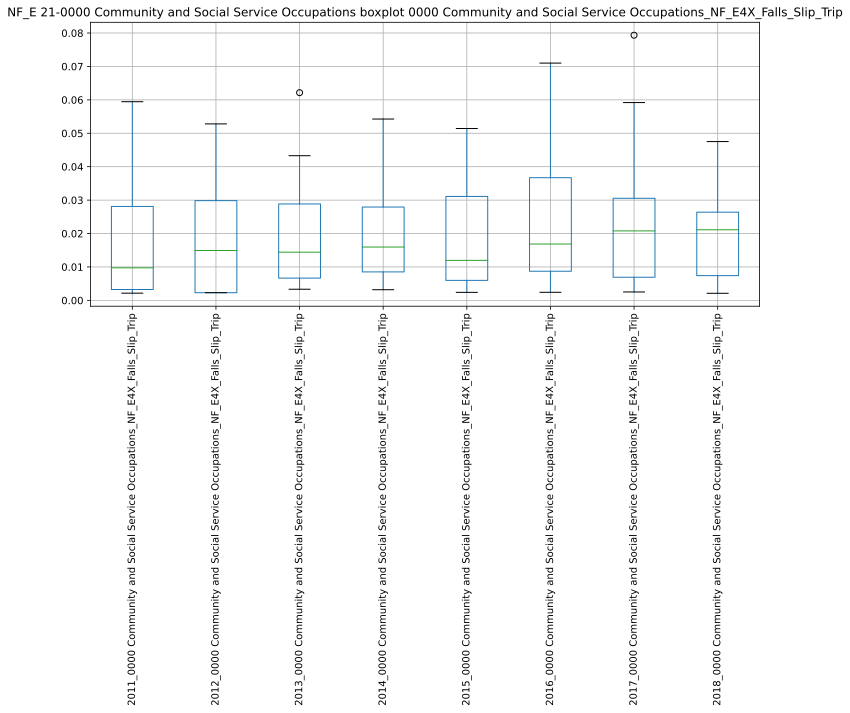

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040744.371895:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040744.412385:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040744.626371:INFO:headless_shell.cc(660)] Written to file /tmp/tmpi52ohiuz/temp.png.
[1014/040744.860534:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040744.899756:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040745.209637:INFO:headless_shell.cc(660)] Written to file /tmp/tmpsi6l9fn6/temp.png.
[1014/040745.493229:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040745.532221:WARNI

,2011_0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,2012_0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,2013_0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,2014_0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,2015_0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,2016_0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,2017_0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,2018_0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip
2011_0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,1.000000,0.292954,0.723633,0.840800,0.313439,-0.260660,0.232507,0.693247
2012_0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,0.292954,1.000000,0.392189,0.291628,0.851986,0.587564,0.892514,0.022774
2013_0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,0.723633,0.392189,1.000000,0.725627,0.166605,-0.263631,0.454986,0.759492
2014_0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,0.840800,0.291628,0.725627,1.000000,0.431280,-0.149874,0.147296,0.672547
2015_0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,0.313439,0.851986,0.166605,0.431280,1.000000,0.765943,0.739786,-0.102644
2016_0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,-0.260660,0.587564,-0.263631,-0.149874,0.765943,1.000000,0.454490,-0.532775
2017_0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,0.232507,0.892514,0.454986,0.147296,0.739786,0.454490,1.000000,0.171119
2018_0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,0.693247,0.022774,0.759492,0.672547,-0.102644,-0.532775,0.171119,1.000000


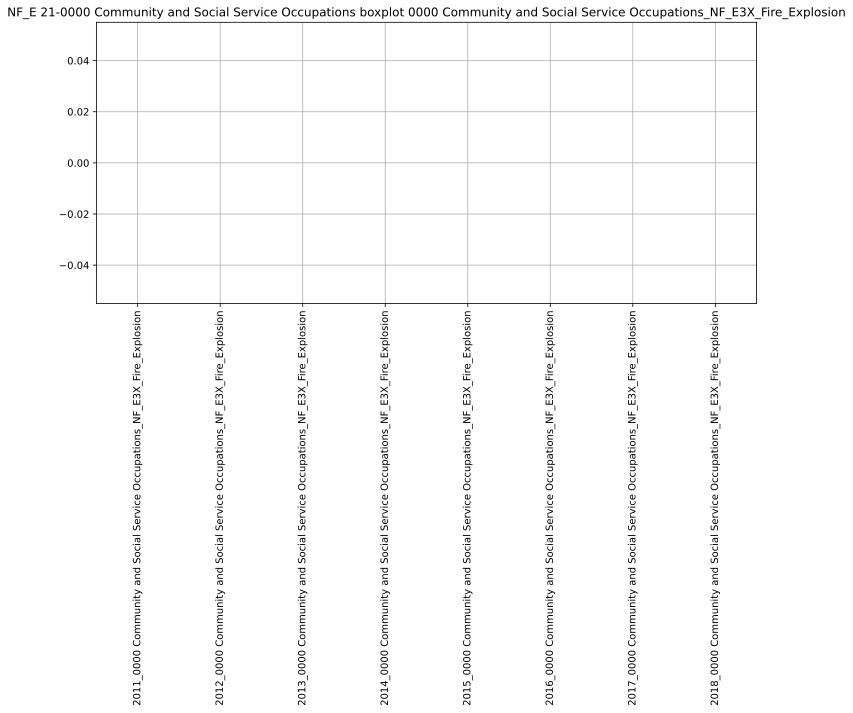

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040749.580287:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040749.617755:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040749.860310:INFO:headless_shell.cc(660)] Written to file /tmp/tmpl4aena7f/temp.png.
[1014/040750.077464:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040750.116276:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040750.374754:INFO:headless_shell.cc(660)] Written to file /tmp/tmpi9wnm_jp/temp.png.
[1014/040750.643085:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040750.680595:WARNI

,2011_0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,2012_0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,2013_0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,2014_0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,2015_0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,2016_0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,2017_0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,2018_0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion
2011_0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan


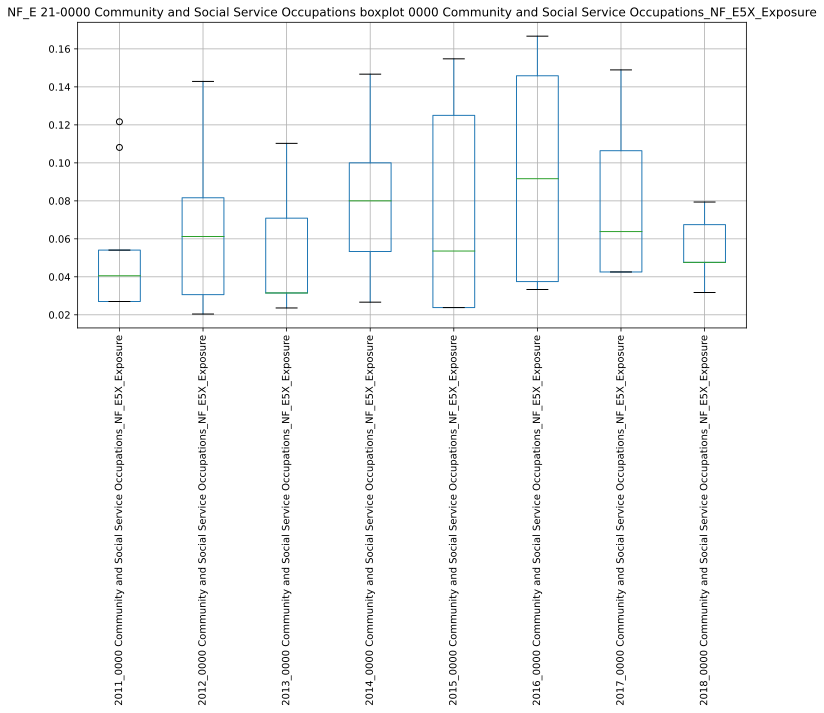

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040754.852233:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040754.891638:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040755.134343:INFO:headless_shell.cc(660)] Written to file /tmp/tmpe5eqejzt/temp.png.
[1014/040755.357296:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040755.394690:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040755.693847:INFO:headless_shell.cc(660)] Written to file /tmp/tmp5qax4ydm/temp.png.
[1014/040755.961709:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040755.999132:WARNI

,2011_0000 Community and Social Service Occupations_NF_E5X_Exposure,2012_0000 Community and Social Service Occupations_NF_E5X_Exposure,2013_0000 Community and Social Service Occupations_NF_E5X_Exposure,2014_0000 Community and Social Service Occupations_NF_E5X_Exposure,2015_0000 Community and Social Service Occupations_NF_E5X_Exposure,2016_0000 Community and Social Service Occupations_NF_E5X_Exposure,2017_0000 Community and Social Service Occupations_NF_E5X_Exposure,2018_0000 Community and Social Service Occupations_NF_E5X_Exposure
2011_0000 Community and Social Service Occupations_NF_E5X_Exposure,1.000000,0.471414,0.621219,0.277331,0.755178,0.957148,0.204007,0.394771
2012_0000 Community and Social Service Occupations_NF_E5X_Exposure,0.471414,1.000000,0.086664,0.969660,0.327241,0.095562,0.250372,0.362915
2013_0000 Community and Social Service Occupations_NF_E5X_Exposure,0.621219,0.086664,1.000000,-0.418089,0.241515,-0.075092,-0.771893,0.036274
2014_0000 Community and Social Service Occupations_NF_E5X_Exposure,0.277331,0.969660,-0.418089,1.000000,0.412512,0.259099,0.433082,0.495940
2015_0000 Community and Social Service Occupations_NF_E5X_Exposure,0.755178,0.327241,0.241515,0.412512,1.000000,0.639606,-0.154853,-0.411693
2016_0000 Community and Social Service Occupations_NF_E5X_Exposure,0.957148,0.095562,-0.075092,0.259099,0.639606,1.000000,0.590279,-0.866025
2017_0000 Community and Social Service Occupations_NF_E5X_Exposure,0.204007,0.250372,-0.771893,0.433082,-0.154853,0.590279,1.000000,0.279508
2018_0000 Community and Social Service Occupations_NF_E5X_Exposure,0.394771,0.362915,0.036274,0.495940,-0.411693,-0.866025,0.279508,1.000000


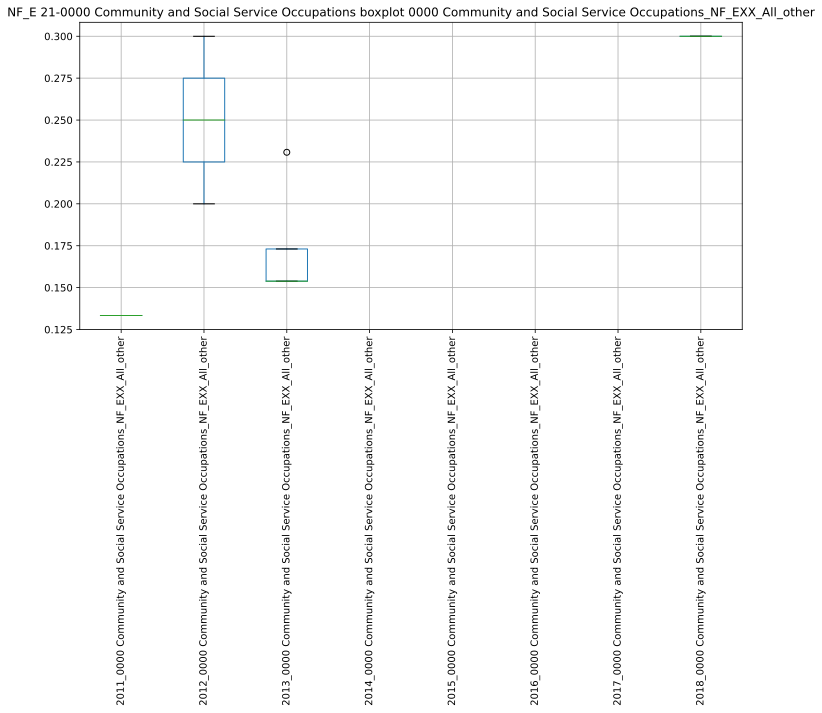

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040758.726461:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040758.763822:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040758.985355:INFO:headless_shell.cc(660)] Written to file /tmp/tmpb7v0nnjy/temp.png.
[1014/040759.203290:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040759.245449:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040759.551417:INFO:headless_shell.cc(660)] Written to file /tmp/tmpluyfqzck/temp.png.
[1014/040759.823863:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040759.852270:WARNI

,2011_0000 Community and Social Service Occupations_NF_EXX_All_other,2012_0000 Community and Social Service Occupations_NF_EXX_All_other,2013_0000 Community and Social Service Occupations_NF_EXX_All_other,2014_0000 Community and Social Service Occupations_NF_EXX_All_other,2015_0000 Community and Social Service Occupations_NF_EXX_All_other,2016_0000 Community and Social Service Occupations_NF_EXX_All_other,2017_0000 Community and Social Service Occupations_NF_EXX_All_other,2018_0000 Community and Social Service Occupations_NF_EXX_All_other
2011_0000 Community and Social Service Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Community and Social Service Occupations_NF_EXX_All_other,nan,1.000000,nan,nan,nan,nan,nan,nan
2013_0000 Community and Social Service Occupations_NF_EXX_All_other,nan,nan,1.000000,nan,nan,nan,nan,nan
2014_0000 Community and Social Service Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Community and Social Service Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Community and Social Service Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Community and Social Service Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Community and Social Service Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['21-0000 Community and Social Service Occupations_NF_E7X_Overex', '21-0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal', '21-0000 Community and Social Service Occupations_NF_E2X_Transportion', '21-0000 Community and Social Service Occupations_NF_E6X_Contact', '21-0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip', '21-0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion', '21-0000 Community and Social Service Occupations_NF_E5X_Exposure', '21-0000 Community and Social Service Occupations_NF_EXX_All_other']


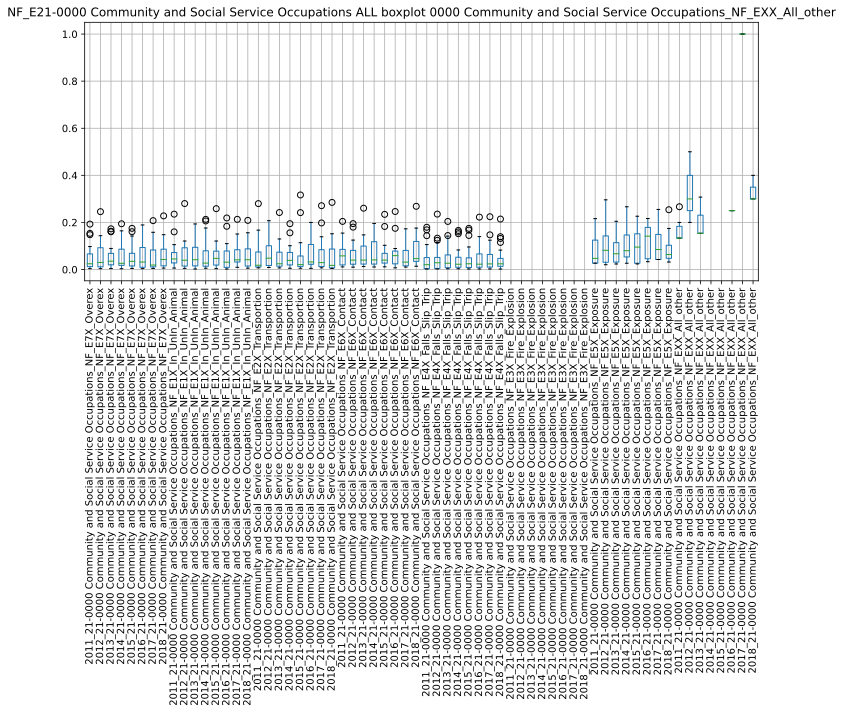

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040809.125763:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040809.166730:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040809.669773:INFO:headless_shell.cc(660)] Written to file /tmp/tmp75laflri/temp.png.
[1014/040809.894566:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040809.933481:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040810.600719:INFO:headless_shell.cc(660)] Written to file /tmp/tmpx6en1fu2/temp.png.
[1014/040810.932383:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040810.968737:WARNI

,2011_21-0000 Community and Social Service Occupations_NF_E7X_Overex,2012_21-0000 Community and Social Service Occupations_NF_E7X_Overex,2013_21-0000 Community and Social Service Occupations_NF_E7X_Overex,2014_21-0000 Community and Social Service Occupations_NF_E7X_Overex,2015_21-0000 Community and Social Service Occupations_NF_E7X_Overex,2016_21-0000 Community and Social Service Occupations_NF_E7X_Overex,2017_21-0000 Community and Social Service Occupations_NF_E7X_Overex,2018_21-0000 Community and Social Service Occupations_NF_E7X_Overex,2011_21-0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,2012_21-0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,2013_21-0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,2014_21-0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,2015_21-0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,2016_21-0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,2017_21-0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,2018_21-0000 Community and Social Service Occupations_NF_E1X_In_UnIn_Animal,2011_21-0000 Community and Social Service Occupations_NF_E2X_Transportion,2012_21-0000 Community and Social Service Occupations_NF_E2X_Transportion,2013_21-0000 Community and Social Service Occupations_NF_E2X_Transportion,2014_21-0000 Community and Social Service Occupations_NF_E2X_Transportion,2015_21-0000 Community and Social Service Occupations_NF_E2X_Transportion,2016_21-0000 Community and Social Service Occupations_NF_E2X_Transportion,2017_21-0000 Community and Social Service Occupations_NF_E2X_Transportion,2018_21-0000 Community and Social Service Occupations_NF_E2X_Transportion,2011_21-0000 Community and Social Service Occupations_NF_E6X_Contact,2012_21-0000 Community and Social Service Occupations_NF_E6X_Contact,2013_21-0000 Community and Social Service Occupations_NF_E6X_Contact,2014_21-0000 Community and Social Service Occupations_NF_E6X_Contact,2015_21-0000 Community and Social Service Occupations_NF_E6X_Contact,2016_21-0000 Community and Social Service Occupations_NF_E6X_Contact,2017_21-0000 Community and Social Service Occupations_NF_E6X_Contact,2018_21-0000 Community and Social Service Occupations_NF_E6X_Contact,2011_21-0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,2012_21-0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,2013_21-0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,2014_21-0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,2015_21-0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,2016_21-0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,2017_21-0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,2018_21-0000 Community and Social Service Occupations_NF_E4X_Falls_Slip_Trip,2011_21-0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,2012_21-0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,2013_21-0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,2014_21-0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,2015_21-0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,2016_21-0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,2017_21-0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,2018_21-0000 Community and Social Service Occupations_NF_E3X_Fire_Explosion,2011_21-0000 Community and Social Service Occupations_NF_E5X_Exposure,2012_21-0000 Community and Social Service Occupations_NF_E5X_Exposure,2013_21-0000 Community and Social Service Occupations_NF_E5X_Exposure,2014_21-0000 Community and Social Service Occupations_NF_E5X_Exposure,2015_21-0000 Community and Social Service Occupations_NF_E5X_Exposure,2016_21-0000 Community and Social Service Occupations_NF_E5X_Exposure,2017_21-0000 Community and Social Service Occupations_NF_E5

########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
NF_E7X_Overex_all.csv
NF_E1X_In_UnIn_Animal_all.csv
NF_E2X_Transportion_all.csv
NF_E6X_Contact_all.csv
NF_E4X_Falls_Slip_Trip_all.csv
NF_E3X_Fire_Explosion_all.csv
NF_E5X_Exposure_all.csv
NF_EXX_All_other_all.csv
dict_keys(['NF_E7X_Overex', 'NF_E1X_In_UnIn_Animal', 'NF_E2X_Transportion', 'NF_E6X_Contact', 'NF_E4X_Falls_Slip_Trip', 'NF_E3X_Fire_Explosion', 'NF_E5X_Exposure', 'NF_EXX_All_other'])
############ OCCUPATION ############
23-0000 Legal Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
23-0000 Legal Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ###########

/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
NF_E7X_Overex_all.csv
NF_E1X_In_UnIn_Animal_all.csv
NF_E2X_Transportion_all.csv
NF_E6X_Contact_all.csv
NF_E4X_Falls_Slip_Trip_all.csv
NF_E3X_Fire_Explosion_all.csv
NF_E5X_Exposure_all.csv
NF_EXX_All_other_all.csv
dict_keys(['NF_E7X_Overex', 'NF_E1X_In_UnIn_Animal', 'NF_E2X_Transportion', 'NF_E6X_Contact', 'NF_E4X_Falls_Slip_Trip', 'NF_E3X_Fire_Explosion', 'NF_E5X_Exposure', 'NF_EXX_All_other'])
############ OCCUPATION ############
23-0000 Legal Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
23-0000 Legal Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
23-0000 Legal Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
23-0000 Legal Occupations
 
########## NEED TO EVAL ##

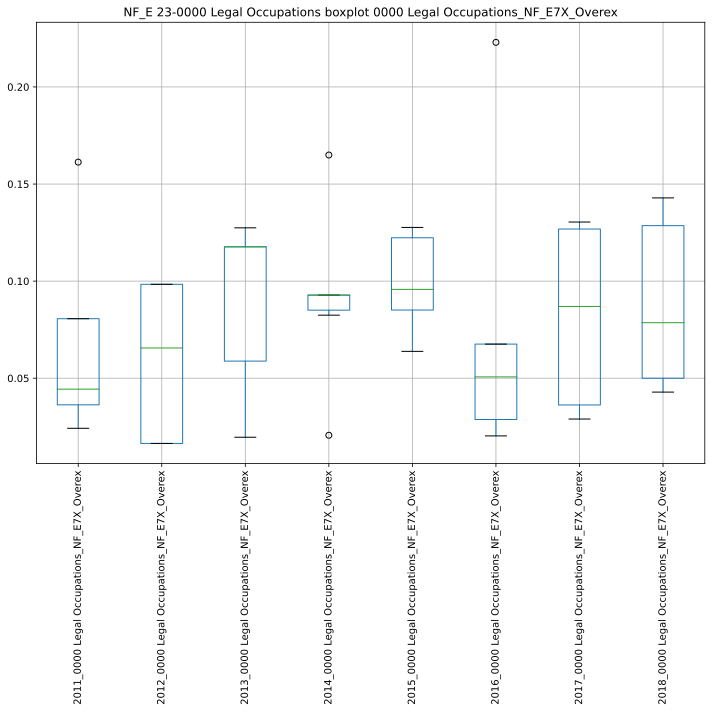

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040937.089631:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040937.126210:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040937.341326:INFO:headless_shell.cc(660)] Written to file /tmp/tmpga456uyg/temp.png.
[1014/040937.565384:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040937.602146:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040937.904249:INFO:headless_shell.cc(660)] Written to file /tmp/tmpveagjehg/temp.png.
[1014/040938.171040:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040938.208699:WARNI

,2011_0000 Legal Occupations_NF_E7X_Overex,2012_0000 Legal Occupations_NF_E7X_Overex,2013_0000 Legal Occupations_NF_E7X_Overex,2014_0000 Legal Occupations_NF_E7X_Overex,2015_0000 Legal Occupations_NF_E7X_Overex,2016_0000 Legal Occupations_NF_E7X_Overex,2017_0000 Legal Occupations_NF_E7X_Overex,2018_0000 Legal Occupations_NF_E7X_Overex
2011_0000 Legal Occupations_NF_E7X_Overex,1.000000,-0.207849,0.675103,-0.961605,-0.728705,-0.771929,-0.701053,-0.218773
2012_0000 Legal Occupations_NF_E7X_Overex,-0.207849,1.000000,0.105802,-0.000000,-0.907218,0.332684,-0.646762,-0.931381
2013_0000 Legal Occupations_NF_E7X_Overex,0.675103,0.105802,1.000000,-0.820291,0.625487,-0.978969,-0.523366,0.152771
2014_0000 Legal Occupations_NF_E7X_Overex,-0.961605,-0.000000,-0.820291,1.000000,-0.235250,0.865654,0.606658,-0.054082
2015_0000 Legal Occupations_NF_E7X_Overex,-0.728705,-0.907218,0.625487,-0.235250,1.000000,-0.459226,0.455179,0.690580
2016_0000 Legal Occupations_NF_E7X_Overex,-0.771929,0.332684,-0.978969,0.865654,-0.459226,1.000000,0.574832,0.051028
2017_0000 Legal Occupations_NF_E7X_Overex,-0.701053,-0.646762,-0.523366,0.606658,0.455179,0.574832,1.000000,0.747113
2018_0000 Legal Occupations_NF_E7X_Overex,-0.218773,-0.931381,0.152771,-0.054082,0.690580,0.051028,0.747113,1.000000


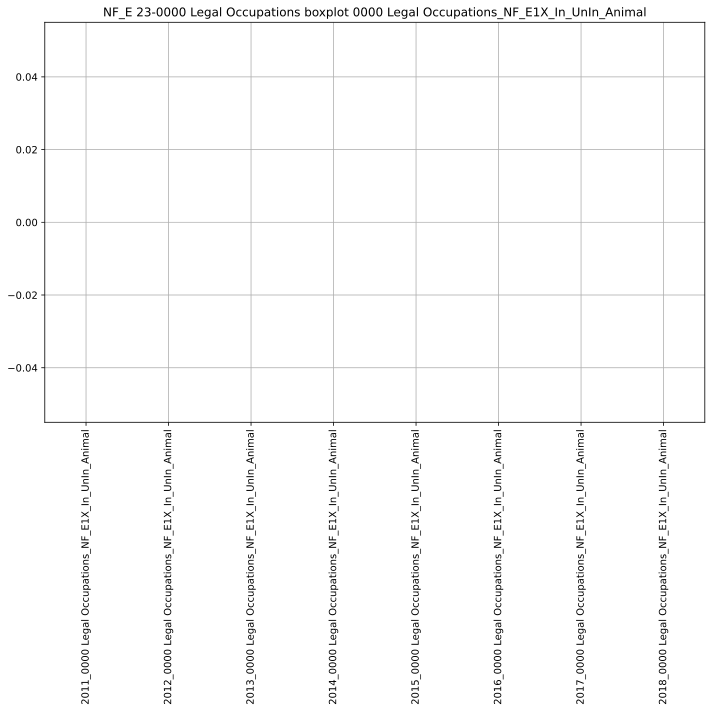

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040939.813150:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040939.848407:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040940.055473:INFO:headless_shell.cc(660)] Written to file /tmp/tmpqkhnj7c_/temp.png.
[1014/040940.269193:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040940.308317:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040940.573788:INFO:headless_shell.cc(660)] Written to file /tmp/tmpxas2pfdb/temp.png.
[1014/040940.839796:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040940.878284:WARNI

,2011_0000 Legal Occupations_NF_E1X_In_UnIn_Animal,2012_0000 Legal Occupations_NF_E1X_In_UnIn_Animal,2013_0000 Legal Occupations_NF_E1X_In_UnIn_Animal,2014_0000 Legal Occupations_NF_E1X_In_UnIn_Animal,2015_0000 Legal Occupations_NF_E1X_In_UnIn_Animal,2016_0000 Legal Occupations_NF_E1X_In_UnIn_Animal,2017_0000 Legal Occupations_NF_E1X_In_UnIn_Animal,2018_0000 Legal Occupations_NF_E1X_In_UnIn_Animal
2011_0000 Legal Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Legal Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Legal Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Legal Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Legal Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Legal Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Legal Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Legal Occupations_NF_E1X_In_UnIn_Animal,nan,nan,nan,nan,nan,nan,nan,nan


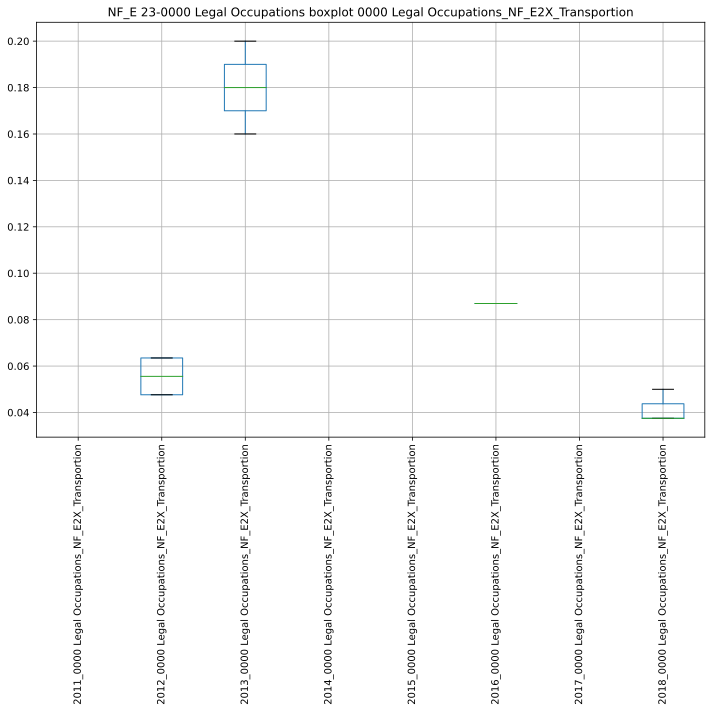

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040943.605178:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040943.641979:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040943.853709:INFO:headless_shell.cc(660)] Written to file /tmp/tmpng0bptt9/temp.png.
[1014/040944.071688:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040944.110361:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040944.380085:INFO:headless_shell.cc(660)] Written to file /tmp/tmpoh6qqq6j/temp.png.
[1014/040944.647142:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040944.684776:WARNI

,2011_0000 Legal Occupations_NF_E2X_Transportion,2012_0000 Legal Occupations_NF_E2X_Transportion,2013_0000 Legal Occupations_NF_E2X_Transportion,2014_0000 Legal Occupations_NF_E2X_Transportion,2015_0000 Legal Occupations_NF_E2X_Transportion,2016_0000 Legal Occupations_NF_E2X_Transportion,2017_0000 Legal Occupations_NF_E2X_Transportion,2018_0000 Legal Occupations_NF_E2X_Transportion
2011_0000 Legal Occupations_NF_E2X_Transportion,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Legal Occupations_NF_E2X_Transportion,nan,1.000000,nan,nan,nan,nan,nan,nan
2013_0000 Legal Occupations_NF_E2X_Transportion,nan,nan,1.000000,nan,nan,nan,nan,1.000000
2014_0000 Legal Occupations_NF_E2X_Transportion,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Legal Occupations_NF_E2X_Transportion,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Legal Occupations_NF_E2X_Transportion,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Legal Occupations_NF_E2X_Transportion,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Legal Occupations_NF_E2X_Transportion,nan,nan,1.000000,nan,nan,nan,nan,1.000000


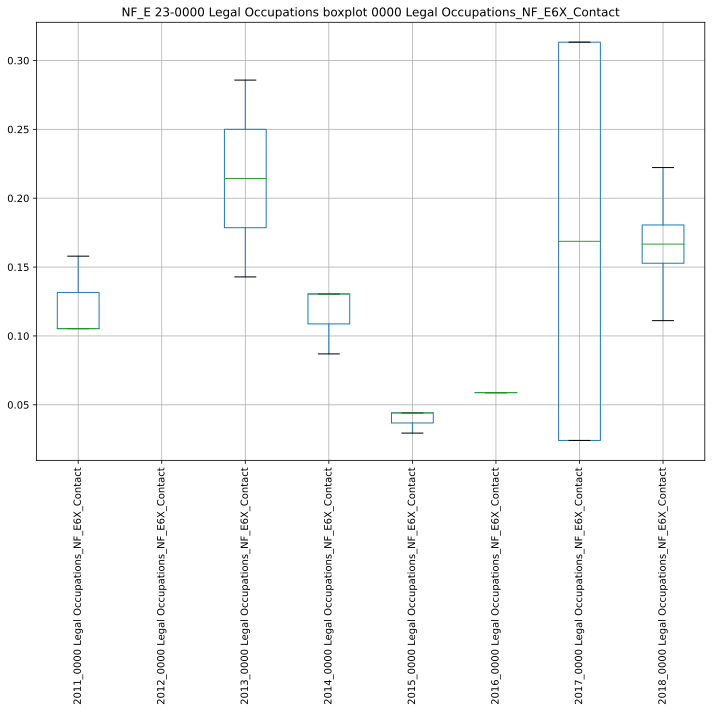

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040947.276291:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040947.310919:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040947.522917:INFO:headless_shell.cc(660)] Written to file /tmp/tmpfl45z7hq/temp.png.
[1014/040947.737501:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040947.776662:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040948.050975:INFO:headless_shell.cc(660)] Written to file /tmp/tmpueyc0rul/temp.png.
[1014/040948.325100:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040948.365574:WARNI

,2011_0000 Legal Occupations_NF_E6X_Contact,2012_0000 Legal Occupations_NF_E6X_Contact,2013_0000 Legal Occupations_NF_E6X_Contact,2014_0000 Legal Occupations_NF_E6X_Contact,2015_0000 Legal Occupations_NF_E6X_Contact,2016_0000 Legal Occupations_NF_E6X_Contact,2017_0000 Legal Occupations_NF_E6X_Contact,2018_0000 Legal Occupations_NF_E6X_Contact
2011_0000 Legal Occupations_NF_E6X_Contact,1.000000,nan,1.000000,nan,nan,nan,nan,nan
2012_0000 Legal Occupations_NF_E6X_Contact,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Legal Occupations_NF_E6X_Contact,1.000000,nan,1.000000,nan,nan,nan,1.000000,1.000000
2014_0000 Legal Occupations_NF_E6X_Contact,nan,nan,nan,1.000000,1.000000,nan,1.000000,-1.000000
2015_0000 Legal Occupations_NF_E6X_Contact,nan,nan,nan,1.000000,1.000000,nan,1.000000,-1.000000
2016_0000 Legal Occupations_NF_E6X_Contact,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Legal Occupations_NF_E6X_Contact,nan,nan,1.000000,1.000000,1.000000,nan,1.000000,0.000000
2018_0000 Legal Occupations_NF_E6X_Contact,nan,nan,1.000000,-1.000000,-1.000000,nan,0.000000,1.000000


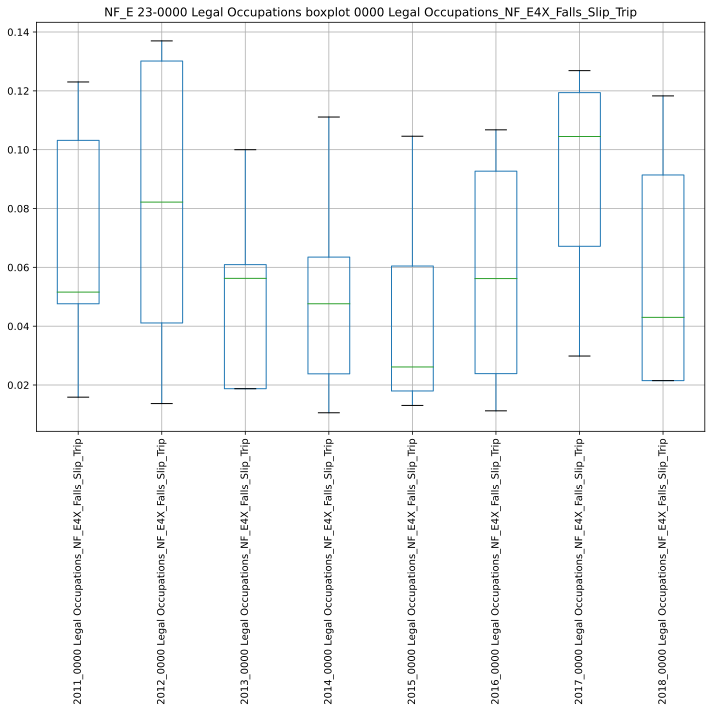

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040949.980161:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040950.017799:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040950.246928:INFO:headless_shell.cc(660)] Written to file /tmp/tmpmrd0vx1f/temp.png.
[1014/040950.473866:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040950.512465:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040950.793786:INFO:headless_shell.cc(660)] Written to file /tmp/tmpwgka_zey/temp.png.
[1014/040951.057305:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040951.099188:WARNI

,2011_0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,2012_0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,2013_0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,2014_0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,2015_0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,2016_0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,2017_0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,2018_0000 Legal Occupations_NF_E4X_Falls_Slip_Trip
2011_0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,1.000000,0.968076,-0.054910,0.992603,1.000000,0.358669,0.271205,0.515120
2012_0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,0.968076,1.000000,-0.218750,0.902449,-0.176132,0.433125,0.625424,0.203585
2013_0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,-0.054910,-0.218750,1.000000,-0.462324,0.561566,0.732010,0.597438,0.304095
2014_0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,0.992603,0.902449,-0.462324,1.000000,-0.504430,0.975636,0.974355,0.843274
2015_0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,1.000000,-0.176132,0.561566,-0.504430,1.000000,0.983871,1.000000,0.918510
2016_0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,0.358669,0.433125,0.732010,0.975636,0.983871,1.000000,0.983003,0.941483
2017_0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,0.271205,0.625424,0.597438,0.974355,1.000000,0.983003,1.000000,0.925547
2018_0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,0.515120,0.203585,0.304095,0.843274,0.918510,0.941483,0.925547,1.000000


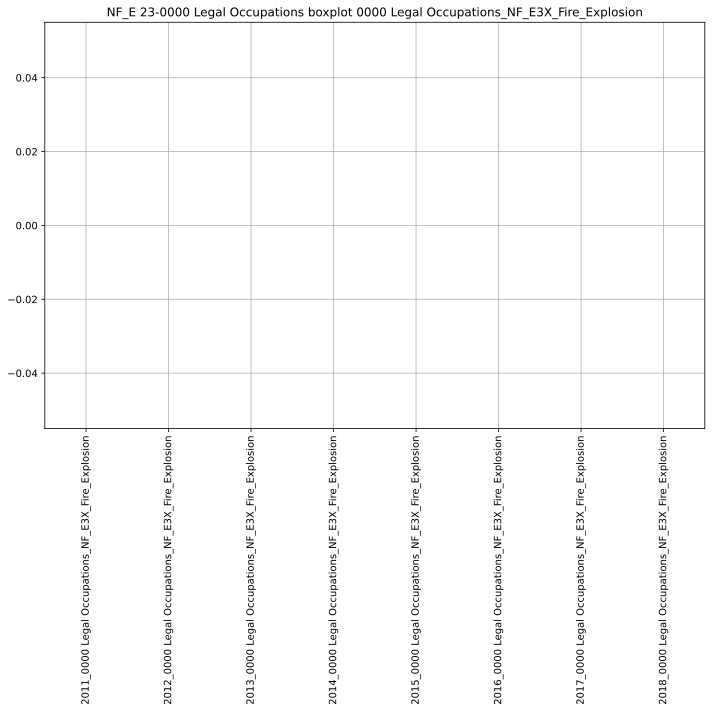

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040953.694913:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040953.730127:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040953.946050:INFO:headless_shell.cc(660)] Written to file /tmp/tmpje7wngmt/temp.png.
[1014/040954.164963:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040954.206148:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040954.485730:INFO:headless_shell.cc(660)] Written to file /tmp/tmpr4wwn63p/temp.png.
[1014/040954.750657:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040954.787515:WARNI

,2011_0000 Legal Occupations_NF_E3X_Fire_Explosion,2012_0000 Legal Occupations_NF_E3X_Fire_Explosion,2013_0000 Legal Occupations_NF_E3X_Fire_Explosion,2014_0000 Legal Occupations_NF_E3X_Fire_Explosion,2015_0000 Legal Occupations_NF_E3X_Fire_Explosion,2016_0000 Legal Occupations_NF_E3X_Fire_Explosion,2017_0000 Legal Occupations_NF_E3X_Fire_Explosion,2018_0000 Legal Occupations_NF_E3X_Fire_Explosion
2011_0000 Legal Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Legal Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Legal Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Legal Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Legal Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Legal Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Legal Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Legal Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan


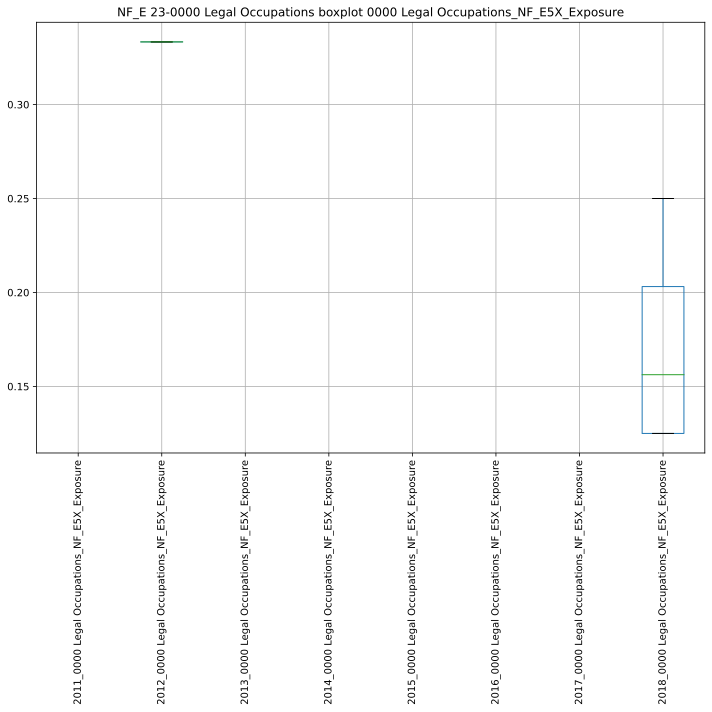

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/040957.389871:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040957.431577:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040957.637885:INFO:headless_shell.cc(660)] Written to file /tmp/tmp6oiu4mdc/temp.png.
[1014/040957.854744:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040957.892448:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/040958.164655:INFO:headless_shell.cc(660)] Written to file /tmp/tmpon09vsyv/temp.png.
[1014/040958.436121:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/040958.475308:WARNI

,2011_0000 Legal Occupations_NF_E5X_Exposure,2012_0000 Legal Occupations_NF_E5X_Exposure,2013_0000 Legal Occupations_NF_E5X_Exposure,2014_0000 Legal Occupations_NF_E5X_Exposure,2015_0000 Legal Occupations_NF_E5X_Exposure,2016_0000 Legal Occupations_NF_E5X_Exposure,2017_0000 Legal Occupations_NF_E5X_Exposure,2018_0000 Legal Occupations_NF_E5X_Exposure
2011_0000 Legal Occupations_NF_E5X_Exposure,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Legal Occupations_NF_E5X_Exposure,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Legal Occupations_NF_E5X_Exposure,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Legal Occupations_NF_E5X_Exposure,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Legal Occupations_NF_E5X_Exposure,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Legal Occupations_NF_E5X_Exposure,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Legal Occupations_NF_E5X_Exposure,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Legal Occupations_NF_E5X_Exposure,nan,nan,nan,nan,nan,nan,nan,1.000000


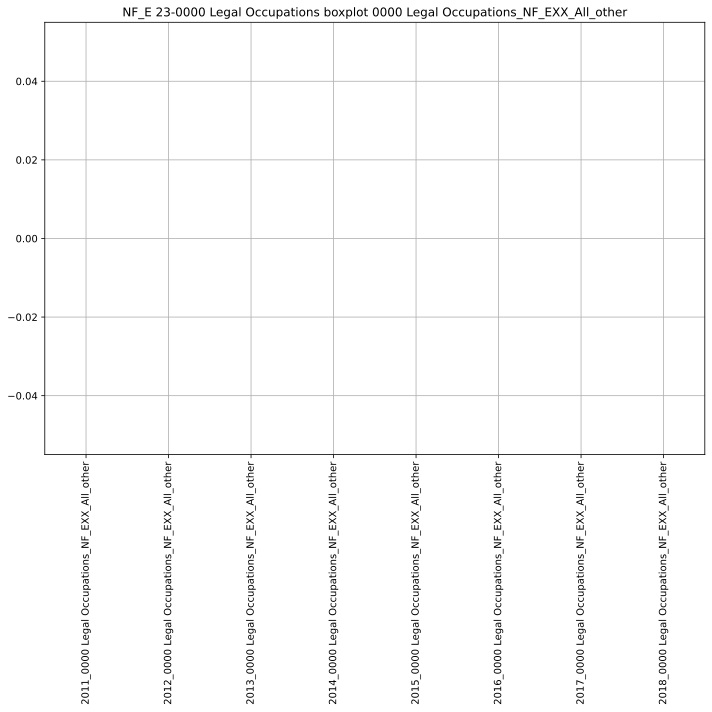

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/041001.063958:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041001.101795:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041001.306337:INFO:headless_shell.cc(660)] Written to file /tmp/tmpndh406uz/temp.png.
[1014/041001.528419:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041001.568885:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041001.846893:INFO:headless_shell.cc(660)] Written to file /tmp/tmppqm17z69/temp.png.
[1014/041002.118852:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041002.155531:WARNI

,2011_0000 Legal Occupations_NF_EXX_All_other,2012_0000 Legal Occupations_NF_EXX_All_other,2013_0000 Legal Occupations_NF_EXX_All_other,2014_0000 Legal Occupations_NF_EXX_All_other,2015_0000 Legal Occupations_NF_EXX_All_other,2016_0000 Legal Occupations_NF_EXX_All_other,2017_0000 Legal Occupations_NF_EXX_All_other,2018_0000 Legal Occupations_NF_EXX_All_other
2011_0000 Legal Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Legal Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Legal Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Legal Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Legal Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Legal Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Legal Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Legal Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['23-0000 Legal Occupations_NF_E7X_Overex', '23-0000 Legal Occupations_NF_E1X_In_UnIn_Animal', '23-0000 Legal Occupations_NF_E2X_Transportion', '23-0000 Legal Occupations_NF_E6X_Contact', '23-0000 Legal Occupations_NF_E4X_Falls_Slip_Trip', '23-0000 Legal Occupations_NF_E3X_Fire_Explosion', '23-0000 Legal Occupations_NF_E5X_Exposure', '23-0000 Legal Occupations_NF_EXX_All_other']


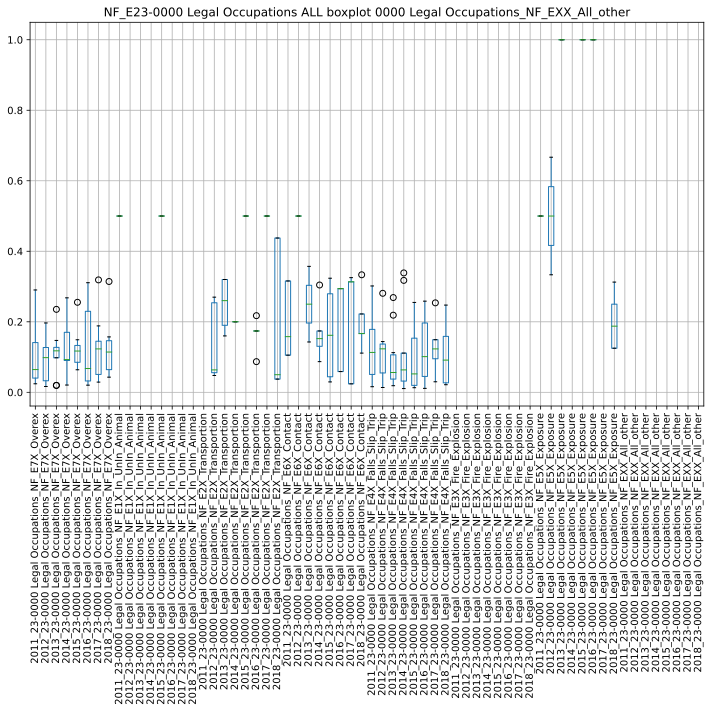

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/041010.160007:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041010.197339:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041010.677823:INFO:headless_shell.cc(660)] Written to file /tmp/tmpf7ncdsyo/temp.png.
[1014/041010.900945:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041010.939341:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041011.586494:INFO:headless_shell.cc(660)] Written to file /tmp/tmpjn9cno28/temp.png.
[1014/041011.920535:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041011.959822:WARNI

,2011_23-0000 Legal Occupations_NF_E7X_Overex,2012_23-0000 Legal Occupations_NF_E7X_Overex,2013_23-0000 Legal Occupations_NF_E7X_Overex,2014_23-0000 Legal Occupations_NF_E7X_Overex,2015_23-0000 Legal Occupations_NF_E7X_Overex,2016_23-0000 Legal Occupations_NF_E7X_Overex,2017_23-0000 Legal Occupations_NF_E7X_Overex,2018_23-0000 Legal Occupations_NF_E7X_Overex,2011_23-0000 Legal Occupations_NF_E1X_In_UnIn_Animal,2012_23-0000 Legal Occupations_NF_E1X_In_UnIn_Animal,2013_23-0000 Legal Occupations_NF_E1X_In_UnIn_Animal,2014_23-0000 Legal Occupations_NF_E1X_In_UnIn_Animal,2015_23-0000 Legal Occupations_NF_E1X_In_UnIn_Animal,2016_23-0000 Legal Occupations_NF_E1X_In_UnIn_Animal,2017_23-0000 Legal Occupations_NF_E1X_In_UnIn_Animal,2018_23-0000 Legal Occupations_NF_E1X_In_UnIn_Animal,2011_23-0000 Legal Occupations_NF_E2X_Transportion,2012_23-0000 Legal Occupations_NF_E2X_Transportion,2013_23-0000 Legal Occupations_NF_E2X_Transportion,2014_23-0000 Legal Occupations_NF_E2X_Transportion,2015_23-0000 Legal Occupations_NF_E2X_Transportion,2016_23-0000 Legal Occupations_NF_E2X_Transportion,2017_23-0000 Legal Occupations_NF_E2X_Transportion,2018_23-0000 Legal Occupations_NF_E2X_Transportion,2011_23-0000 Legal Occupations_NF_E6X_Contact,2012_23-0000 Legal Occupations_NF_E6X_Contact,2013_23-0000 Legal Occupations_NF_E6X_Contact,2014_23-0000 Legal Occupations_NF_E6X_Contact,2015_23-0000 Legal Occupations_NF_E6X_Contact,2016_23-0000 Legal Occupations_NF_E6X_Contact,2017_23-0000 Legal Occupations_NF_E6X_Contact,2018_23-0000 Legal Occupations_NF_E6X_Contact,2011_23-0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,2012_23-0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,2013_23-0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,2014_23-0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,2015_23-0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,2016_23-0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,2017_23-0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,2018_23-0000 Legal Occupations_NF_E4X_Falls_Slip_Trip,2011_23-0000 Legal Occupations_NF_E3X_Fire_Explosion,2012_23-0000 Legal Occupations_NF_E3X_Fire_Explosion,2013_23-0000 Legal Occupations_NF_E3X_Fire_Explosion,2014_23-0000 Legal Occupations_NF_E3X_Fire_Explosion,2015_23-0000 Legal Occupations_NF_E3X_Fire_Explosion,2016_23-0000 Legal Occupations_NF_E3X_Fire_Explosion,2017_23-0000 Legal Occupations_NF_E3X_Fire_Explosion,2018_23-0000 Legal Occupations_NF_E3X_Fire_Explosion,2011_23-0000 Legal Occupations_NF_E5X_Exposure,2012_23-0000 Legal Occupations_NF_E5X_Exposure,2013_23-0000 Legal Occupations_NF_E5X_Exposure,2014_23-0000 Legal Occupations_NF_E5X_Exposure,2015_23-0000 Legal Occupations_NF_E5X_Exposure,2016_23-0000 Legal Occupations_NF_E5X_Exposure,2017_23-0000 Legal Occupations_NF_E5X_Exposure,2018_23-0000 Legal Occupations_NF_E5X_Exposure,2011_23-0000 Legal Occupations_NF_EXX_All_other,2012_23-0000 Legal Occupations_NF_EXX_All_other,2013_23-0000 Legal Occupations_NF_EXX_All_other,2014_23-0000 Legal Occupations_NF_EXX_All_other,2015_23-0000 Legal Occupations_NF_EXX_All_other,2016_23-0000 Legal Occupations_NF_EXX_All_other,2017_23-0000 Legal Occupations_NF_EXX_All_other,2018_23-0000 Legal Occupations_NF_EXX_All_other
2011_23-0000 Legal Occupations_NF_E7X_Overex,1.000000,-0.372525,-0.286488,-0.091383,-0.304603,0.012224,-0.071149,-0.134589,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.698948,0.980196,nan,nan,-0.105681,nan,-0.354576,-0.430272,nan,0.000000,-0.277498,-0.538873,0.343622,0.329084,-0.634297,-0.152381,-0.148756,-0.175272,-0.343313,0.018559,0.088481,-0.344676,-0.024879,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,-0.459781,nan,nan,nan,nan,nan,nan,nan,nan
2012_23-0000 Legal Occupations_NF_E7X_Overex,-0.372525,1.000000,0.149120,-0.168622,-0.423123,-0.135800,-0.442485,-0.584793,nan,nan,nan,nan,nan,nan,nan,nan,nan,-0.031549,0.927252,nan,nan,-0.678540,nan,0.979187,0.944365,nan,-0.137102,0.015340,-0.308032,-0.981525,-0.983753,-0.354485,-0.692219,-0.152479,0.544224,0.537724,0.683576,0.031532,-0.492325,0.132161,nan,nan

########################################## NEW OCCUPATION ###############################################

########################################## NEW YEAR ###############################################
SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
NF_E7X_Overex_all.csv
NF_E1X_In_UnIn_Animal_all.csv
NF_E2X_Transportion_all.csv
NF_E6X_Contact_all.csv
NF_E4X_Falls_Slip_Trip_all.csv
NF_E3X_Fire_Explosion_all.csv
NF_E5X_Exposure_all.csv
NF_EXX_All_other_all.csv
dict_keys(['NF_E7X_Overex', 'NF_E1X_In_UnIn_Animal', 'NF_E2X_Transportion', 'NF_E6X_Contact', 'NF_E4X_Falls_Slip_Trip', 'NF_E3X_Fire_Explosion', 'NF_E5X_Exposure', 'NF_EXX_All_other'])
############ OCCUPATION ############
25-0000 Educational Instruction and Library Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
25-0000 Educational Instruction and Library Occupations
 
########## NEED TO EVAL ##################
########## NEED TO

/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ediaz/.local/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


SOC_all.csv
global_y_soc1 found.
global_soc1_empty found.
NF_E7X_Overex_all.csv
NF_E1X_In_UnIn_Animal_all.csv
NF_E2X_Transportion_all.csv
NF_E6X_Contact_all.csv
NF_E4X_Falls_Slip_Trip_all.csv
NF_E3X_Fire_Explosion_all.csv
NF_E5X_Exposure_all.csv
NF_EXX_All_other_all.csv
dict_keys(['NF_E7X_Overex', 'NF_E1X_In_UnIn_Animal', 'NF_E2X_Transportion', 'NF_E6X_Contact', 'NF_E4X_Falls_Slip_Trip', 'NF_E3X_Fire_Explosion', 'NF_E5X_Exposure', 'NF_EXX_All_other'])
############ OCCUPATION ############
25-0000 Educational Instruction and Library Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
25-0000 Educational Instruction and Library Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
############ OCCUPATION ############
25-0000 Educational Instruction and Library Occupations
 
########## NEED TO EVAL ##################
########## NEED TO EVAL ##################
#

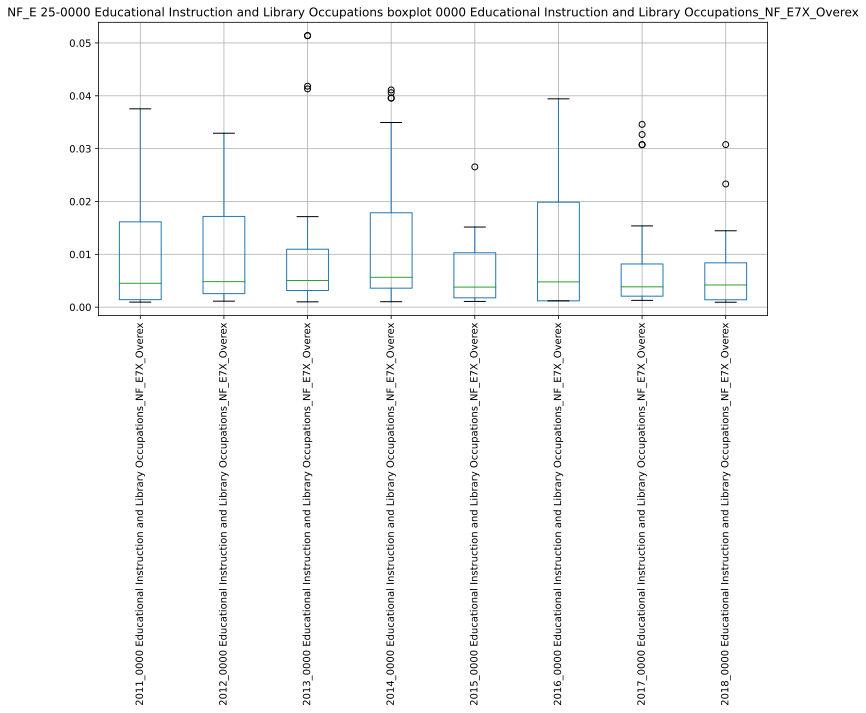

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/041112.645655:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041112.689815:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041112.943861:INFO:headless_shell.cc(660)] Written to file /tmp/tmpu02_rmvu/temp.png.
[1014/041113.177799:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041113.205383:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041113.518994:INFO:headless_shell.cc(660)] Written to file /tmp/tmp46l0v46t/temp.png.
[1014/041113.787801:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041113.825283:WARNI

,2011_0000 Educational Instruction and Library Occupations_NF_E7X_Overex,2012_0000 Educational Instruction and Library Occupations_NF_E7X_Overex,2013_0000 Educational Instruction and Library Occupations_NF_E7X_Overex,2014_0000 Educational Instruction and Library Occupations_NF_E7X_Overex,2015_0000 Educational Instruction and Library Occupations_NF_E7X_Overex,2016_0000 Educational Instruction and Library Occupations_NF_E7X_Overex,2017_0000 Educational Instruction and Library Occupations_NF_E7X_Overex,2018_0000 Educational Instruction and Library Occupations_NF_E7X_Overex
2011_0000 Educational Instruction and Library Occupations_NF_E7X_Overex,1.000000,0.441410,0.487998,0.130939,0.006691,0.414865,-0.169066,0.192656
2012_0000 Educational Instruction and Library Occupations_NF_E7X_Overex,0.441410,1.000000,0.222809,0.310303,0.700838,0.274215,0.123776,0.089985
2013_0000 Educational Instruction and Library Occupations_NF_E7X_Overex,0.487998,0.222809,1.000000,-0.110664,0.189326,0.894298,-0.212530,-0.228186
2014_0000 Educational Instruction and Library Occupations_NF_E7X_Overex,0.130939,0.310303,-0.110664,1.000000,0.359144,-0.118108,0.699918,0.360868
2015_0000 Educational Instruction and Library Occupations_NF_E7X_Overex,0.006691,0.700838,0.189326,0.359144,1.000000,0.205742,0.678828,0.185105
2016_0000 Educational Instruction and Library Occupations_NF_E7X_Overex,0.414865,0.274215,0.894298,-0.118108,0.205742,1.000000,-0.171342,-0.353078
2017_0000 Educational Instruction and Library Occupations_NF_E7X_Overex,-0.169066,0.123776,-0.212530,0.699918,0.678828,-0.171342,1.000000,0.572876
2018_0000 Educational Instruction and Library Occupations_NF_E7X_Overex,0.192656,0.089985,-0.228186,0.360868,0.185105,-0.353078,0.572876,1.000000


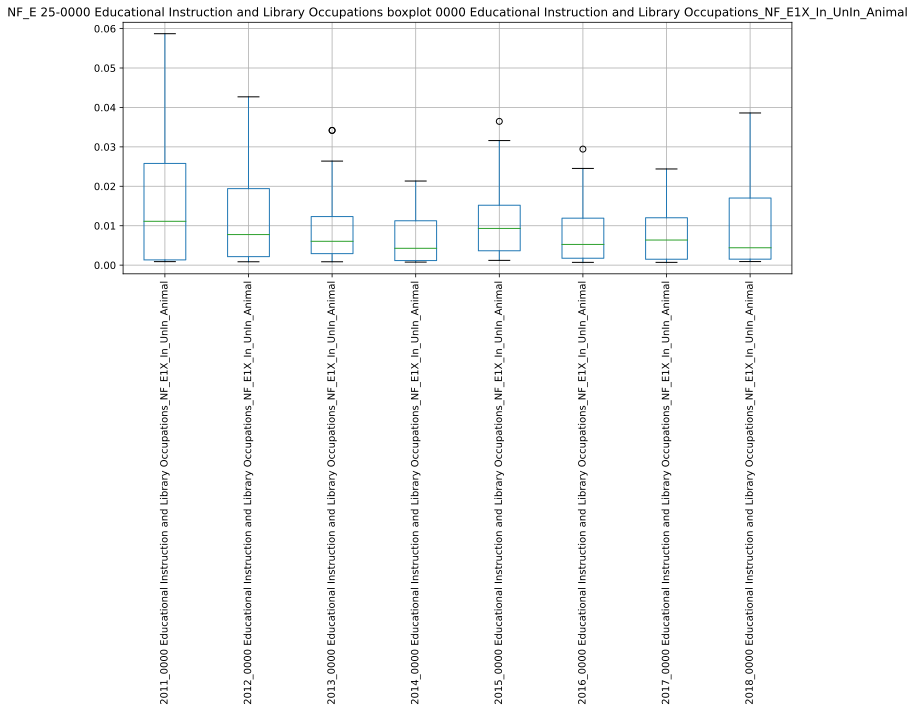

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/041117.863433:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041117.901871:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041118.131502:INFO:headless_shell.cc(660)] Written to file /tmp/tmpf7f4z0ji/temp.png.
[1014/041118.356898:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041118.397669:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041118.680457:INFO:headless_shell.cc(660)] Written to file /tmp/tmp6wb199r6/temp.png.
[1014/041118.952708:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041118.989181:WARNI

,2011_0000 Educational Instruction and Library Occupations_NF_E1X_In_UnIn_Animal,2012_0000 Educational Instruction and Library Occupations_NF_E1X_In_UnIn_Animal,2013_0000 Educational Instruction and Library Occupations_NF_E1X_In_UnIn_Animal,2014_0000 Educational Instruction and Library Occupations_NF_E1X_In_UnIn_Animal,2015_0000 Educational Instruction and Library Occupations_NF_E1X_In_UnIn_Animal,2016_0000 Educational Instruction and Library Occupations_NF_E1X_In_UnIn_Animal,2017_0000 Educational Instruction and Library Occupations_NF_E1X_In_UnIn_Animal,2018_0000 Educational Instruction and Library Occupations_NF_E1X_In_UnIn_Animal
2011_0000 Educational Instruction and Library Occupations_NF_E1X_In_UnIn_Animal,1.000000,0.340094,0.335274,0.114662,-0.191378,0.015707,-0.122504,0.269144
2012_0000 Educational Instruction and Library Occupations_NF_E1X_In_UnIn_Animal,0.340094,1.000000,-0.017697,0.107838,0.103274,-0.047070,-0.135987,-0.171465
2013_0000 Educational Instruction and Library Occupations_NF_E1X_In_UnIn_Animal,0.335274,-0.017697,1.000000,0.334549,-0.235368,0.593990,0.333133,0.001206
2014_0000 Educational Instruction and Library Occupations_NF_E1X_In_UnIn_Animal,0.114662,0.107838,0.334549,1.000000,0.568748,-0.048688,0.218694,0.178705
2015_0000 Educational Instruction and Library Occupations_NF_E1X_In_UnIn_Animal,-0.191378,0.103274,-0.235368,0.568748,1.000000,-0.344308,0.146540,0.172006
2016_0000 Educational Instruction and Library Occupations_NF_E1X_In_UnIn_Animal,0.015707,-0.047070,0.593990,-0.048688,-0.344308,1.000000,0.055575,0.121223
2017_0000 Educational Instruction and Library Occupations_NF_E1X_In_UnIn_Animal,-0.122504,-0.135987,0.333133,0.218694,0.146540,0.055575,1.000000,-0.132044
2018_0000 Educational Instruction and Library Occupations_NF_E1X_In_UnIn_Animal,0.269144,-0.171465,0.001206,0.178705,0.172006,0.121223,-0.132044,1.000000


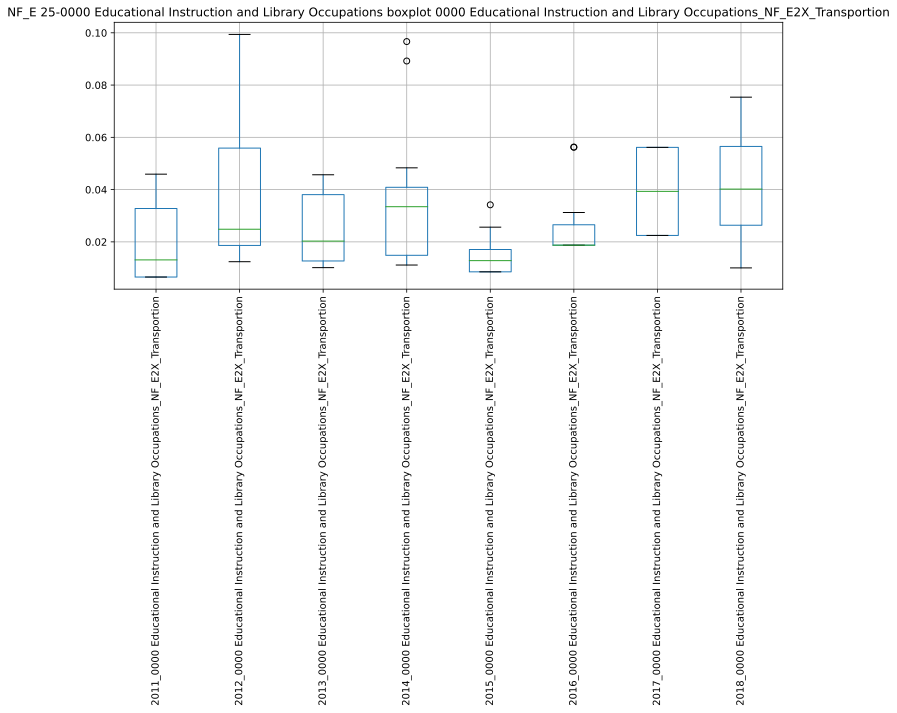

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/041123.081616:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041123.122218:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041123.336471:INFO:headless_shell.cc(660)] Written to file /tmp/tmprkzd5hpr/temp.png.
[1014/041123.572755:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041123.601528:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041123.917302:INFO:headless_shell.cc(660)] Written to file /tmp/tmpz549q8y4/temp.png.
[1014/041124.191868:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041124.245833:WARNI

,2011_0000 Educational Instruction and Library Occupations_NF_E2X_Transportion,2012_0000 Educational Instruction and Library Occupations_NF_E2X_Transportion,2013_0000 Educational Instruction and Library Occupations_NF_E2X_Transportion,2014_0000 Educational Instruction and Library Occupations_NF_E2X_Transportion,2015_0000 Educational Instruction and Library Occupations_NF_E2X_Transportion,2016_0000 Educational Instruction and Library Occupations_NF_E2X_Transportion,2017_0000 Educational Instruction and Library Occupations_NF_E2X_Transportion,2018_0000 Educational Instruction and Library Occupations_NF_E2X_Transportion
2011_0000 Educational Instruction and Library Occupations_NF_E2X_Transportion,1.000000,0.951530,0.339028,0.989147,-0.623859,-0.387258,-0.365148,-0.358941
2012_0000 Educational Instruction and Library Occupations_NF_E2X_Transportion,0.951530,1.000000,0.173518,0.115937,-0.621880,-0.328250,0.092450,-0.670858
2013_0000 Educational Instruction and Library Occupations_NF_E2X_Transportion,0.339028,0.173518,1.000000,-0.099413,0.251822,-0.254313,0.200609,0.218851
2014_0000 Educational Instruction and Library Occupations_NF_E2X_Transportion,0.989147,0.115937,-0.099413,1.000000,-0.651486,0.934220,0.288332,0.487590
2015_0000 Educational Instruction and Library Occupations_NF_E2X_Transportion,-0.623859,-0.621880,0.251822,-0.651486,1.000000,0.914354,0.574805,0.557961
2016_0000 Educational Instruction and Library Occupations_NF_E2X_Transportion,-0.387258,-0.328250,-0.254313,0.934220,0.914354,1.000000,0.570701,0.903534
2017_0000 Educational Instruction and Library Occupations_NF_E2X_Transportion,-0.365148,0.092450,0.200609,0.288332,0.574805,0.570701,1.000000,0.850640
2018_0000 Educational Instruction and Library Occupations_NF_E2X_Transportion,-0.358941,-0.670858,0.218851,0.487590,0.557961,0.903534,0.850640,1.000000


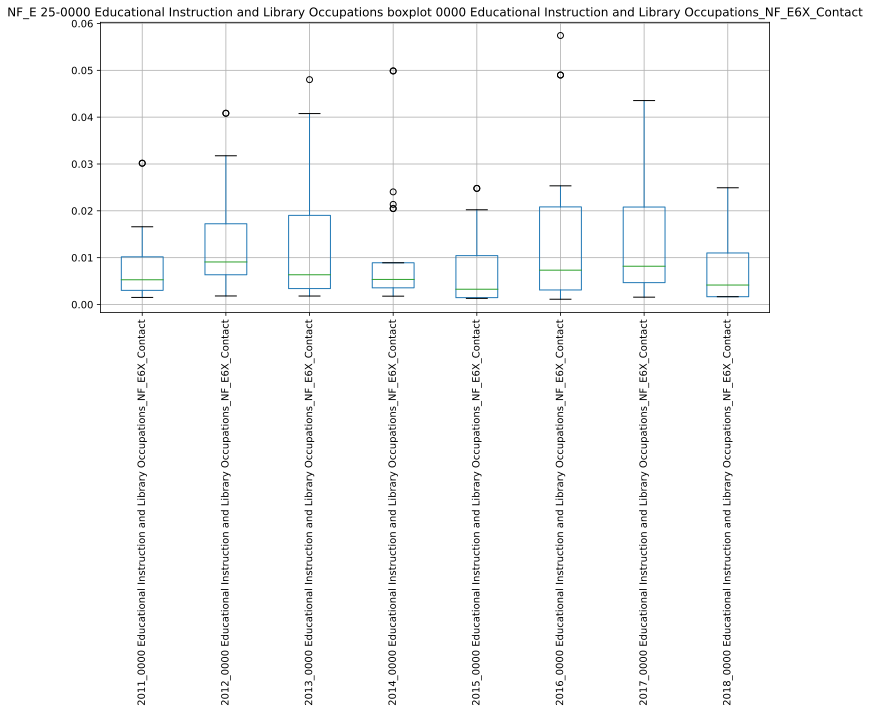

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/041128.377260:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041128.414415:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041128.656157:INFO:headless_shell.cc(660)] Written to file /tmp/tmpm9e3gn31/temp.png.
[1014/041128.883411:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041128.919046:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041129.240438:INFO:headless_shell.cc(660)] Written to file /tmp/tmpdroavjdq/temp.png.
[1014/041129.519526:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041129.558760:WARNI

,2011_0000 Educational Instruction and Library Occupations_NF_E6X_Contact,2012_0000 Educational Instruction and Library Occupations_NF_E6X_Contact,2013_0000 Educational Instruction and Library Occupations_NF_E6X_Contact,2014_0000 Educational Instruction and Library Occupations_NF_E6X_Contact,2015_0000 Educational Instruction and Library Occupations_NF_E6X_Contact,2016_0000 Educational Instruction and Library Occupations_NF_E6X_Contact,2017_0000 Educational Instruction and Library Occupations_NF_E6X_Contact,2018_0000 Educational Instruction and Library Occupations_NF_E6X_Contact
2011_0000 Educational Instruction and Library Occupations_NF_E6X_Contact,1.000000,0.323548,0.363662,0.063645,0.438122,0.233206,0.878398,0.551405
2012_0000 Educational Instruction and Library Occupations_NF_E6X_Contact,0.323548,1.000000,0.770402,0.369507,0.473885,0.662273,0.287591,0.187322
2013_0000 Educational Instruction and Library Occupations_NF_E6X_Contact,0.363662,0.770402,1.000000,0.256698,0.826088,0.887466,0.078198,-0.173367
2014_0000 Educational Instruction and Library Occupations_NF_E6X_Contact,0.063645,0.369507,0.256698,1.000000,0.347988,0.189235,-0.045369,-0.014947
2015_0000 Educational Instruction and Library Occupations_NF_E6X_Contact,0.438122,0.473885,0.826088,0.347988,1.000000,0.578409,0.395056,-0.098068
2016_0000 Educational Instruction and Library Occupations_NF_E6X_Contact,0.233206,0.662273,0.887466,0.189235,0.578409,1.000000,0.071046,-0.169721
2017_0000 Educational Instruction and Library Occupations_NF_E6X_Contact,0.878398,0.287591,0.078198,-0.045369,0.395056,0.071046,1.000000,0.290780
2018_0000 Educational Instruction and Library Occupations_NF_E6X_Contact,0.551405,0.187322,-0.173367,-0.014947,-0.098068,-0.169721,0.290780,1.000000


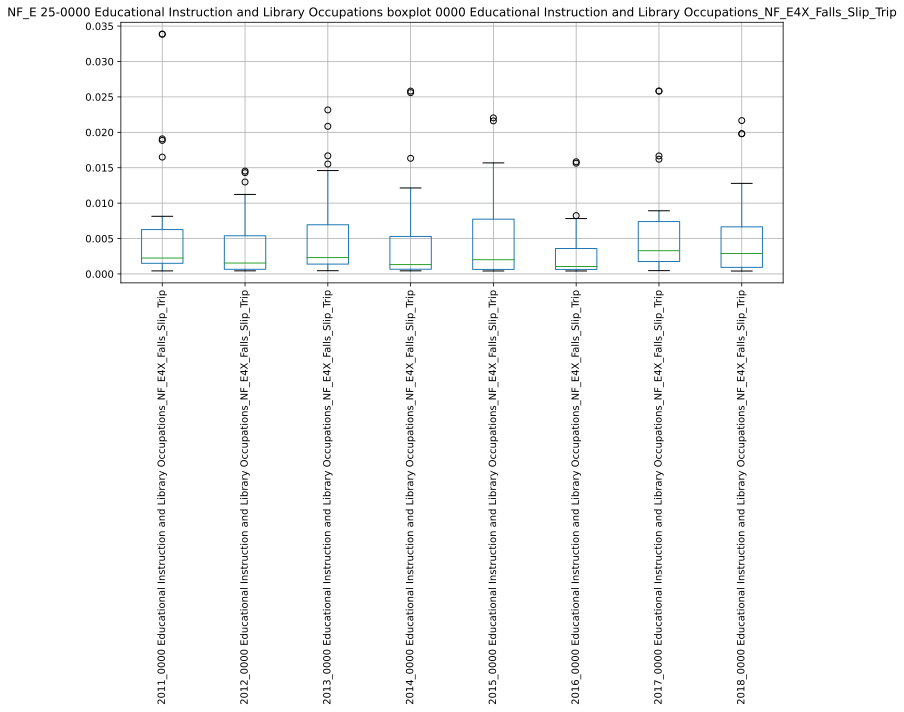

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/041133.645378:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041133.683231:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041133.916788:INFO:headless_shell.cc(660)] Written to file /tmp/tmpmlhjr2hs/temp.png.
[1014/041134.148909:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041134.177023:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041134.480804:INFO:headless_shell.cc(660)] Written to file /tmp/tmp8z9up48m/temp.png.
[1014/041134.752843:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041134.789837:WARNI

,2011_0000 Educational Instruction and Library Occupations_NF_E4X_Falls_Slip_Trip,2012_0000 Educational Instruction and Library Occupations_NF_E4X_Falls_Slip_Trip,2013_0000 Educational Instruction and Library Occupations_NF_E4X_Falls_Slip_Trip,2014_0000 Educational Instruction and Library Occupations_NF_E4X_Falls_Slip_Trip,2015_0000 Educational Instruction and Library Occupations_NF_E4X_Falls_Slip_Trip,2016_0000 Educational Instruction and Library Occupations_NF_E4X_Falls_Slip_Trip,2017_0000 Educational Instruction and Library Occupations_NF_E4X_Falls_Slip_Trip,2018_0000 Educational Instruction and Library Occupations_NF_E4X_Falls_Slip_Trip
2011_0000 Educational Instruction and Library Occupations_NF_E4X_Falls_Slip_Trip,1.000000,-0.179526,0.432510,-0.123234,0.019680,0.311007,-0.107043,-0.300106
2012_0000 Educational Instruction and Library Occupations_NF_E4X_Falls_Slip_Trip,-0.179526,1.000000,0.064616,0.406522,-0.419562,0.221323,0.643267,0.099336
2013_0000 Educational Instruction and Library Occupations_NF_E4X_Falls_Slip_Trip,0.432510,0.064616,1.000000,0.008911,-0.123312,0.325262,-0.012472,-0.155825
2014_0000 Educational Instruction and Library Occupations_NF_E4X_Falls_Slip_Trip,-0.123234,0.406522,0.008911,1.000000,-0.148323,0.253529,0.149883,0.202783
2015_0000 Educational Instruction and Library Occupations_NF_E4X_Falls_Slip_Trip,0.019680,-0.419562,-0.123312,-0.148323,1.000000,0.060832,0.181706,0.028832
2016_0000 Educational Instruction and Library Occupations_NF_E4X_Falls_Slip_Trip,0.311007,0.221323,0.325262,0.253529,0.060832,1.000000,-0.014320,0.054920
2017_0000 Educational Instruction and Library Occupations_NF_E4X_Falls_Slip_Trip,-0.107043,0.643267,-0.012472,0.149883,0.181706,-0.014320,1.000000,0.126049
2018_0000 Educational Instruction and Library Occupations_NF_E4X_Falls_Slip_Trip,-0.300106,0.099336,-0.155825,0.202783,0.028832,0.054920,0.126049,1.000000


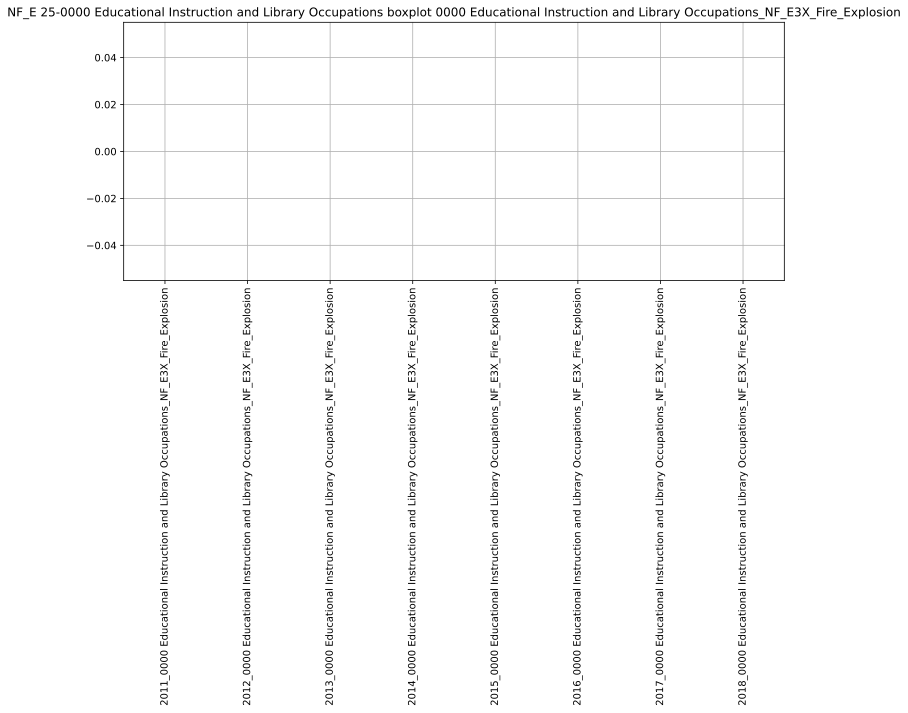

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/041138.828609:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041138.866443:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041139.109344:INFO:headless_shell.cc(660)] Written to file /tmp/tmp70go5ht2/temp.png.
[1014/041139.326347:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041139.368229:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041139.642947:INFO:headless_shell.cc(660)] Written to file /tmp/tmp2z5osl8v/temp.png.
[1014/041139.914276:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041139.953766:WARNI

,2011_0000 Educational Instruction and Library Occupations_NF_E3X_Fire_Explosion,2012_0000 Educational Instruction and Library Occupations_NF_E3X_Fire_Explosion,2013_0000 Educational Instruction and Library Occupations_NF_E3X_Fire_Explosion,2014_0000 Educational Instruction and Library Occupations_NF_E3X_Fire_Explosion,2015_0000 Educational Instruction and Library Occupations_NF_E3X_Fire_Explosion,2016_0000 Educational Instruction and Library Occupations_NF_E3X_Fire_Explosion,2017_0000 Educational Instruction and Library Occupations_NF_E3X_Fire_Explosion,2018_0000 Educational Instruction and Library Occupations_NF_E3X_Fire_Explosion
2011_0000 Educational Instruction and Library Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2012_0000 Educational Instruction and Library Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Educational Instruction and Library Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2014_0000 Educational Instruction and Library Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2015_0000 Educational Instruction and Library Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Educational Instruction and Library Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Educational Instruction and Library Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Educational Instruction and Library Occupations_NF_E3X_Fire_Explosion,nan,nan,nan,nan,nan,nan,nan,nan


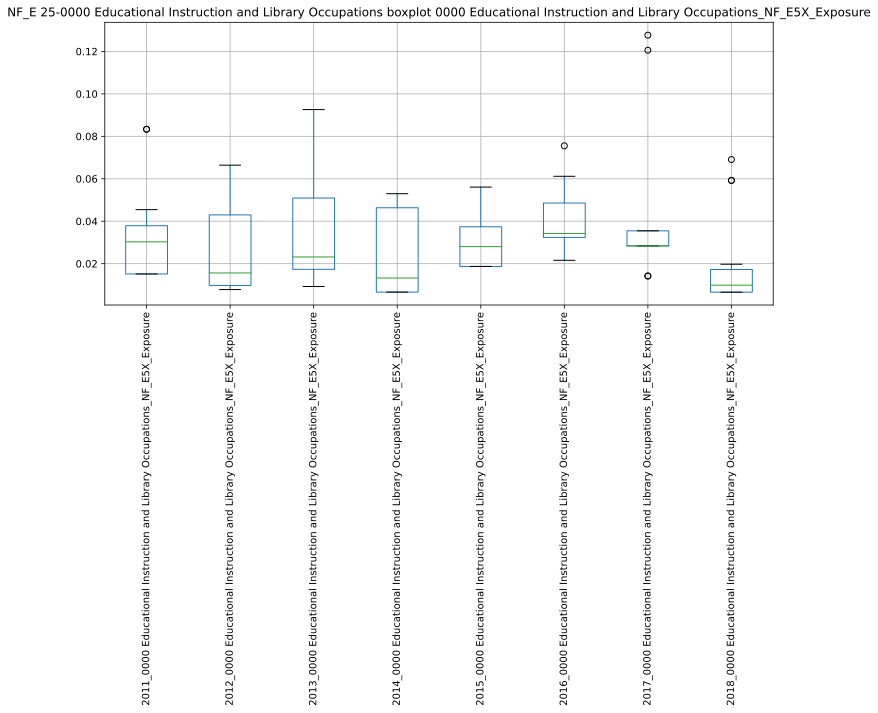

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/041143.990413:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041144.025931:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041144.241044:INFO:headless_shell.cc(660)] Written to file /tmp/tmpsuv3j0mu/temp.png.
[1014/041144.457261:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041144.494941:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041144.818677:INFO:headless_shell.cc(660)] Written to file /tmp/tmpxlj763op/temp.png.
[1014/041145.085280:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041145.120994:WARNI

,2011_0000 Educational Instruction and Library Occupations_NF_E5X_Exposure,2012_0000 Educational Instruction and Library Occupations_NF_E5X_Exposure,2013_0000 Educational Instruction and Library Occupations_NF_E5X_Exposure,2014_0000 Educational Instruction and Library Occupations_NF_E5X_Exposure,2015_0000 Educational Instruction and Library Occupations_NF_E5X_Exposure,2016_0000 Educational Instruction and Library Occupations_NF_E5X_Exposure,2017_0000 Educational Instruction and Library Occupations_NF_E5X_Exposure,2018_0000 Educational Instruction and Library Occupations_NF_E5X_Exposure
2011_0000 Educational Instruction and Library Occupations_NF_E5X_Exposure,1.000000,0.225074,-0.309789,-0.337437,0.251610,-0.052451,-0.450428,-0.417762
2012_0000 Educational Instruction and Library Occupations_NF_E5X_Exposure,0.225074,1.000000,0.588890,-0.178514,-0.358333,-0.699288,-0.106231,0.087557
2013_0000 Educational Instruction and Library Occupations_NF_E5X_Exposure,-0.309789,0.588890,1.000000,0.626347,-0.696143,-0.072196,-0.495845,-0.398820
2014_0000 Educational Instruction and Library Occupations_NF_E5X_Exposure,-0.337437,-0.178514,0.626347,1.000000,-0.037244,-0.043963,nan,0.325247
2015_0000 Educational Instruction and Library Occupations_NF_E5X_Exposure,0.251610,-0.358333,-0.696143,-0.037244,1.000000,-0.282256,0.060193,0.182412
2016_0000 Educational Instruction and Library Occupations_NF_E5X_Exposure,-0.052451,-0.699288,-0.072196,-0.043963,-0.282256,1.000000,0.117921,0.243265
2017_0000 Educational Instruction and Library Occupations_NF_E5X_Exposure,-0.450428,-0.106231,-0.495845,nan,0.060193,0.117921,1.000000,0.927173
2018_0000 Educational Instruction and Library Occupations_NF_E5X_Exposure,-0.417762,0.087557,-0.398820,0.325247,0.182412,0.243265,0.927173,1.000000


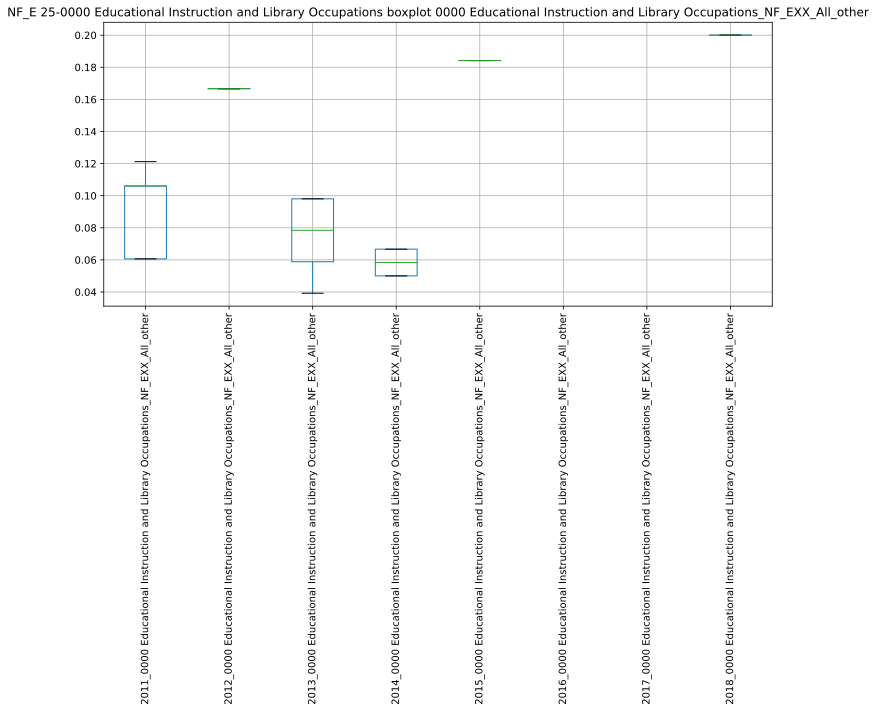

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/041149.380220:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041149.418120:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041149.654088:INFO:headless_shell.cc(660)] Written to file /tmp/tmpka345_93/temp.png.
[1014/041149.873230:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041149.911110:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041150.210893:INFO:headless_shell.cc(660)] Written to file /tmp/tmpil8gnax9/temp.png.
[1014/041150.485724:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041150.520552:WARNI

,2011_0000 Educational Instruction and Library Occupations_NF_EXX_All_other,2012_0000 Educational Instruction and Library Occupations_NF_EXX_All_other,2013_0000 Educational Instruction and Library Occupations_NF_EXX_All_other,2014_0000 Educational Instruction and Library Occupations_NF_EXX_All_other,2015_0000 Educational Instruction and Library Occupations_NF_EXX_All_other,2016_0000 Educational Instruction and Library Occupations_NF_EXX_All_other,2017_0000 Educational Instruction and Library Occupations_NF_EXX_All_other,2018_0000 Educational Instruction and Library Occupations_NF_EXX_All_other
2011_0000 Educational Instruction and Library Occupations_NF_EXX_All_other,1.000000,nan,-0.936781,-0.762713,nan,nan,nan,nan
2012_0000 Educational Instruction and Library Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2013_0000 Educational Instruction and Library Occupations_NF_EXX_All_other,-0.936781,nan,1.000000,0.944911,nan,nan,nan,nan
2014_0000 Educational Instruction and Library Occupations_NF_EXX_All_other,-0.762713,nan,0.944911,1.000000,nan,nan,nan,nan
2015_0000 Educational Instruction and Library Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2016_0000 Educational Instruction and Library Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2017_0000 Educational Instruction and Library Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan
2018_0000 Educational Instruction and Library Occupations_NF_EXX_All_other,nan,nan,nan,nan,nan,nan,nan,nan


########################################## CORRELATIONS ###############################################
['25-0000 Educational Instruction and Library Occupations_NF_E7X_Overex', '25-0000 Educational Instruction and Library Occupations_NF_E1X_In_UnIn_Animal', '25-0000 Educational Instruction and Library Occupations_NF_E2X_Transportion', '25-0000 Educational Instruction and Library Occupations_NF_E6X_Contact', '25-0000 Educational Instruction and Library Occupations_NF_E4X_Falls_Slip_Trip', '25-0000 Educational Instruction and Library Occupations_NF_E3X_Fire_Explosion', '25-0000 Educational Instruction and Library Occupations_NF_E5X_Exposure', '25-0000 Educational Instruction and Library Occupations_NF_EXX_All_other']


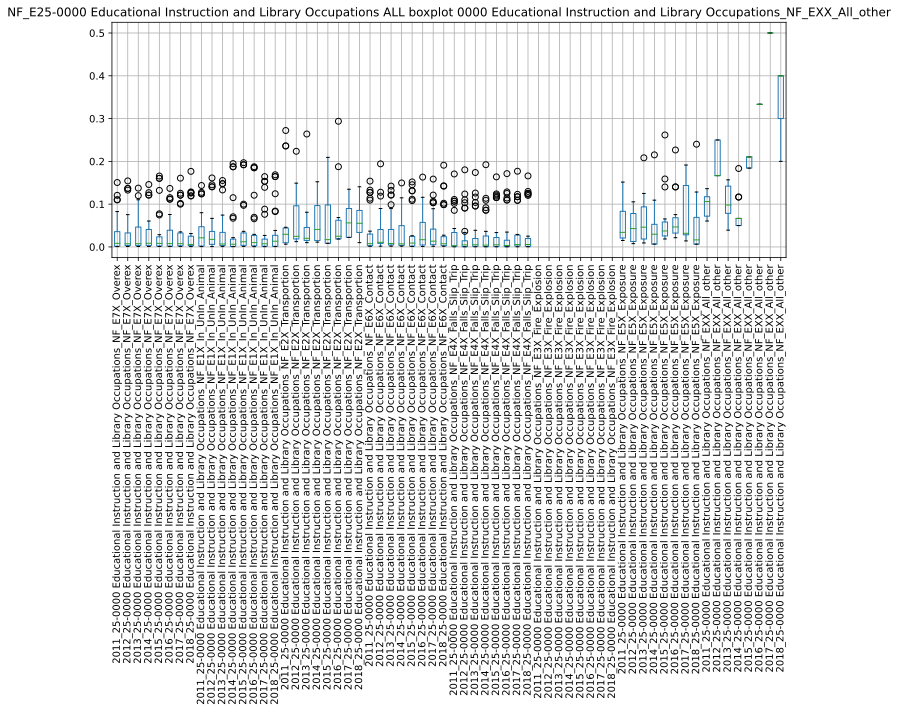

/usr/local/lib/python3.8/dist-packages/dataframe_image/_pandas_accessor.py:69: FutureWarning: this method is deprecated in favour of `Styler.to_html()`
  html = '<div>' + obj.render() + '</div>'
[1014/041201.314455:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041201.352396:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041201.844465:INFO:headless_shell.cc(660)] Written to file /tmp/tmpum7vz441/temp.png.
[1014/041202.065034:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041202.101790:WARNING:sandbox_linux.cc(376)] InitializeSandbox() called with multiple threads in process gpu-process.
[1014/041202.767052:INFO:headless_shell.cc(660)] Written to file /tmp/tmp5wzghixe/temp.png.
[1014/041203.091797:WARNING:bluez_dbus_manager.cc(247)] Floss manager not present, cannot set Floss enable/disable.
[1014/041203.127420:WARNI

SyntaxError: not a PNG file (<string>)

In [6]:

for ocup_sel in range(1,24):
    
    print("########################################## NEW OCCUPATION ###############################################")
    print("")
    global_y_soc1 = []

    for year in range(0,8):  
        print("########################################## NEW YEAR ###############################################")
        desired_file_output = "./NF_SUB_GENDER/NF_GENDER_" + str(2011+year) + "_"    
        %run ./analysis-code-subcat.ipynb
    
    print("########################################## BOX PLOTS ###############################################")
    gen_boxplot()

    print("########################################## CORRELATIONS ###############################################")
    gen_corr()